In [1]:
import os

# Define the directory path
directory_path = '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/ESA_CCI_LC_reclass_clean'

# List all files in the directory
files = os.listdir(directory_path)

# Print the list of files
for file in files:
    print(file)


ESACCI-LC-L4-LCCS-Map-300m-P1Y-1997-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-1996-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2009-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2005-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
.DS_Store
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2003-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2008-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
C3S-LC-L4-LCCS-Map-300m-P1Y-2018-v2.1.1.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2004-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2002-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-2011-v2.0.7cds.area-subset.48.40.30.-10_reclass_clean.nc
C3S-LC-L4-LCCS-Map-300m-P1Y-2017-v2.1.1.area-subset.48.40.30.-10_reclass_clean.nc
ESACCI-LC-L4-LCCS-Map-300m-P1Y-201

In [4]:
import os
import numpy as np
import grass.script as gs
from netCDF4 import Dataset
import rasterio
from rasterio.transform import from_origin
import tempfile

def export_to_geotiff(nc_file, var_name, output_path):
    """Export NetCDF to GeoTIFF without reprojection"""
    with Dataset(nc_file, 'r') as nc:
        # Get the data (select first time slice if 3D)
        data = nc.variables[var_name][:]
        if len(data.shape) == 3:
            data = data[0,:,:]  # Remove time dimension
        
        # Get coordinates
        lats = nc.variables['lat'][:]
        lons = nc.variables['lon'][:]
        
        # Calculate transform
        transform = from_origin(lons.min(), lats.max(), 
                              abs(lons[1]-lons[0]), 
                              abs(lats[1]-lats[0]))
        
        # Write to GeoTIFF
        with rasterio.open(
            output_path,
            'w',
            driver='GTiff',
            height=data.shape[0],
            width=data.shape[1],
            count=1,
            dtype=data.dtype,
            crs='EPSG:4326',  # WGS84
            transform=transform,
        ) as dst:
            dst.write(data, 1)

def import_landcover_data():
    """Import all NetCDF land cover files"""
    directory_path = '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/ESA_CCI_LC_reclass_clean'
    nc_files = [f for f in os.listdir(directory_path) if f.endswith('.nc')]
    nc_files.sort()

    raster_dict = {}
    failed_imports = []

    for nc_file in nc_files:
        try:
            # Extract year from filename
            if "ESACCI" in nc_file:
                year = nc_file.split('-P1Y-')[1].split('-')[0]
            elif "C3S" in nc_file:
                year = nc_file.split('-P1Y-')[1].split('-')[0]
            else:
                continue
            
            raster_name = f"landcover_{year}"
            filepath = os.path.join(directory_path, nc_file)
            
            print(f"Processing {year}...")
            
            # Create temporary GeoTIFF
            with tempfile.NamedTemporaryFile(suffix='.tif', delete=False) as temp_tiff:
                temp_path = temp_tiff.name
            
            try:
                # Export to GeoTIFF
                export_to_geotiff(filepath, 'lccs_class', temp_path)
                
                # Import into GRASS with location auto-creation
                gs.run_command('r.import', input=temp_path,
                             output=raster_name,
                             resolution='value',
                             resolution_value=300,
                             flags='o',  # Override projection check
                             overwrite=True)
                
                raster_dict[year] = raster_name
                print(f"Successfully imported {raster_name}")
                
            finally:
                if os.path.exists(temp_path):
                    os.remove(temp_path)
                    
        except Exception as e:
            print(f"Failed to import {nc_file}: {str(e)}")
            failed_imports.append(nc_file)
    
    if failed_imports:
        print("\nFailed files:")
        for f in failed_imports:
            print(f" - {f}")
    
    return raster_dict

def main():
    print("Starting land cover import...")
    raster_dict = import_landcover_data()
    
    if raster_dict:
        print("\nSuccessfully imported:")
        for year, name in raster_dict.items():
            print(f"{year}: {name}")
        
        # Set computational region
        base_raster = next(iter(raster_dict.values()))
        print(f"\nSetting region to {base_raster}")
        gs.run_command('g.region', raster=base_raster)
    else:
        print("No rasters imported")

if __name__ == "__main__":
    main()

Starting land cover import...
Processing 2016...


Over-riding projection check
Importing raster map <landcover_2016>...



Successfully imported landcover_2016
Processing 2017...


Over-riding projection check
Importing raster map <landcover_2017>...



Successfully imported landcover_2017
Processing 2018...


Over-riding projection check
Importing raster map <landcover_2018>...



Successfully imported landcover_2018
Processing 2019...


Over-riding projection check
Importing raster map <landcover_2019>...



Successfully imported landcover_2019
Processing 2020...


Over-riding projection check
Importing raster map <landcover_2020>...



Successfully imported landcover_2020
Processing 2021...


Over-riding projection check
Importing raster map <landcover_2021>...



Successfully imported landcover_2021
Processing 2022...


Over-riding projection check
Importing raster map <landcover_2022>...



Successfully imported landcover_2022
Processing 1992...


Over-riding projection check
Importing raster map <landcover_1992>...



Successfully imported landcover_1992
Processing 1993...


Over-riding projection check
Importing raster map <landcover_1993>...



Successfully imported landcover_1993
Processing 1994...


Over-riding projection check
Importing raster map <landcover_1994>...



Successfully imported landcover_1994
Processing 1995...


Over-riding projection check
Importing raster map <landcover_1995>...



Successfully imported landcover_1995
Processing 1996...


Over-riding projection check
Importing raster map <landcover_1996>...



Successfully imported landcover_1996
Processing 1997...


Over-riding projection check
Importing raster map <landcover_1997>...



Successfully imported landcover_1997
Processing 1998...


Over-riding projection check
Importing raster map <landcover_1998>...



Successfully imported landcover_1998
Processing 1999...


Over-riding projection check
Importing raster map <landcover_1999>...



Successfully imported landcover_1999
Processing 2000...


Over-riding projection check
Importing raster map <landcover_2000>...



Successfully imported landcover_2000
Processing 2001...


Over-riding projection check
Importing raster map <landcover_2001>...



Successfully imported landcover_2001
Processing 2002...


Over-riding projection check
Importing raster map <landcover_2002>...



Successfully imported landcover_2002
Processing 2003...


Over-riding projection check
Importing raster map <landcover_2003>...



Successfully imported landcover_2003
Processing 2004...


Over-riding projection check
Importing raster map <landcover_2004>...



Successfully imported landcover_2004
Processing 2005...


Over-riding projection check
Importing raster map <landcover_2005>...



Successfully imported landcover_2005
Processing 2006...


Over-riding projection check
Importing raster map <landcover_2006>...



Successfully imported landcover_2006
Processing 2007...


Over-riding projection check
Importing raster map <landcover_2007>...



Successfully imported landcover_2007
Processing 2008...


Over-riding projection check
Importing raster map <landcover_2008>...



Successfully imported landcover_2008
Processing 2009...


Over-riding projection check
Importing raster map <landcover_2009>...



Successfully imported landcover_2009
Processing 2010...


Over-riding projection check
Importing raster map <landcover_2010>...



Successfully imported landcover_2010
Processing 2011...


Over-riding projection check
Importing raster map <landcover_2011>...



Successfully imported landcover_2011
Processing 2012...


Over-riding projection check
Importing raster map <landcover_2012>...



Successfully imported landcover_2012
Processing 2013...


Over-riding projection check
Importing raster map <landcover_2013>...



Successfully imported landcover_2013
Processing 2014...


Over-riding projection check
Importing raster map <landcover_2014>...



Successfully imported landcover_2014
Processing 2015...


Over-riding projection check
Importing raster map <landcover_2015>...



Successfully imported landcover_2015

Successfully imported:
2016: landcover_2016
2017: landcover_2017
2018: landcover_2018
2019: landcover_2019
2020: landcover_2020
2021: landcover_2021
2022: landcover_2022
1992: landcover_1992
1993: landcover_1993
1994: landcover_1994
1995: landcover_1995
1996: landcover_1996
1997: landcover_1997
1998: landcover_1998
1999: landcover_1999
2000: landcover_2000
2001: landcover_2001
2002: landcover_2002
2003: landcover_2003
2004: landcover_2004
2005: landcover_2005
2006: landcover_2006
2007: landcover_2007
2008: landcover_2008
2009: landcover_2009
2010: landcover_2010
2011: landcover_2011
2012: landcover_2012
2013: landcover_2013
2014: landcover_2014
2015: landcover_2015

Setting region to landcover_2016


In [8]:
import grass.script as gs

# 1. List all raster maps
raster_list = gs.list_strings(type='raster')
print("Imported raster maps:")
print(raster_list)

# 2. Get info about a specific raster
print("\nInfo for landcover_2016:")
print(gs.raster_info('landcover_2016'))

# 3. Alternative way to list rasters with pattern
landcover_maps = gs.parse_command('g.list', type='raster', pattern='landcover_*')
print("\nLand cover maps:")
print(landcover_maps)



Imported raster maps:
['landcover_1992@PERMANENT', 'landcover_1993@PERMANENT', 'landcover_1994@PERMANENT', 'landcover_1995@PERMANENT', 'landcover_1996@PERMANENT', 'landcover_1997@PERMANENT', 'landcover_1998@PERMANENT', 'landcover_1999@PERMANENT', 'landcover_2000@PERMANENT', 'landcover_2001@PERMANENT', 'landcover_2002@PERMANENT', 'landcover_2003@PERMANENT', 'landcover_2004@PERMANENT', 'landcover_2005@PERMANENT', 'landcover_2006@PERMANENT', 'landcover_2007@PERMANENT', 'landcover_2008@PERMANENT', 'landcover_2009@PERMANENT', 'landcover_2010@PERMANENT', 'landcover_2011@PERMANENT', 'landcover_2012@PERMANENT', 'landcover_2013@PERMANENT', 'landcover_2014@PERMANENT', 'landcover_2015@PERMANENT', 'landcover_2016@PERMANENT', 'landcover_2017@PERMANENT', 'landcover_2018@PERMANENT', 'landcover_2019@PERMANENT', 'landcover_2020@PERMANENT', 'landcover_2021@PERMANENT', 'landcover_2022@PERMANENT', 'merged_output_imported@PERMANENT']

Info for landcover_2016:
{'north': 47.99861111, 'south': 29.99861111, 'e

In [10]:
import grass.script as gs

# Set computational region to match landcover_2016
gs.run_command('g.region', raster='landcover_2016', flags='p')

# Alternatively, get region parameters as a Python dictionary
region_settings = gs.parse_command('g.region', flags='pg')
print("Current region settings:", region_settings)





projection: 99 (ETRS89-extended / LAEA Europe)
zone:       0
datum:      etrs89
ellipsoid:  grs80
north:      47.99861111
south:      29.99861111
west:       -9.99861111
east:       40.00138889
nsres:      0.00277778
ewres:      0.00277778
rows:       6480
cols:       18000
cells:      116640000
Current region settings: {'projection': '99', 'zone': '0', 'n': '47.99861111', 's': '29.99861111', 'w': '-9.99861111', 'e': '40.00138889', 'nsres': '0.00277778', 'ewres': '0.00277778', 'rows': '6480', 'cols': '18000', 'cells': '116640000'}


In [13]:
import os
import grass.script as gs
import grass.jupyter as gj
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# Verify environment variables
print("Current GRASS setup:")
print(f"GISBASE: {os.getenv('GISBASE')}")
print(f"GISDBASE: {os.getenv('GISDBASE')}")
print(f"LOCATION_NAME: {os.getenv('LOCATION_NAME')}")
print(f"MAPSET: {os.getenv('MAPSET')}")

# Initialize GRASS session with YOUR specific paths
gisdb = os.path.expanduser("~/grassdata")
location = "my_location"
mapset = "PERMANENT"

try:
    gj.init(gisdb, location, mapset)
    print("\nGRASS session initialized successfully!")
    print(f"Location: {gisdb}/{location}/{mapset}")
    
    # Verify we can see your landcover data
    landcover_maps = gs.list_strings(type='raster', pattern="landcover_*")
    print("\nAvailable landcover maps:")
    for lc in landcover_maps:
        print(f"- {lc}")
        
except Exception as e:
    print(f"\nError initializing GRASS: {e}")
    print("Please verify:")
    print(f"1. Location exists: {os.path.exists(os.path.join(gisdb, location))}")
    print(f"2. Mapset exists: {os.path.exists(os.path.join(gisdb, location, mapset))}")


    

Current GRASS setup:
GISBASE: /Applications/GRASS-8.4.app/Contents/Resources
GISDBASE: /Users/ghulamabbaszafari/grassdata
LOCATION_NAME: my_location
MAPSET: PERMANENT

GRASS session initialized successfully!
Location: /Users/ghulamabbaszafari/grassdata/my_location/PERMANENT

Available landcover maps:
- landcover_1992@PERMANENT
- landcover_1993@PERMANENT
- landcover_1994@PERMANENT
- landcover_1995@PERMANENT
- landcover_1996@PERMANENT
- landcover_1997@PERMANENT
- landcover_1998@PERMANENT
- landcover_1999@PERMANENT
- landcover_2000@PERMANENT
- landcover_2001@PERMANENT
- landcover_2002@PERMANENT
- landcover_2003@PERMANENT
- landcover_2004@PERMANENT
- landcover_2005@PERMANENT
- landcover_2006@PERMANENT
- landcover_2007@PERMANENT
- landcover_2008@PERMANENT
- landcover_2009@PERMANENT
- landcover_2010@PERMANENT
- landcover_2011@PERMANENT
- landcover_2012@PERMANENT
- landcover_2013@PERMANENT
- landcover_2014@PERMANENT
- landcover_2015@PERMANENT
- landcover_2016@PERMANENT
- landcover_2017@PERMAN

In [18]:
print(gs.read_command('r.info', map='landcover_2016'))

 +----------------------------------------------------------------------------+
 | Map:      landcover_2016                 Date: Thu Apr 10 22:33:18 2025    |
 | Mapset:   PERMANENT                      Login of Creator: ghulamabbaszafa |
 | Project:  my_location                                                      |
 | DataBase: /Users/ghulamabbaszafari/grassdata                               |
 | Title:                                                                     |
 | Timestamp: none                                                            |
 |----------------------------------------------------------------------------|
 |                                                                            |
 |   Type of Map:  raster               Number of Categories: 0               |
 |   Data Type:    CELL                 Semantic label: (none)                |
 |   Rows:         6480                                                       |
 |   Columns:      18000                

In [17]:
# Check unique values in a raster (e.g., 2016)
classes_2016 = get_raster_classes("landcover_2016")
print("Classes in landcover_2016:", classes_2016)


Classes in landcover_2016: [np.int64(5), np.int64(7), np.int64(8), np.int64(9), np.int64(11), np.int64(12), np.int64(13), np.int64(15), np.int64(16), np.int64(20)]


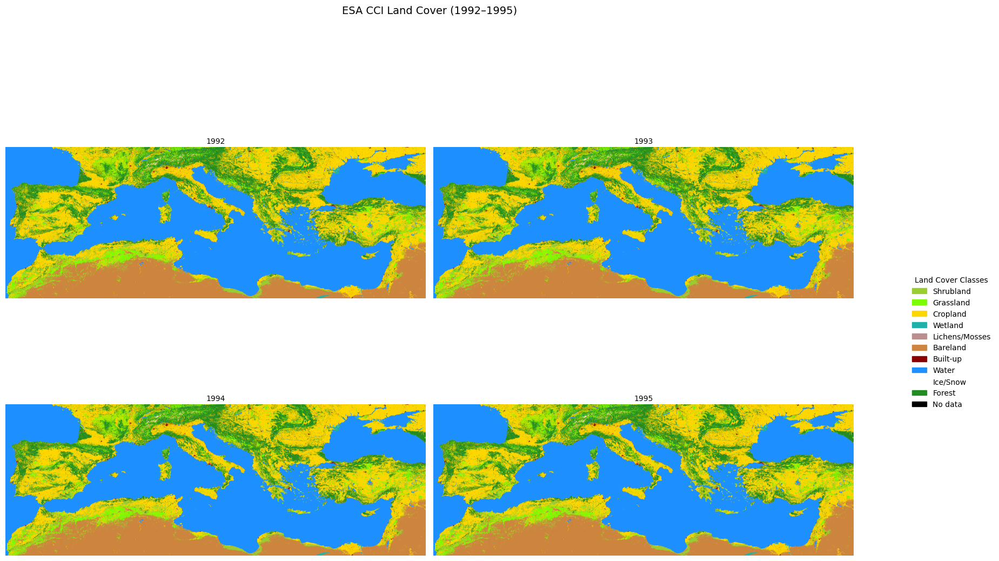

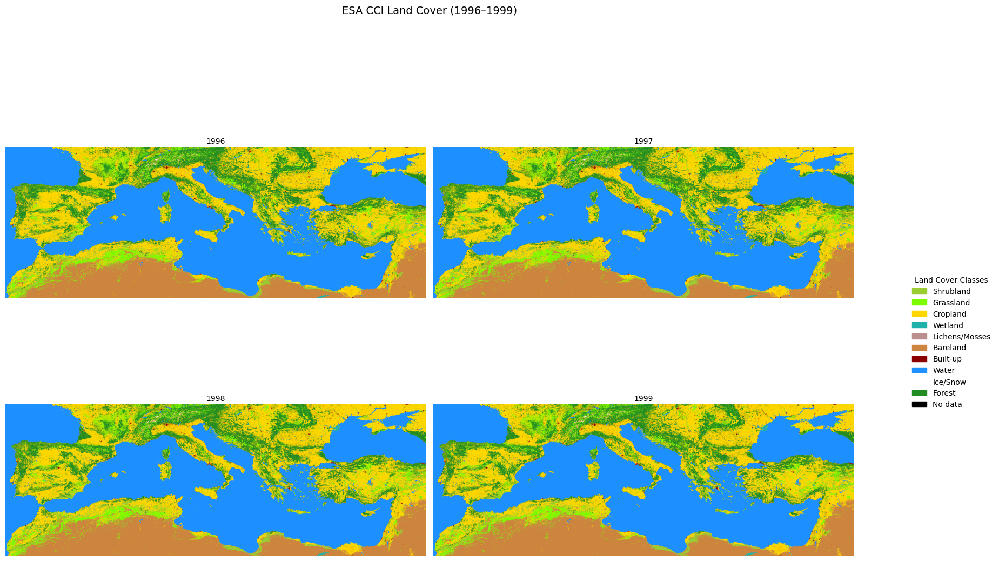

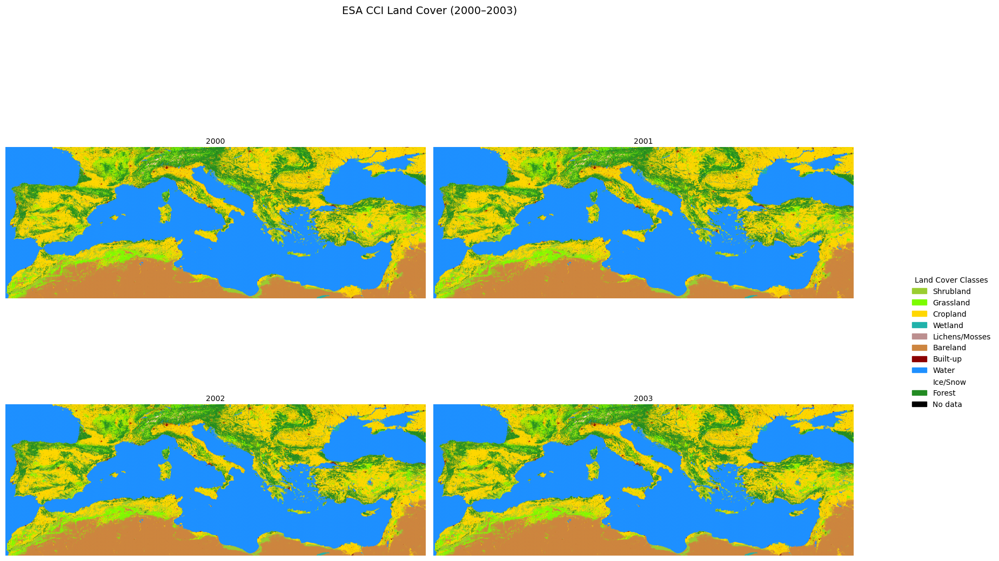

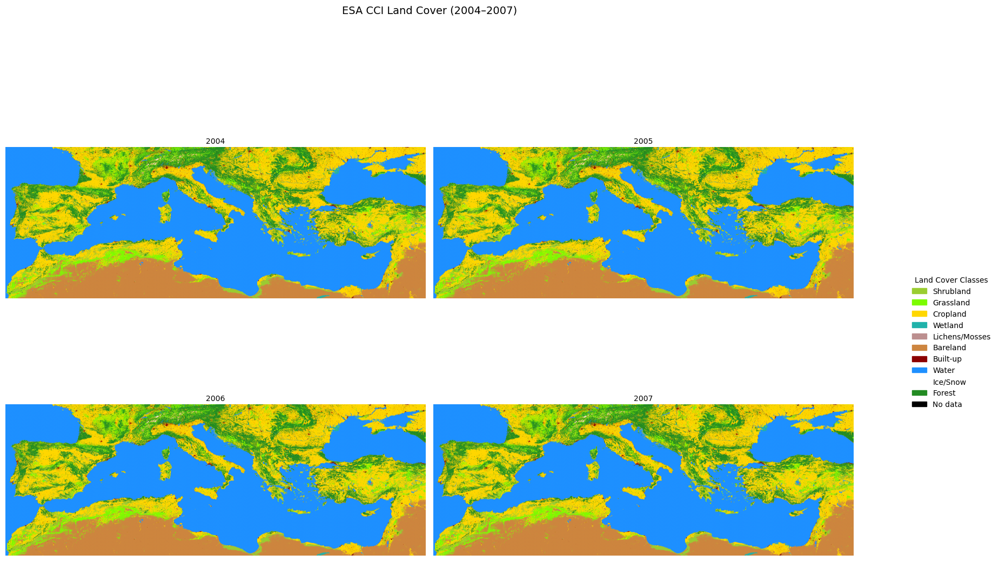

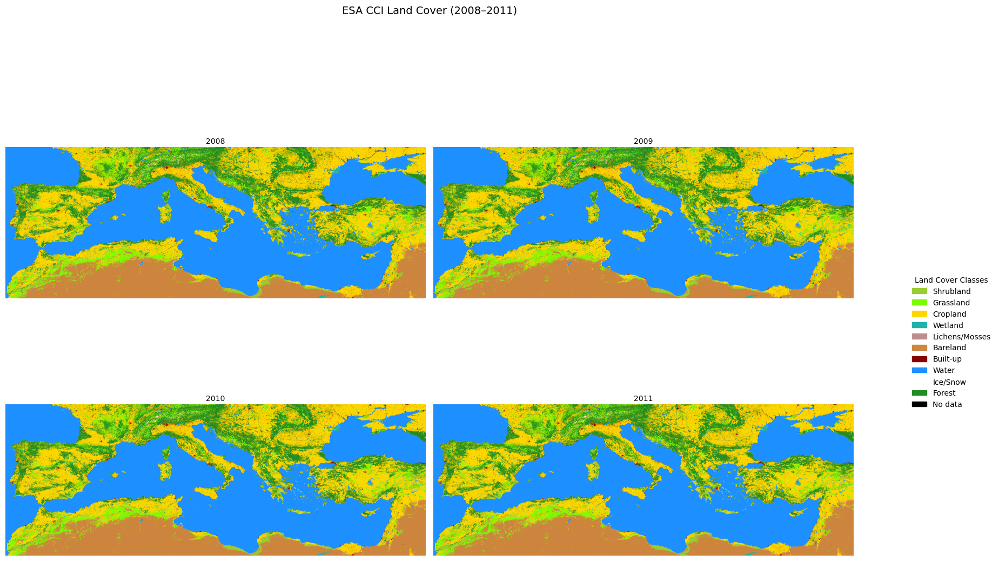

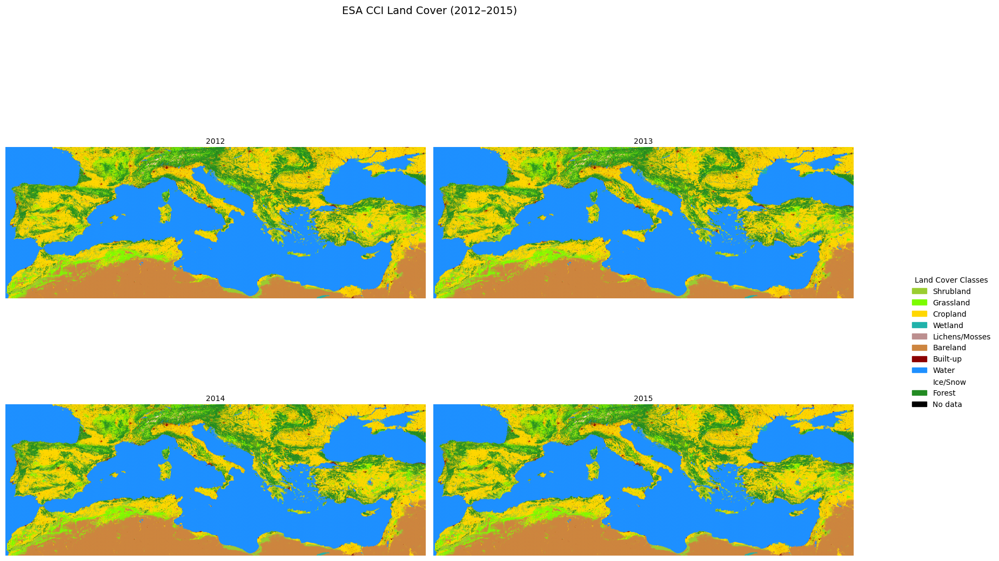

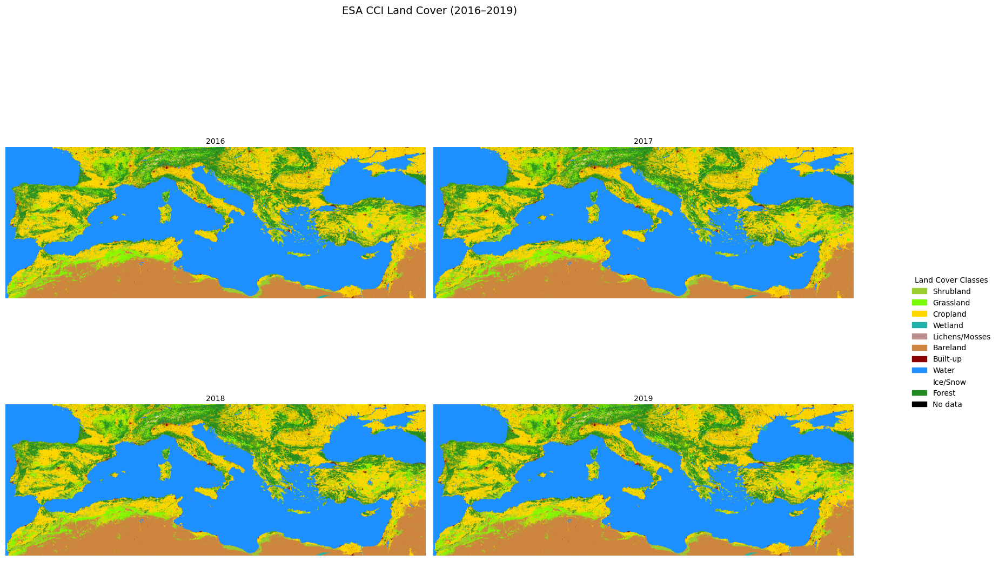

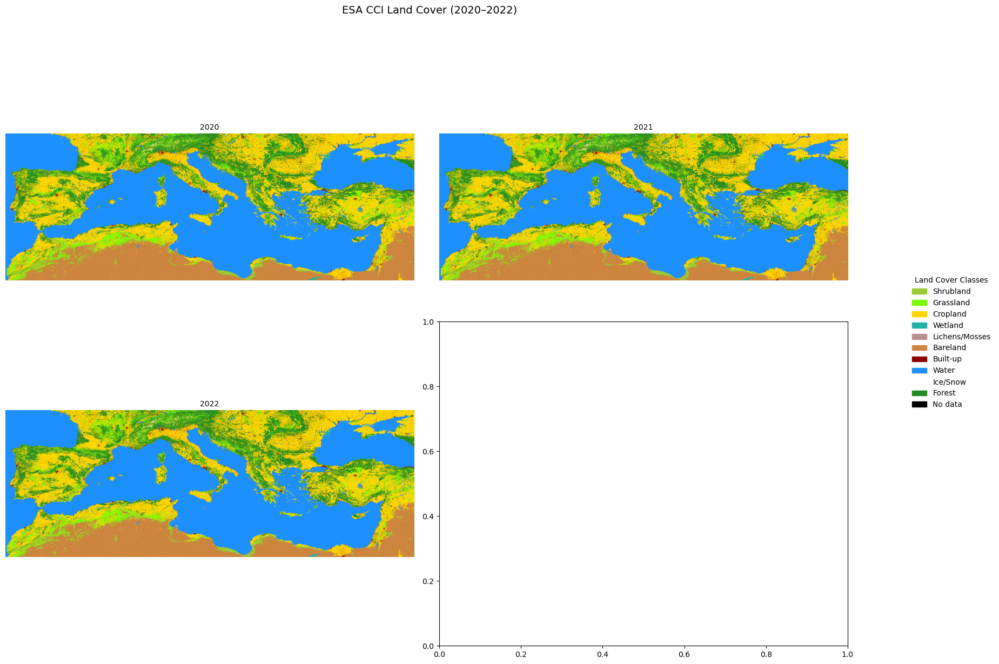

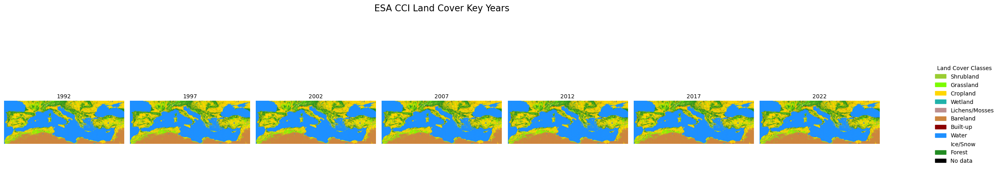

In [18]:
import os
import grass.script as gs
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
import numpy as np
import tempfile
from math import ceil

# Set computational region
gs.run_command('g.region', raster='landcover_2016')

# Full 11-class color scheme (normalized RGB)
lc_colors = {
    5:  (154/255, 205/255, 50/255),    # Shrubland - YellowGreen
    7:  (124/255, 252/255, 0/255),     # Grassland - LawnGreen
    8:  (255/255, 215/255, 0/255),     # Cropland - Gold
    9:  (32/255, 178/255, 170/255),    # Wetland - LightSeaGreen
    11: (188/255, 143/255, 143/255),   # Lichens and Mosses - RosyBrown
    12: (205/255, 133/255, 63/255),    # Bareland - Peru
    13: (139/255, 0/255, 0/255),       # Built-up - DarkRed
    15: (30/255, 144/255, 255/255),    # Water - DodgerBlue
    16: (1.0, 1.0, 1.0),               # Ice/Snow - White
    20: (34/255, 139/255, 34/255),     # Forest - ForestGreen
    255:(0.0, 0.0, 0.0)                # No data - Black
}

# Matching labels
lc_labels = {
    5:  "Shrubland",
    7:  "Grassland", 
    8:  "Cropland",
    9:  "Wetland",
    11: "Lichens/Mosses",
    12: "Bareland",
    13: "Built-up",
    15: "Water",
    16: "Ice/Snow",
    20: "Forest",
    255:"No data"
}

# Define the full class set to be shown always
all_classes = sorted(lc_colors.keys())
full_cmap = ListedColormap([lc_colors[c] for c in all_classes])
norm = BoundaryNorm(all_classes + [max(all_classes) + 1], len(all_classes))

# Function to plot GRASS raster with full class colormap
def plot_grass_raster(raster_name, ax, title):
    with tempfile.NamedTemporaryFile(suffix='.txt', delete=False) as temp_file:
        temp_path = temp_file.name
    gs.run_command('r.out.ascii', input=raster_name, output=temp_path, overwrite=True)

    with open(temp_path) as f:
        for _ in range(6): next(f)
        data = np.array([list(map(float, line.split())) for line in f])
    os.remove(temp_path)

    im = ax.imshow(data, cmap=full_cmap, norm=norm)
    ax.set_title(title, fontsize=10, pad=5)
    ax.set_axis_off()

    return im

# Years to plot
years = list(range(1992, 2023))
n_years = len(years)

# === Multi-page layout (4 per page) ===
years_per_page = 4
n_pages = ceil(n_years / years_per_page)

for page in range(n_pages):
    start = page * years_per_page
    end = min((page + 1) * years_per_page, n_years)
    page_years = years[start:end]

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f'ESA CCI Land Cover ({page_years[0]}–{page_years[-1]})', fontsize=14, y=1.02)

    for i, year in enumerate(page_years):
        ax = axes[i // 2, i % 2]
        plot_grass_raster(f'landcover_{year}', ax, str(year))

    # Static legend using full class list
    legend_patches = [Patch(color=lc_colors[c], label=lc_labels[c]) for c in all_classes if c in lc_labels]
    fig.legend(handles=legend_patches,
               bbox_to_anchor=(1.05, 0.5),
               loc='center left',
               title="Land Cover Classes",
               frameon=False)
    plt.tight_layout()
    plt.show()

# === Summary plot (every 5 years) ===
selected_years = years[::5]
if selected_years[-1] != 2022:
    selected_years.append(2022)

fig, axes = plt.subplots(1, len(selected_years), figsize=(22, 5))
fig.suptitle('ESA CCI Land Cover Key Years', fontsize=16, y=1.05)

for i, year in enumerate(selected_years):
    plot_grass_raster(f'landcover_{year}', axes[i], str(year))

legend_patches = [Patch(color=lc_colors[c], label=lc_labels[c]) for c in all_classes if c in lc_labels]
fig.legend(handles=legend_patches, 
           bbox_to_anchor=(1.05, 0.5), 
           loc='center left',
           title="Land Cover Classes",
           frameon=False)
plt.tight_layout()
plt.show()


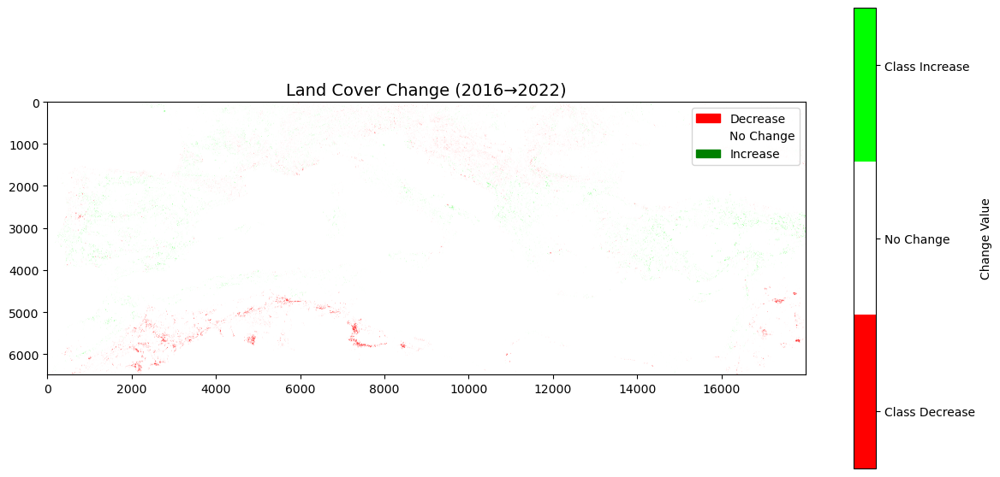

Analysis complete. Image saved as 'landcover_change_2016_2022.png'


In [23]:
import grass.script as gs
import matplotlib.pyplot as plt
import numpy as np
import tempfile
import os
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

# 1. Calculate changes with proper overwrite flag
try:
    # Correct syntax for overwrite flag (two dashes)
    gs.run_command('r.mapcalc', 
                  expression="change_2016_2022 = landcover_2022 - landcover_2016", 
                  overwrite=True)
except Exception as e:
    print(f"Error calculating changes: {e}")
    exit(1)

# 2. Define change visualization parameters
change_cmap = ListedColormap(['#FF0000', '#FFFFFF', '#00FF00'])  # Red, White, Green
change_norm = plt.Normalize(vmin=-20, vmax=20)  # Adjust range based on your class values

# 3. Create the change plot
fig, ax = plt.subplots(figsize=(12, 8))

# Create temporary directory
temp_dir = tempfile.mkdtemp()
temp_file = os.path.join(temp_dir, 'change_data.txt')

try:
    # Export raster with proper overwrite flag
    gs.run_command('r.out.ascii', 
                  input='change_2016_2022', 
                  output=temp_file, 
                  overwrite=True)
    
    # Read and process the data
    with open(temp_file) as f:
        for _ in range(6):  # Skip header
            next(f)
        change_data = np.loadtxt(f, dtype=int)
    
    # Get raster dimensions
    info = gs.parse_command('r.info', map='change_2016_2022', flags='g')
    cols = int(info['cols'])
    rows = int(info['rows'])
    
    # Reshape data with error handling
    try:
        change_data = change_data.reshape((rows, cols))
    except ValueError as e:
        print(f"Reshaping error: {e}")
        if change_data.size > rows*cols:
            change_data = change_data[:rows*cols].reshape((rows, cols))
        else:
            # Pad with zeros if data is too small
            padded = np.zeros(rows*cols)
            padded[:change_data.size] = change_data
            change_data = padded.reshape((rows, cols))

    # Create visualization
    im = ax.imshow(change_data, cmap=change_cmap, norm=change_norm)
    ax.set_title("Land Cover Change (2016→2022)", fontsize=14)
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, label='Change Value', 
                       ticks=[-15, 0, 15], shrink=0.7)
    cbar.ax.set_yticklabels(['Class Decrease', 'No Change', 'Class Increase'])
    
    # Add legend
    legend_patches = [
        Patch(color='red', label='Decrease'),
        Patch(color='white', label='No Change'), 
        Patch(color='green', label='Increase')
    ]
    ax.legend(handles=legend_patches, loc='upper right')
    
    plt.tight_layout()
    plt.savefig('landcover_change_2016_2022.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("Analysis complete. Image saved as 'landcover_change_2016_2022.png'")

except Exception as e:
    print(f"Visualization error: {e}")
finally:
    # Clean up temporary files
    try:
        os.remove(temp_file)
        os.rmdir(temp_dir)
    except:
        pass

In [25]:
import grass.script as gs

def main():
    # Print class statistics for both years
    print("Class statistics:")
    for year in [2016, 2022]:
        stats = gs.parse_command('r.stats', flags='c', input=f'landcover_{year}')
        print(f"\n{year}:")
        print(stats)

    # METHOD 1: Direct transition matrix using r.stats
    print("\nMETHOD 1: Transition Matrix using r.stats")
    trans_matrix = gs.parse_command(
        'r.stats',
        flags='cn',  # c=print counts, n=include NULLs
        input='landcover_2016,landcover_2022'
    )
    print("\nTransition Counts (2016→2022):")
    print("Format: landcover_2016_class,landcover_2022_class,count")
    print(trans_matrix)

    # METHOD 2: Cross-tabulation using r.cross
    print("\nMETHOD 2: Cross-tabulation using r.cross")
    
    # Create cross-tabulation map
    gs.run_command('r.cross',
                  input='landcover_2016,landcover_2022',
                  output='transitions_2016_2022')
    
    # Get transition statistics
    cross_stats = gs.parse_command('r.stats',
                                  flags='c',
                                  input='transitions_2016_2022')
    
    print("\nTransition Counts with Combined Classes:")
    print("Format: combined_class_code,count")
    print(cross_stats)
    
    # Get category labels for interpretation
    cats = gs.parse_command('r.category',
                           map='transitions_2016_2022',
                           separator=':')
    print("\nCategory Labels (2016→2022):")
    print(cats)

    # METHOD 3: Area statistics for transitions (optional)
    print("\nMETHOD 3: Area Statistics for Transitions")
    area_stats = gs.parse_command('r.stats',
                                 flags='ac',
                                 input='transitions_2016_2022')
    print("\nTransition Areas (in map units):")
    print(area_stats)

if __name__ == "__main__":
    main()

Class statistics:

2016:
{'5 2845868': None, '7 5836035': None, '8 27908692': None, '9 201588': None, '11 2643': None, '12 16368539': None, '13 1223919': None, '15 47830793': None, '16 30261': None, '20 14391662': None}

2022:
{'5 3224139': None, '7 5603692': None, '8 27765374': None, '9 203431': None, '11 2643': None, '12 16145842': None, '13 1334993': None, '15 47828844': None, '16 30261': None, '20 14500781': None}

METHOD 1: Transition Matrix using r.stats

Transition Counts (2016→2022):
Format: landcover_2016_class,landcover_2022_class,count
{'5 5 2812306': None, '5 7 370': None, '5 8 2367': None, '5 12 486': None, '5 13 5670': None, '5 20 24669': None, '7 5 194733': None, '7 7 5564043': None, '7 8 15748': None, '7 9 1': None, '7 12 1298': None, '7 13 5967': None, '7 20 54245': None, '8 5 4275': None, '8 7 13043': None, '8 8 27663612': None, '8 9 16': None, '8 12 958': None, '8 13 76543': None, '8 20 150245': None, '9 7 3': None, '9 8 3': None, '9 9 199746': None, '9 13 1078': Non

2016 Class Distribution:
   class     count
0      5   2845868
1      7   5836035
2      8  27908692
3      9    201588
4     11      2643
5     12  16368539
6     13   1223919
7     15  47830793
8     16     30261
9     20  14391662

2022 Class Distribution:
   class     count
0      5   3224139
1      7   5603692
2      8  27765374
3      9    203431
4     11      2643
5     12  16145842
6     13   1334993
7     15  47828844
8     16     30261
9     20  14500781



Transition Matrix (Counts):
to_name      Agriculture      Barren     Forest  Grassland      Ice  \
from_name                                                             
Agriculture   27663612.0         0.0    13043.0    76543.0      0.0   
Barren             473.0  47828844.0      145.0      101.0      0.0   
Forest           15748.0         0.0  5564043.0     5967.0      0.0   
Grassland            0.0         0.0        0.0  1223919.0      0.0   
Ice                  0.0         0.0        0.0        0.0  30261.0   
Other            79137.0         0.0    25500.0     2428.0      0.0   
Shrubland         4034.0         0.0      588.0    19287.0      0.0   
Urban             2367.0         0.0      370.0     5670.0      0.0   
Water                0.0         0.0        0.0        0.0      0.0   
Wetland              3.0         0.0        3.0     1078.0      0.0   

to_name           Other   Shrubland      Urban   Water   Wetland  
from_name                                          

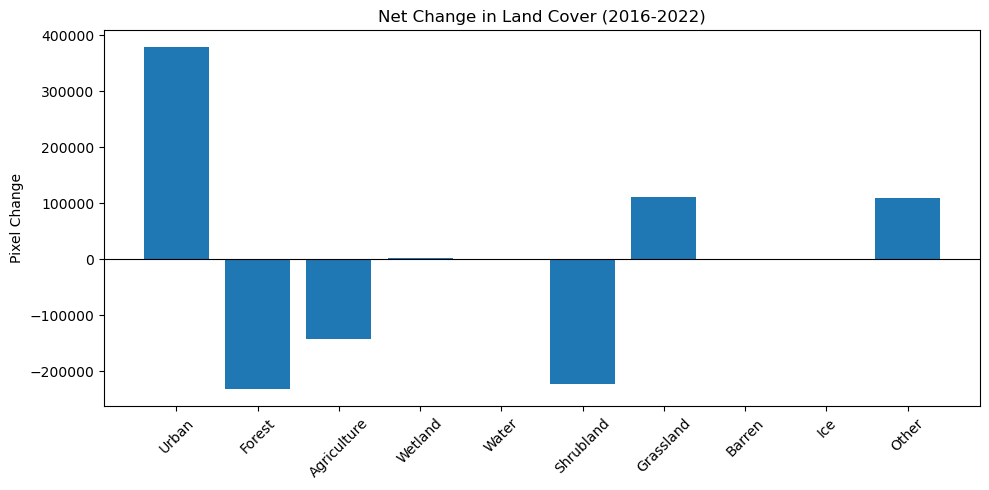

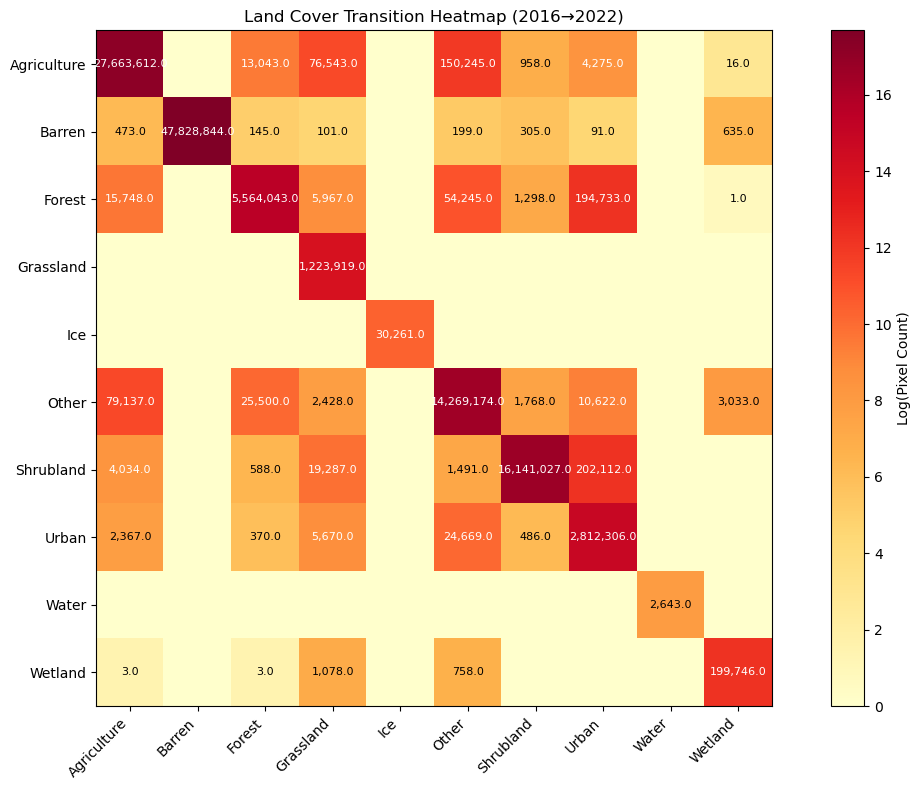


Analysis complete! Results saved to:
- landcover_transitions.csv
- transitions_heatmap.png
- net_change.png


<Figure size 640x480 with 0 Axes>

In [27]:
import grass.script as gs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from io import StringIO

# 1. Get Class Statistics
def get_class_stats(year):
    """Get class statistics for a given year"""
    stats = gs.read_command('r.stats', flags='c', input=f'landcover_{year}')
    df = pd.read_csv(StringIO(stats), sep='\s+', header=None, names=['class', 'count'])
    df['class'] = df['class'].astype(int)
    return df

stats_2016 = get_class_stats(2016)
stats_2022 = get_class_stats(2022)

print("2016 Class Distribution:")
print(stats_2016)
print("\n2022 Class Distribution:")
print(stats_2022)

# 2. Generate Transition Matrix
trans_raw = gs.read_command('r.stats', flags='cn', input='landcover_2016,landcover_2022')
trans_df = pd.read_csv(StringIO(trans_raw), sep='\s+', header=None, 
                      names=['from_class', 'to_class', 'pixels'])
trans_df['from_class'] = trans_df['from_class'].astype(int)
trans_df['to_class'] = trans_df['to_class'].astype(int)

# Class names mapping
class_names = {
    5: 'Urban',
    7: 'Forest',
    8: 'Agriculture',
    9: 'Wetland',
    11: 'Water',
    12: 'Shrubland',
    13: 'Grassland',
    15: 'Barren',
    16: 'Ice',
    20: 'Other'
}

# Add class names to transition DF
trans_df['from_name'] = trans_df['from_class'].map(class_names)
trans_df['to_name'] = trans_df['to_class'].map(class_names)

# Calculate percentages
total_pixels = trans_df['pixels'].sum()
trans_df['percent'] = (trans_df['pixels'] / total_pixels) * 100

# Create pivot tables
pivot_counts = trans_df.pivot_table(index='from_name', columns='to_name', 
                                  values='pixels', fill_value=0)
pivot_percent = trans_df.pivot_table(index='from_name', columns='to_name', 
                                   values='percent', fill_value=0)

print("\nTransition Matrix (Counts):")
print(pivot_counts)

print("\nTransition Matrix (% of total area):")
print(pivot_percent.round(2))

# 3. Net Change Analysis (Fixed)
# Merge stats with class names
stats_2016['class_name'] = stats_2016['class'].map(class_names)
stats_2022['class_name'] = stats_2022['class'].map(class_names)

# Calculate net change
net_change = stats_2022.set_index('class_name')['count'] - stats_2016.set_index('class_name')['count']
net_change = net_change.reset_index()

# Plot net change
plt.figure(figsize=(10, 5))
plt.bar(net_change['class_name'], net_change['count'])
plt.axhline(0, color='black', linewidth=0.8)
plt.title('Net Change in Land Cover (2016-2022)')
plt.ylabel('Pixel Change')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Heatmap Visualization with Proper Labels
plt.figure(figsize=(12, 8))
heatmap = plt.imshow(np.log1p(pivot_counts.values), cmap='YlOrRd')

# Set ticks and labels
plt.xticks(range(len(pivot_counts.columns)), pivot_counts.columns, rotation=45, ha='right')
plt.yticks(range(len(pivot_counts.index)), pivot_counts.index)

# Add value annotations
for i in range(len(pivot_counts.index)):
    for j in range(len(pivot_counts.columns)):
        val = pivot_counts.iloc[i, j]
        if val > 0:  # Only label non-zero transitions
            plt.text(j, i, f"{val:,}", 
                    ha='center', va='center', 
                    color='black' if val < np.median(pivot_counts.values[pivot_counts.values > 0]) else 'white',
                    fontsize=8)

plt.colorbar(heatmap, label='Log(Pixel Count)')
plt.title('Land Cover Transition Heatmap (2016→2022)')
plt.tight_layout()
plt.show()

# 5. Save Results
trans_df.to_csv('landcover_transitions.csv', index=False)
plt.savefig('transitions_heatmap.png', dpi=300)
plt.savefig('net_change.png', dpi=300)

print("\nAnalysis complete! Results saved to:")
print("- landcover_transitions.csv")
print("- transitions_heatmap.png")
print("- net_change.png")

Processing 2016...


Processing 2017...


Processing 2018...


Processing 2019...


Processing 2020...


Processing 2021...


Processing 2022...


Creating animation...
Land cover animation saved as landcover_animation.gif


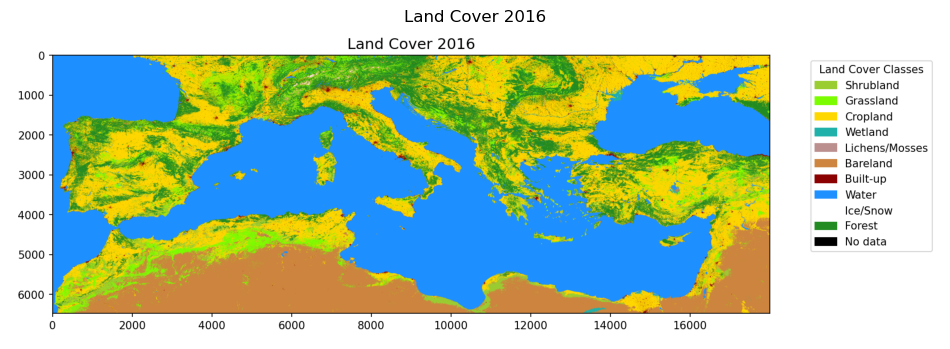

In [28]:
import grass.script as gs
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import os
import numpy as np
from io import StringIO

# 1. Set up your environment
gs.run_command("g.region", raster="landcover_2016")

# 2. Create visualization frames for each year
years = range(2016, 2023)  # Adjust year range as needed
output_dir = "landcover_animation_frames"
os.makedirs(output_dir, exist_ok=True)

# Updated color scheme based on your classification
class_colors = {
    20: '#228B22',  # Forest - ForestGreen
    5:  '#9ACD32',  # Shrubland - YellowGreen
    7:  '#7CFC00',  # Grassland - LawnGreen
    8:  '#FFD700',  # Cropland - Gold
    9:  '#20B2AA',  # Wetland - LightSeaGreen
    11: '#BC8F8F',  # Lichens and Mosses - RosyBrown
    12: '#CD853F',  # Bareland - Peru
    13: '#8B0000',  # Built-up - DarkRed
    15: '#1E90FF',  # Water - DodgerBlue
    16: '#FFFFFF',  # Permanent ice and snow - White
    255:'#000000'   # No data - Black
}

# Class names for legend
class_names = {
    20: "Forest",
    5:  "Shrubland",
    7:  "Grassland", 
    8:  "Cropland",
    9:  "Wetland",
    11: "Lichens/Mosses",
    12: "Bareland",
    13: "Built-up",
    15: "Water",
    16: "Ice/Snow",
    255:"No data"
}

# Get raster dimensions
info = gs.parse_command('r.info', map='landcover_2016', flags='g')
cols = int(info['cols'])
rows = int(info['rows'])

def create_frame(year):
    """Create visualization frame for a specific year"""
    map_name = f"landcover_{year}"
    
    # Export raster to numpy array
    temp_file = f"temp_{year}.txt"
    gs.run_command('r.out.ascii', input=map_name, output=temp_file)
    
    # Read the ASCII file, skipping header
    with open(temp_file, 'r') as f:
        data = np.loadtxt(f, skiprows=6)
    
    # Create RGB array
    rgb = np.zeros((rows, cols, 3))
    for cls, color in class_colors.items():
        mask = (data == cls)
        rgb[mask] = tuple(int(color[i:i+2], 16)/255 for i in (1, 3, 5))
    
    # Plot
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(rgb)
    ax.set_title(f"Land Cover {year}", fontsize=14)
    
    # Create legend with class names
    patches = [plt.Rectangle((0,0),1,1, color=class_colors[cls]) 
               for cls in sorted(class_colors.keys())]
    legend_labels = [class_names[cls] for cls in sorted(class_colors.keys())]
    
    ax.legend(patches, legend_labels,
              bbox_to_anchor=(1.05, 1), 
              loc='upper left',
              title="Land Cover Classes")
    
    # Save frame
    plt.savefig(f"{output_dir}/landcover_{year}.png", 
               dpi=150, 
               bbox_inches="tight")
    plt.close()
    os.remove(temp_file)  # Clean up

# Generate all frames
for year in years:
    print(f"Processing {year}...")
    create_frame(year)

# 3. Create animation
print("Creating animation...")
fig, ax = plt.subplots(figsize=(12, 8))
images = []

# Load all frames
for year in years:
    img = plt.imread(f"{output_dir}/landcover_{year}.png")
    images.append(img)

# Create animation
def update(frame):
    ax.clear()
    ax.imshow(images[frame])
    ax.set_title(f"Land Cover {years[frame]}")
    ax.axis('off')

animation = FuncAnimation(fig, update, frames=len(years), interval=1000)
animation.save("landcover_animation.gif", writer="pillow", fps=1, dpi=150)

print("Land cover animation saved as landcover_animation.gif")

In [33]:
import tempfile
import numpy as np
import os

raster = "landcover_2016"

with tempfile.NamedTemporaryFile(suffix=".txt", delete=False) as tmpfile:
    tmp_path = tmpfile.name

gs.run_command("r.out.ascii", input=raster, output=tmp_path, overwrite=True)

# Load the ASCII, skipping header
with open(tmp_path) as f:
    for _ in range(6): next(f)  # Skip header
    data = np.array([list(map(float, line.split())) for line in f])

os.remove(tmp_path)

print(f"Raster shape: {data.shape}")
print(f"Unique values: {np.unique(data)}")


Raster shape: (6480, 18000)
Unique values: [ 5.  7.  8.  9. 11. 12. 13. 15. 16. 20.]


📊 NULL cells: 0
📊 Non-NULL cells: 116640000
📊 Total cells: 116640000
📉 Missing %: 0.00%


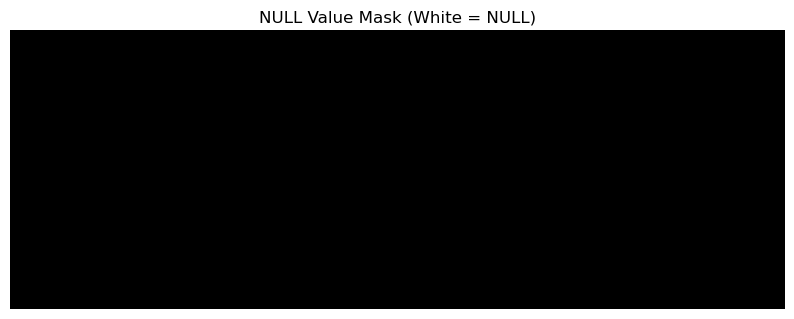

In [34]:
import grass.script as gs
import matplotlib.pyplot as plt
import numpy as np
import tempfile
import os

raster = "landcover_2016"

# 1. Ensure region is set correctly to match the raster
gs.run_command("g.region", raster=raster)

# 2. Export ASCII and load into numpy
with tempfile.NamedTemporaryFile(suffix=".txt", delete=False) as tmpfile:
    tmp_path = tmpfile.name

gs.run_command("r.out.ascii", input=raster, output=tmp_path, overwrite=True)

with open(tmp_path) as f:
    for _ in range(6): next(f)
    data = np.array([list(map(float, line.split())) for line in f])

os.remove(tmp_path)

# 3. Check for NULLs
null_cells = np.isnan(data).sum()
non_null_cells = np.count_nonzero(~np.isnan(data))
total_cells = data.size

print(f"📊 NULL cells: {null_cells}")
print(f"📊 Non-NULL cells: {non_null_cells}")
print(f"📊 Total cells: {total_cells}")
print(f"📉 Missing %: {100 * null_cells / total_cells:.2f}%")

# 4. Plot NULL mask (True for NULL, False otherwise)
null_mask = np.isnan(data)

plt.figure(figsize=(10, 6))
plt.imshow(null_mask, cmap="gray", interpolation="none")
plt.title("NULL Value Mask (White = NULL)")
plt.axis("off")
plt.show()


In [35]:
import grass.script as gs
import numpy as np
import tempfile
import os

# Years to loop through
years = list(range(1992, 2023))
null_stats = {}

for year in years:
    raster = f"landcover_{year}"
    try:
        # Set computational region
        gs.run_command("g.region", raster=raster)

        # Export raster to ASCII
        with tempfile.NamedTemporaryFile(suffix=".txt", delete=False) as tmpfile:
            tmp_path = tmpfile.name

        gs.run_command("r.out.ascii", input=raster, output=tmp_path, overwrite=True)

        # Load ASCII and skip header
        with open(tmp_path) as f:
            for _ in range(6): next(f)  # Skip header
            data = np.array([list(map(float, line.split())) for line in f])

        os.remove(tmp_path)

        # Compute NULL-related stats
        null_cells = np.isnan(data).sum()
        non_null_cells = np.count_nonzero(~np.isnan(data))
        total_cells = data.size
        missing_percent = 100 * null_cells / total_cells if total_cells else 0

        null_stats[raster] = {
            "NULL cells": int(null_cells),
            "Non-NULL cells": int(non_null_cells),
            "Total cells": int(total_cells),
            "Missing %": round(missing_percent, 4)
        }

    except Exception as e:
        null_stats[raster] = {"error": str(e)}

# Display the results
import pandas as pd
pd.DataFrame.from_dict(null_stats, orient='index')


,NULL cells,Non-NULL cells,Total cells,Missing %
landcover_1992,0,116640000,116640000,0.0
landcover_1993,0,116640000,116640000,0.0
landcover_1994,0,116640000,116640000,0.0
landcover_1995,0,116640000,116640000,0.0
landcover_1996,0,116640000,116640000,0.0
landcover_1997,0,116640000,116640000,0.0
landcover_1998,0,116640000,116640000,0.0
landcover_1999,0,116640000,116640000,0.0
landcover_2000,0,116640000,116640000,0.0
landcover_2001,0,116640000,116640000,0.0


In [36]:
forest_classes = [13, 16]  # Adjust based on your land cover classification scheme

forest_stats = {}
for year in range(1992, 2023):
    raster = f"landcover_{year}"
    with tempfile.NamedTemporaryFile(suffix=".txt", delete=False) as tmpfile:
        tmp_path = tmpfile.name

    gs.run_command("r.out.ascii", input=raster, output=tmp_path, overwrite=True)
    with open(tmp_path) as f:
        for _ in range(6): next(f)
        data = np.array([list(map(float, line.split())) for line in f])
    os.remove(tmp_path)

    total = data.size
    forest_mask = np.isin(data, forest_classes)
    forest_area = np.sum(forest_mask)
    percent_forest = 100 * forest_area / total

    forest_stats[year] = {
        "Forest Cells": int(forest_area),
        "Total Cells": int(total),
        "Forest %": round(percent_forest, 2)
    }

import pandas as pd
pd.DataFrame.from_dict(forest_stats, orient='index')


,Forest Cells,Total Cells,Forest %
1992,591445,116640000,0.51
1993,605553,116640000,0.52
1994,621194,116640000,0.53
1995,637918,116640000,0.55
1996,655310,116640000,0.56
1997,673996,116640000,0.58
1998,696101,116640000,0.60
1999,718091,116640000,0.62
2000,740937,116640000,0.64
2001,785156,116640000,0.67


In [37]:
def land_cover_change(raster1, raster2):
    tmp1, tmp2 = tempfile.NamedTemporaryFile(delete=False), tempfile.NamedTemporaryFile(delete=False)
    gs.run_command("r.out.ascii", input=raster1, output=tmp1.name, overwrite=True)
    gs.run_command("r.out.ascii", input=raster2, output=tmp2.name, overwrite=True)

    def load(path):
        with open(path) as f:
            for _ in range(6): next(f)
            return np.array([list(map(float, line.split())) for line in f])
        
    d1, d2 = load(tmp1.name), load(tmp2.name)
    os.remove(tmp1.name)
    os.remove(tmp2.name)

    changes = d1 != d2
    total = d1.size
    changed = np.sum(changes)
    return changed, total, round(100 * changed / total, 2)

# Example: Change between 1992 and 2022
changed_cells, total_cells, percent_changed = land_cover_change("landcover_1992", "landcover_2022")
print(f"Changed cells: {changed_cells} ({percent_changed}%)")


Changed cells: 4433311 (3.8%)


In [38]:
from collections import Counter

class_stats = {}

for year in range(1992, 2023):
    raster = f"landcover_{year}"
    with tempfile.NamedTemporaryFile(suffix=".txt", delete=False) as tmpfile:
        tmp_path = tmpfile.name
    gs.run_command("r.out.ascii", input=raster, output=tmp_path, overwrite=True)
    
    with open(tmp_path) as f:
        for _ in range(6): next(f)
        flat = np.fromiter((float(val) for line in f for val in line.split()), dtype=float)

    os.remove(tmp_path)
    counts = Counter(flat)
    class_stats[year] = dict(counts)

# Convert to DataFrame
pd.DataFrame.from_dict(class_stats, orient='index').fillna(0).astype(int)


,15.0,8.0,7.0,20.0,13.0,9.0,12.0,5.0,16.0,11.0
1992,47877461,28421626,5645129,14184316,561184,200663,16621890,3094813,30261,2657
1993,47877250,28412933,5644751,14183571,575292,200593,16618235,3094457,30261,2657
1994,47877026,28403212,5644301,14182808,590933,200543,16614201,3094059,30261,2656
1995,47871407,28402715,5667020,14151884,607657,199792,16620858,3085750,30261,2656
1996,47866191,28379896,5677134,14164724,625049,199547,16618092,3076450,30261,2656
1997,47865432,28369981,5686166,14155758,643735,199331,16615146,3071534,30261,2656
1998,47863876,28383747,5716756,14103249,665840,199112,16616320,3058186,30261,2653
1999,47852422,28416857,5766917,14044435,687830,199011,16633628,3005991,30261,2648
2000,47851375,28411327,5790110,14021611,710676,198913,16630504,2992577,30261,2646
2001,47849477,28357586,5810972,14037562,754895,199239,16639941,2957421,30261,2646


In [6]:
import grass.script as gs
import pandas as pd

# Define input rasters and output name
raster_2000 = "landcover_2000"
raster_2022 = "landcover_2022"
cross_output = "lc_change_2000_2022"

# Run r.cross to compute land cover changes
gs.run_command("r.cross", input=f"{raster_2000},{raster_2022}", output=cross_output, overwrite=True)

# Get area stats of transition map
stats = gs.read_command("r.stats", flags="an", input=cross_output).strip().splitlines()

# Get the category labels for the cross map
cat_lines = gs.read_command("r.category", map=cross_output).strip().splitlines()

# Parse category map: maps cross-raster value ID ➝ (from_code, to_code)
cat_map = {}
for line in cat_lines:
    try:
        code, label = line.split("\t")
        code = int(code.strip())
        parts = label.replace("category", "").split(";")
        from_code = int(parts[0].strip())
        to_code = int(parts[1].strip())
        cat_map[code] = (from_code, to_code)
    except Exception as e:
        print(f"⚠️ Skipping invalid label line: {line}")

# MOLCA code to label mapping
molca_classes = {
    5: "Shrubland",
    7: "Grassland",
    8: "Cropland",
    9: "Wetland",
    11: "Lichens and Mosses",
    12: "Bareland",
    13: "Built-up",
    15: "Water",
    16: "Permanent ice and snow",
    20: "Forest",
    255: "No data"
}

# Parse area stats and decode transitions
rows = []
for line in stats:
    val, area = line.strip().split()
    val = int(val)
    area = float(area)

    if val not in cat_map:
        continue

    from_code, to_code = cat_map[val]
    from_label = molca_classes.get(from_code, f"Unknown ({from_code})")
    to_label = molca_classes.get(to_code, f"Unknown ({to_code})")

    rows.append({
        "From Code": from_code,
        "To Code": to_code,
        "From Label": from_label,
        "To Label": to_label,
        "Area (map units)": area
    })

# Create DataFrame and show
df = pd.DataFrame(rows)
df = df.sort_values(by="Area (map units)", ascending=False).reset_index(drop=True)

print("🌍 Land Cover Transitions from 2000 ➝ 2022:")
print(df)


r.cross: STEP 1 ...

r.cross: STEP 2 ...
r.cross: STEP 3 ...

Creating support files for <lc_change_2000_2022>...
54 categories



🌍 Land Cover Transitions from 2000 ➝ 2022:
    From Code  To Code              From Label                To Label  \
0          15       15                   Water                   Water   
1           8        8                Cropland                Cropland   
2          12       12                Bareland                Bareland   
3          20       20                  Forest                  Forest   
4           7        7               Grassland               Grassland   
5           5        5               Shrubland               Shrubland   
6           8       20                Cropland                  Forest   
7          13       13                Built-up                Built-up   
8           8       13                Cropland                Built-up   
9          12        5                Bareland               Shrubland   
10         20        8                  Forest                Cropland   
11          5        8               Shrubland                Croplan

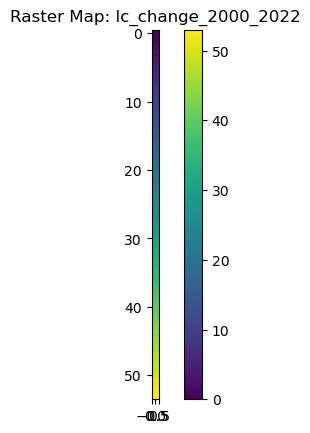

In [10]:
import os
import grass.script as gs
import numpy as np
import matplotlib.pyplot as plt

# Set the environment variable for immediate rendering
os.environ['GRASS_RENDER_IMMEDIATE'] = 'TRUE'

# Set the location and mapset (if needed)
gs.run_command('g.region', raster='lc_change_2000_2022')

# Read the raster data using the GRASS GIS Python interface
raster_data = gs.read_command('r.stats', input='lc_change_2000_2022', flags='n')

# Convert the raster data into a numpy array (assuming the data is in ASCII format)
raster_array = np.array([list(map(float, line.split())) for line in raster_data.splitlines()])

# Plot the raster map using matplotlib
plt.imshow(raster_array, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title('Raster Map: lc_change_2000_2022')
plt.show()


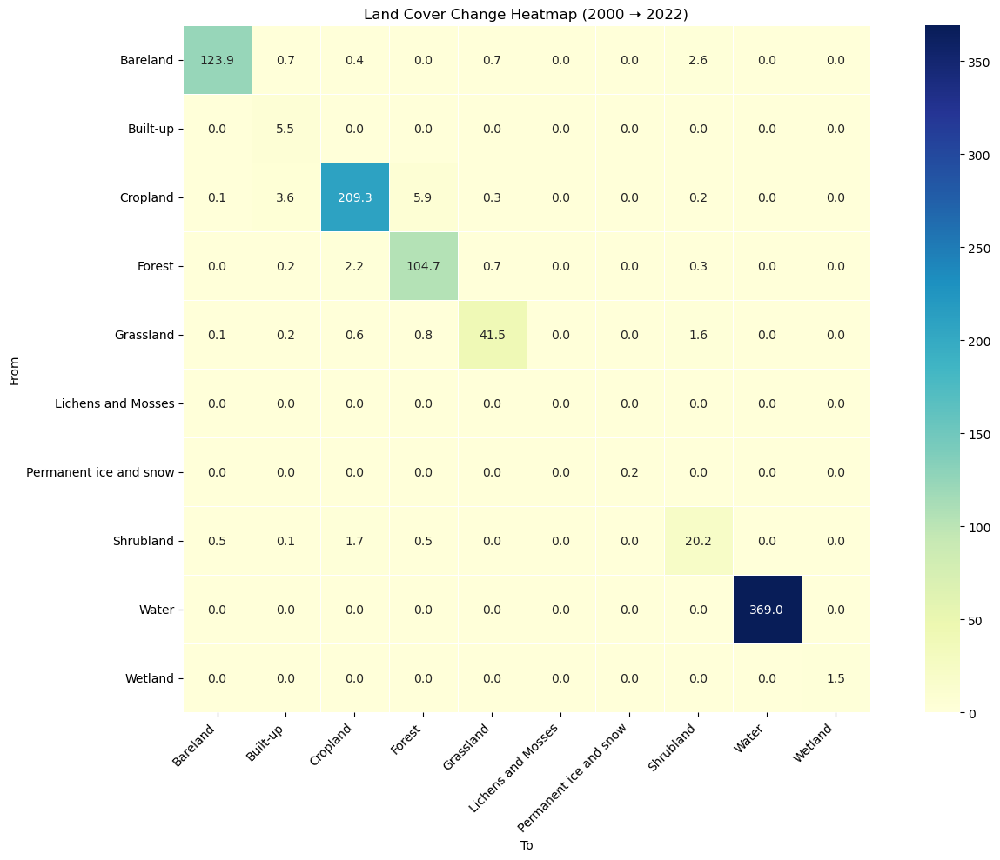

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Pivot to matrix format
pivot_df = df.pivot_table(
    values="Area (map units)",
    index="From Label",
    columns="To Label",
    aggfunc="sum",
    fill_value=0
)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_df, cmap="YlGnBu", annot=True, fmt=".1f", linewidths=0.5, square=True)
plt.title("Land Cover Change Heatmap (2000 ➝ 2022)")
plt.xlabel("To")
plt.ylabel("From")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


/var/folders/mz/wk_rk1fs2m96vphdr62m5bym0000gn/T/grass8-ghulamabbaszafari-16109/ipykernel_16159/376521313.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




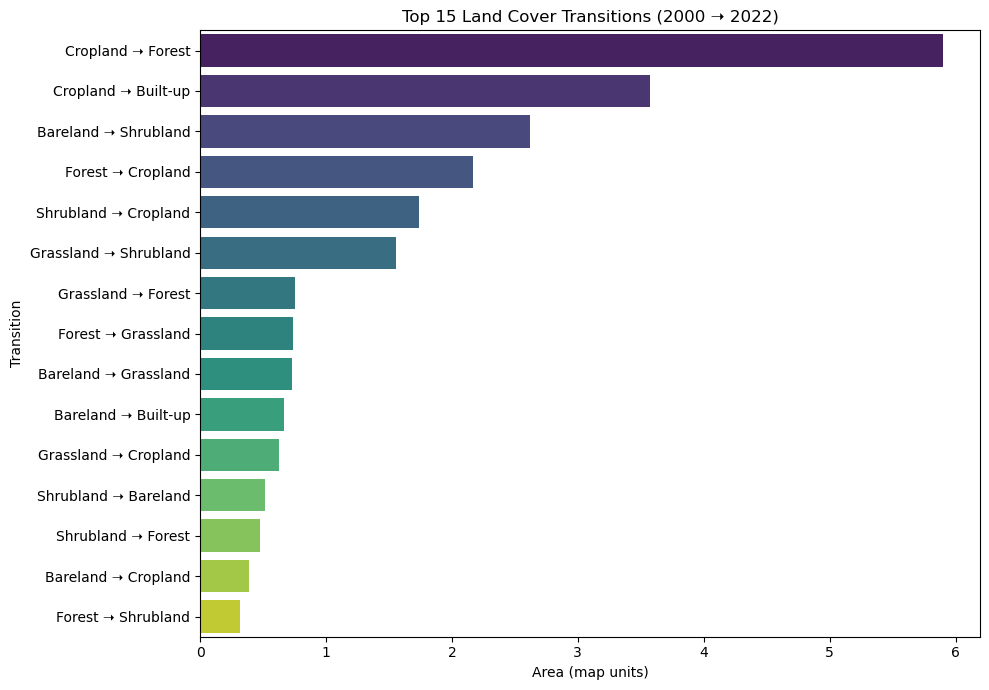

In [13]:
# Exclude no-change transitions if you want to focus on changes
df_changes = df[df["From Code"] != df["To Code"]].copy()

# Create a label like "Forest → Cropland"
df_changes["Transition"] = df_changes["From Label"] + " ➝ " + df_changes["To Label"]

# Sort by area
df_changes = df_changes.sort_values("Area (map units)", ascending=False)

# Plot top N transitions
top_n = 15
plt.figure(figsize=(10, 7))
sns.barplot(data=df_changes.head(top_n), y="Transition", x="Area (map units)", palette="viridis")
plt.title(f"Top {top_n} Land Cover Transitions (2000 ➝ 2022)")
plt.xlabel("Area (map units)")
plt.ylabel("Transition")
plt.tight_layout()
plt.show()


In [14]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you already have the DataFrame df with columns like "From Code", "To Code", "From Label", "To Label", "Area (map units)"
# You would have your own DataFrame, so I will assume df is pre-defined

# Filter out self-transitions if you want only changes
df_sankey = df[df["From Code"] != df["To Code"]]

# Extract the unique labels (from and to)
labels = list(set(df_sankey["From Label"]) | set(df_sankey["To Label"]))
label_to_index = {label: i for i, label in enumerate(labels)}

# Create source, target, and values from the dataframe
sources = df_sankey["From Label"].map(label_to_index)
targets = df_sankey["To Label"].map(label_to_index)
values = df_sankey["Area (map units)"]

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15, 
        thickness=20, 
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=sources, 
        target=targets, 
        value=values
    )
)])

# Update layout with a title and custom formatting
fig.update_layout(
    title_text="🌍 Land Cover Transitions 2000 ➝ 2022", 
    font_size=12,
    annotations=[
        dict(
            x=0.5, 
            y=1.05, 
            xref="paper", 
            yref="paper", 
            text="The diagram shows land cover transitions from the year 2000 to 2022, indicating how different land cover types changed over time.", 
            showarrow=False,
            font=dict(size=14, color="black", family="Arial")
        ),
        dict(
            x=0.5, 
            y=-0.1, 
            xref="paper", 
            yref="paper", 
            text="From Label: Original land cover class<br>To Label: New land cover class<br>Area (map units): Area of transition", 
            showarrow=False,
            font=dict(size=12, color="black", family="Arial")
        )
    ]
)

fig.show()


In [15]:
import grass.script as gscript

# List all raster maps in the current location/mapset
raster_maps = gscript.read_command('g.list', type='raster')

# Print the available raster maps
print(raster_maps)


change_2016_2022
landcover_1992
landcover_1993
landcover_1994
landcover_1995
landcover_1996
landcover_1997
landcover_1998
landcover_1999
landcover_2000
landcover_2001
landcover_2002
landcover_2003
landcover_2004
landcover_2005
landcover_2006
landcover_2007
landcover_2008
landcover_2009
landcover_2010
landcover_2011
landcover_2012
landcover_2013
landcover_2014
landcover_2015
landcover_2016
landcover_2017
landcover_2018
landcover_2019
landcover_2020
landcover_2021
landcover_2022
lc_change_2000_2022
lc_map
merged_output_imported
transitions_2016_2022



In [1]:
import grass.script as gs
import os
from datetime import datetime

def log_message(message):
    """Helper function for logging with timestamp"""
    print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {message}")

def safe_remove_raster(name):
    """Safely remove raster if it exists"""
    try:
        if name in gs.list_strings(type='raster'):
            gs.run_command('g.remove', type='raster', name=name, flags='f', quiet=True)
            return True
    except:
        pass
    return False

# 1. Verify GRASS environment
log_message("Checking GRASS GIS environment...")
location_info = gs.read_command('g.gisenv', flags='n').strip()
mapset_info = gs.read_command('g.mapset', flags='p').strip()
log_message(f"Current location: {location_info}")
log_message(f"Current mapset: {mapset_info}")

# 2. Define all input files with target names
input_files = {
    'GLC_FCS30_1985': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_1985_mosaic_reclass.tif',
    'GLC_FCS30_1990': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_1990_mosaic_reclass.tif',
    'GLC_FCS30_1995': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_1995_mosaic_reclass.tif',
    'GLC_FCS30_2000': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2000_mosaic_reclass.tif',
    'GLC_FCS30_2001': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2001_mosaic_reclass.tif',
    'GLC_FCS30_2002': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2002_mosaic_reclass.tif',
    'GLC_FCS30_2003': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2003_mosaic_reclass.tif',
    'GLC_FCS30_2004': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2004_mosaic_reclass.tif',
    'GLC_FCS30_2005': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2005_mosaic_reclass.tif',
    'GLC_FCS30_2006': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2006_mosaic_reclass.tif',
    'GLC_FCS30_2007': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2007_mosaic_reclass.tif',
    'GLC_FCS30_2008': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2008_mosaic_reclass.tif',
    'GLC_FCS30_2009': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2009_mosaic_reclass.tif',
    'GLC_FCS30_2010': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2010_mosaic_reclass.tif'
}

# 3. Target projection parameters
target_epsg = "EPSG:3035"  # ETRS89-extended / LAEA Europe
target_resolution = 23.51040463  # meters (correct for EPSG:3035)

# 4. Processing workflow
def process_rasters():
    """Main processing workflow"""
    # First clean any existing rasters (only if they exist)
    log_message("Cleaning existing rasters if present...")
    for raster in input_files.keys():
        if safe_remove_raster(raster):
            log_message(f"Removed existing {raster}")
    
    # Process each file
    for output_name, input_path in input_files.items():
        log_message(f"\nProcessing {output_name}...")
        
        # Verify input file exists
        if not os.path.exists(input_path):
            log_message(f"Error: Input file not found - {input_path}")
            continue
        
        # Create temporary output path
        temp_output = f"/tmp/{output_name}_3035.tif"
        
        # Step 1: Reproject with GDAL
        log_message(f"Reprojecting to {target_epsg} with gdalwarp...")
        cmd = f"gdalwarp -t_srs {target_epsg} -tr {target_resolution} {target_resolution} -r near -overwrite -co COMPRESS=LZW {input_path} {temp_output}"
        ret = os.system(cmd)
        if ret != 0:
            log_message(f"Error in gdalwarp for {output_name}")
            continue
        
        # Step 2: Import to GRASS
        log_message(f"Importing {output_name} to GRASS...")
        try:
            gs.run_command('r.import',
                          input=temp_output,
                          output=output_name,
                          resolution='value',
                          resolution_value=target_resolution,
                          flags='o',
                          quiet=True)
        except Exception as e:
            log_message(f"Error importing {output_name}: {str(e)}")
            continue
        
        # Clean up temporary file
        if os.path.exists(temp_output):
            os.remove(temp_output)
        
        # Verify the imported raster
        try:
            info = gs.parse_command('r.info', map=output_name, flags='g')
            if info:
                log_message(f"Successfully imported {output_name}")
                log_message(f"Resolution: {info.get('nsres', 'N/A')}m x {info.get('ewres', 'N/A')}m")
                log_message(f"Extent: n={info.get('north', 'N/A')} s={info.get('south', 'N/A')} e={info.get('east', 'N/A')} w={info.get('west', 'N/A')}")
            else:
                log_message(f"Warning: Could not verify {output_name}")
        except:
            log_message(f"Warning: Could not verify {output_name}")
    
    # Final region setting
    log_message("\nSetting computational region...")
    existing_rasters = [r for r in input_files.keys() if r in gs.list_strings(type='raster')]
    if existing_rasters:
        gs.run_command('g.region', raster=','.join(existing_rasters), quiet=True)
    
    # Final verification
    log_message("\nFinal verification:")
    try:
        region = gs.parse_command('g.region', flags='ug')
        if region:
            log_message(f"Region resolution: {region.get('nsres', 'N/A')} x {region.get('ewres', 'N/A')}")
            log_message(f"Region extent: N={region.get('north', 'N/A')} S={region.get('south', 'N/A')} E={region.get('east', 'N/A')} W={region.get('west', 'N/A')}")
        else:
            log_message("Could not get region information")
    except:
        log_message("Could not get region information")

# Run the processing
process_rasters()

log_message("\nProcessing complete. All rasters should now be properly:")
log_message(f"- Projected in {target_epsg}")
log_message(f"- At consistent {target_resolution}m resolution")
log_message("- Ready for analysis")




[2025-04-15 11:54:33] Checking GRASS GIS environment...
[2025-04-15 11:54:33] Current location: GISDBASE=/Users/ghulamabbaszafari/grassdata
LOCATION_NAME=my_location
MAPSET=PERMANENT
GUI=wxpython
PID=1180
GUI_PID=1183
[2025-04-15 11:54:33] Current mapset: PERMANENT
[2025-04-15 11:54:33] Cleaning existing rasters if present...
[2025-04-15 11:54:34] 
Processing GLC_FCS30_1985...
[2025-04-15 11:54:34] Reprojecting to EPSG:3035 with gdalwarp...
Creating output file that is 204598P x 103552L.
Processing /Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_1985_mosaic_reclass.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-15 12:09:26] Importing GLC_FCS30_1985 to GRASS...
[2025-04-15 12:15:50] Successfully imported GLC_FCS30_1985
[2025-04-15 12:15:50] Resolution: 23.51040463m x 23.51040463m
[2025-04-15 12:15:50] Extent: n=3215741.69097582 s=781192.27073006 e=7189524.985425

In [3]:
stats = gs.read_command('r.stats', input='GLC_FCS30_1985', flags='c')
print(stats)


0 5593349532
5 863650468
7 962238641
8 3118469725
9 45723614
11 1
12 2010958239
13 108933890
15 6398646026
16 7539050
20 2077022910



In [4]:
import grass.script as gs
import pandas as pd
import matplotlib.pyplot as plt
import os
from datetime import datetime
from tqdm import tqdm

# Updated to your classification scheme
LANDCOVER_GROUPS = {
    'Forest': [20],
    'Shrubland': [5],
    'Grassland': [7],
    'Cropland': [8],
    'Wetland': [9],
    'Lichens and Mosses': [11],
    'Bareland': [12],
    'Built-up': [13],
    'Water': [15],
    'Permanent ice and snow': [16],
    'No data': [0, 255]
}

# Create reverse lookup from value to label
VALUE_TO_LABEL = {}
for label, codes in LANDCOVER_GROUPS.items():
    for code in codes:
        VALUE_TO_LABEL[code] = label

# Output directory
OUTPUT_DIR = 'analysis_results'
os.makedirs(OUTPUT_DIR, exist_ok=True)

def log_message(message):
    print(f"[{datetime.now().strftime('%H:%M:%S')}] {message}")

def get_region_info():
    region = gs.parse_command('g.region', flags='ug')
    cell_area = (float(region['nsres']) / 1000) * (float(region['ewres']) / 1000)
    total_cells = int(region['rows']) * int(region['cols'])
    return cell_area, total_cells

def safe_parse_stats(command, *args, **kwargs):
    try:
        result = gs.read_command(command, *args, **kwargs)
        if result:
            return result.strip().split('\n')
        return []
    except Exception as e:
        log_message(f"Error in safe_parse_stats: {str(e)}")
        return []

def process_single_year(year_raster, cell_area):
    results = {'forest': None, 'landcover': []}
    year = year_raster.split('@')[0].split('_')[-1]

    try:
        stats_lines = safe_parse_stats('r.stats', input=year_raster, flags='cn', separator=',')
        class_areas = {}

        for line in stats_lines:
            if ',' in line:
                val_str, cnt_str = line.split(',')
                try:
                    val = int(val_str)
                    cnt = int(cnt_str)
                    label = VALUE_TO_LABEL.get(val, None)
                    if label:
                        class_areas.setdefault(label, 0)
                        class_areas[label] += cnt * cell_area
                except ValueError:
                    continue

        for label, area_km2 in class_areas.items():
            results['landcover'].append({
                'class': label,
                'area_km2': area_km2
            })

        # Forest cover summary
        forest_area = class_areas.get('Forest', 0)
        total_area = sum(class_areas.values())
        if forest_area > 0 and total_area > 0:
            results['forest'] = {
                'area_km2': forest_area,
                'percentage': (forest_area / total_area) * 100
            }
        else:
            log_message(f"No forest class found in {year_raster}")

    except Exception as e:
        log_message(f"Error processing {year_raster}: {str(e)}")
        return None

    return results

def analyze_all_years():
    cell_area, total_cells = get_region_info()
    all_years = sorted([name for name in gs.list_strings(type='raster') if name.startswith('GLC_FCS30_')])

    log_message(f"Analyzing rasters: {len(all_years)} found.")
    all_results = {}

    for year_raster in tqdm(all_years, desc="Analyzing rasters"):
        year = year_raster.split('@')[0].split('_')[-1]
        log_message(f"Processing {year}...")

        results = process_single_year(year_raster, cell_area)
        if results:
            all_results[year] = results

            df = pd.DataFrame(results['landcover'])
            if not df.empty:
                df['Year'] = year
                df.to_csv(f"{OUTPUT_DIR}/landcover_{year}.csv", index=False)

    # Forest cover summary
    forest_data = []
    for year, data in all_results.items():
        if data['forest']:
            forest_data.append({
                'Year': year,
                'Area_km2': data['forest']['area_km2'],
                'Percentage': data['forest']['percentage']
            })

    forest_df = pd.DataFrame(forest_data)
    if not forest_df.empty:
        forest_df.to_csv(f"{OUTPUT_DIR}/forest_cover.csv", index=False)

    # Combine all landcover data
    landcover_all = []
    for year, data in all_results.items():
        for item in data['landcover']:
            item['Year'] = year
            landcover_all.append(item)

    landcover_df = pd.DataFrame(landcover_all)
    if not landcover_df.empty:
        landcover_df.to_csv(f"{OUTPUT_DIR}/landcover_complete.csv", index=False)

    return forest_df, landcover_df

# Main
if __name__ == "__main__":
    log_message("Starting analysis with enhanced error handling...")
    forest_df, landcover_df = analyze_all_years()

    if not forest_df.empty:
        log_message("Forest cover results:")
        print(forest_df.to_string(index=False))

    if not landcover_df.empty:
        log_message("\nSample land cover data:")
        print(landcover_df.head().to_string(index=False))

    log_message(f"\nAnalysis complete! Results saved in '{OUTPUT_DIR}' directory.")


[11:13:27] Starting analysis with enhanced error handling...
[11:13:28] Analyzing rasters: 14 found.


Analyzing rasters:   0%|                                                                                                                                                             | 0/14 [00:00<?, ?it/s]

[11:13:28] Processing 1985...



Analyzing rasters:   7%|██████████▍                                                                                                                                       | 1/14 [05:18<1:09:00, 318.48s/it]

[11:18:46] Processing 1990...



Analyzing rasters:  14%|████████████████████▊                                                                                                                             | 2/14 [10:37<1:03:45, 318.81s/it]

[11:24:05] Processing 1995...



Analyzing rasters:  21%|███████████████████████████████▋                                                                                                                    | 3/14 [15:56<58:25, 318.68s/it]

[11:29:24] Processing 2000...



Analyzing rasters:  29%|██████████████████████████████████████████▎                                                                                                         | 4/14 [21:09<52:47, 316.73s/it]

[11:34:37] Processing 2001...



Analyzing rasters:  36%|████████████████████████████████████████████████████▊                                                                                               | 5/14 [26:23<47:20, 315.56s/it]

[11:39:51] Processing 2002...



Analyzing rasters:  43%|███████████████████████████████████████████████████████████████▍                                                                                    | 6/14 [31:29<41:38, 312.37s/it]

[11:44:57] Processing 2003...



Analyzing rasters:  50%|██████████████████████████████████████████████████████████████████████████                                                                          | 7/14 [36:17<35:31, 304.49s/it]

[11:49:45] Processing 2004...



Analyzing rasters:  57%|████████████████████████████████████████████████████████████████████████████████████▌                                                               | 8/14 [41:06<29:57, 299.58s/it]

[11:54:34] Processing 2005...



Analyzing rasters:  64%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 9/14 [45:56<24:43, 296.64s/it]

[11:59:25] Processing 2006...



Analyzing rasters:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 10/14 [50:44<19:35, 293.87s/it]

[12:04:12] Processing 2007...



Analyzing rasters:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 11/14 [55:33<14:36, 292.26s/it]

[12:09:01] Processing 2008...



Analyzing rasters:  86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 12/14 [1:00:21<09:42, 291.05s/it]

[12:13:49] Processing 2009...



Analyzing rasters:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 13/14 [1:05:09<04:50, 290.13s/it]

[12:18:37] Processing 2010...



Analyzing rasters: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [1:10:01<00:00, 300.10s/it]

[12:23:29] Forest cover results:
Year     Area_km2  Percentage
1985 1.148052e+06    9.803506
1990 1.148522e+06    9.807520
1995 1.143683e+06    9.766197
2000 1.130722e+06    9.655518
2001 1.128316e+06    9.634976
2002 1.126723e+06    9.621371
2003 1.125307e+06    9.609279
2004 1.123049e+06    9.589997
2005 1.120794e+06    9.570748
2006 1.119160e+06    9.556793
2007 1.117665e+06    9.544021
2008 1.115403e+06    9.524710
2009 1.115475e+06    9.525323
2010 1.115358e+06    9.524322
[12:23:29] 
Sample land cover data:
    class     area_km2 Year
  No data 3.091663e+06 1985
Shrubland 4.773734e+05 1985
Grassland 5.318669e+05 1985
 Cropland 1.723700e+06 1985
  Wetland 2.527323e+04 1985
[12:23:29] 
Analysis complete! Results saved in 'analysis_results' directory.


In [6]:
import grass.script as gs
import pandas as pd
import matplotlib.pyplot as plt
import os
from datetime import datetime
from tqdm import tqdm

# Updated land cover groups and their class codes
LANDCOVER_GROUPS = {
    'Forest': [20],
    'Shrubland': [5],
    'Grassland': [7],
    'Cropland': [8],
    'Wetland': [9],
    'Lichens and Mosses': [11],
    'Bareland': [12],
    'Built-up': [13],
    'Water': [15],
    'Permanent ice and snow': [16],
    'No data': [0, 255]
}

# Reverse lookup: code → label
VALUE_TO_LABEL = {}
for label, codes in LANDCOVER_GROUPS.items():
    for code in codes:
        VALUE_TO_LABEL[code] = label

# Output folder
OUTPUT_DIR = 'analysis_results'
os.makedirs(OUTPUT_DIR, exist_ok=True)

def log_message(message):
    print(f"[{datetime.now().strftime('%H:%M:%S')}] {message}")

def get_region_info():
    region = gs.parse_command('g.region', flags='ug')
    cell_area = (float(region['nsres']) / 1000) * (float(region['ewres']) / 1000)
    total_cells = int(region['rows']) * int(region['cols'])
    return cell_area, total_cells

def safe_parse_stats(command, *args, **kwargs):
    try:
        result = gs.read_command(command, *args, **kwargs)
        if result:
            return result.strip().split('\n')
        return []
    except Exception as e:
        log_message(f"Error in safe_parse_stats: {str(e)}")
        return []

def process_single_year(year_raster, cell_area):
    results = {'forest': None, 'landcover': []}
    year = year_raster.split('@')[0].split('_')[-1]

    try:
        stats_lines = safe_parse_stats('r.stats', input=year_raster, flags='cn', separator=',')
        raw_class_counts = {}

        for line in stats_lines:
            if ',' in line:
                val_str, cnt_str = line.split(',')
                try:
                    val = int(val_str)
                    cnt = int(cnt_str)
                    label = VALUE_TO_LABEL.get(val)
                    if label:
                        raw_class_counts.setdefault(label, 0)
                        raw_class_counts[label] += cnt
                except ValueError:
                    continue

        # Ensure all classes exist, even with 0 values
        class_areas = {}
        for label in LANDCOVER_GROUPS.keys():
            pixel_count = raw_class_counts.get(label, 0)
            class_areas[label] = pixel_count * cell_area

        for label, area_km2 in class_areas.items():
            results['landcover'].append({
                'class': label,
                'area_km2': area_km2
            })

        # Forest summary
        forest_area = class_areas.get('Forest', 0)
        total_area = sum(class_areas.values())
        if total_area > 0:
            results['forest'] = {
                'area_km2': forest_area,
                'percentage': (forest_area / total_area) * 100
            }
        else:
            log_message(f"Zero total area in {year_raster}")

    except Exception as e:
        log_message(f"Error processing {year_raster}: {str(e)}")

    return results

def analyze_all_years():
    cell_area, total_cells = get_region_info()
    all_years = sorted([name for name in gs.list_strings(type='raster') if name.startswith('GLC_FCS30_')])

    log_message(f"Analyzing rasters: {len(all_years)} found.")
    all_results = {}

    for year_raster in tqdm(all_years, desc="Analyzing rasters"):
        year = year_raster.split('@')[0].split('_')[-1]
        log_message(f"Processing {year}...")

        results = process_single_year(year_raster, cell_area)
        if results:
            all_results[year] = results

            df = pd.DataFrame(results['landcover'])
            df['Year'] = year
            df.to_csv(f"{OUTPUT_DIR}/landcover_{year}.csv", index=False)

    # Forest summary
    forest_data = []
    for year, data in all_results.items():
        if data['forest']:
            forest_data.append({
                'Year': year,
                'Area_km2': data['forest']['area_km2'],
                'Percentage': data['forest']['percentage']
            })

    forest_df = pd.DataFrame(forest_data)
    if not forest_df.empty:
        forest_df.to_csv(f"{OUTPUT_DIR}/forest_cover.csv", index=False)

    # All landcover summary
    landcover_all = []
    for year, data in all_results.items():
        for item in data['landcover']:
            item['Year'] = year
            landcover_all.append(item)

    landcover_df = pd.DataFrame(landcover_all)
    if not landcover_df.empty:
        landcover_df.to_csv(f"{OUTPUT_DIR}/landcover_complete.csv", index=False)

    return forest_df, landcover_df

# Run analysis
if __name__ == "__main__":
    log_message("Starting analysis with enhanced error handling...")
    forest_df, landcover_df = analyze_all_years()

    if not forest_df.empty:
        log_message("Forest cover results:")
        print(forest_df.to_string(index=False))

    if not landcover_df.empty:
        log_message("\nSample land cover data:")
        print(landcover_df.head().to_string(index=False))

    log_message(f"\nAnalysis complete! Results saved in '{OUTPUT_DIR}' directory.")


[12:39:46] Starting analysis with enhanced error handling...
[12:39:47] Analyzing rasters: 14 found.


Analyzing rasters:   0%|                                                                                                                                                             | 0/14 [00:00<?, ?it/s]

[12:39:47] Processing 1985...



Analyzing rasters:   7%|██████████▍                                                                                                                                       | 1/14 [04:54<1:03:54, 294.98s/it]

[12:44:42] Processing 1990...



Analyzing rasters:  14%|█████████████████████▏                                                                                                                              | 2/14 [09:53<59:21, 296.77s/it]

[12:49:40] Processing 1995...



Analyzing rasters:  21%|███████████████████████████████▋                                                                                                                    | 3/14 [14:43<53:51, 293.80s/it]

[12:54:30] Processing 2000...



Analyzing rasters:  29%|██████████████████████████████████████████▎                                                                                                         | 4/14 [19:35<48:51, 293.17s/it]

[12:59:22] Processing 2001...



Analyzing rasters:  36%|████████████████████████████████████████████████████▊                                                                                               | 5/14 [24:31<44:08, 294.30s/it]

[13:04:18] Processing 2002...



Analyzing rasters:  43%|███████████████████████████████████████████████████████████████▍                                                                                    | 6/14 [29:23<39:08, 293.59s/it]

[13:09:11] Processing 2003...



Analyzing rasters:  50%|██████████████████████████████████████████████████████████████████████████                                                                          | 7/14 [34:14<34:08, 292.63s/it]

[13:14:01] Processing 2004...



Analyzing rasters:  57%|████████████████████████████████████████████████████████████████████████████████████▌                                                               | 8/14 [39:05<29:11, 291.91s/it]

[13:18:52] Processing 2005...



Analyzing rasters:  64%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 9/14 [43:55<24:17, 291.49s/it]

[13:23:42] Processing 2006...



Analyzing rasters:  71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                          | 10/14 [48:51<19:31, 292.91s/it]

[13:28:38] Processing 2007...



Analyzing rasters:  79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 11/14 [53:46<14:40, 293.48s/it]

[13:33:33] Processing 2008...



Analyzing rasters:  86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 12/14 [58:45<09:50, 295.31s/it]

[13:38:33] Processing 2009...



Analyzing rasters:  93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 13/14 [1:03:35<04:53, 293.45s/it]

[13:43:22] Processing 2010...



Analyzing rasters: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [1:08:26<00:00, 293.34s/it]

[13:48:13] Forest cover results:
Year     Area_km2  Percentage
1985 1.148052e+06    9.803506
1990 1.148522e+06    9.807520
1995 1.143683e+06    9.766197
2000 1.130722e+06    9.655518
2001 1.128316e+06    9.634976
2002 1.126723e+06    9.621371
2003 1.125307e+06    9.609279
2004 1.123049e+06    9.589997
2005 1.120794e+06    9.570748
2006 1.119160e+06    9.556793
2007 1.117665e+06    9.544021
2008 1.115403e+06    9.524710
2009 1.115475e+06    9.525323
2010 1.115358e+06    9.524322
[13:48:13] 
Sample land cover data:
    class     area_km2 Year
   Forest 1.148052e+06 1985
Shrubland 4.773734e+05 1985
Grassland 5.318669e+05 1985
 Cropland 1.723700e+06 1985
  Wetland 2.527323e+04 1985
[13:48:13] 
Analysis complete! Results saved in 'analysis_results' directory.


In [7]:
import os
os.listdir('analysis_results')


['landcover_2008.csv',
 'landcover_2009.csv',
 'landcover_1990.csv',
 'landcover_1985.csv',
 'landcover_1995.csv',
 'log.txt',
 'forest_cover.csv',
 'landcover_2001.csv',
 'landcover_2000.csv',
 'landcover_2002.csv',
 'landcover_2003.csv',
 'landcover_2007.csv',
 'landcover_complete.csv',
 'landcover_2006.csv',
 'landcover_2010.csv',
 'landcover_2004.csv',
 'landcover_2005.csv']

In [8]:
ls analysis_results/


forest_cover.csv        landcover_2002.csv      landcover_2008.csv
landcover_1985.csv      landcover_2003.csv      landcover_2009.csv
landcover_1990.csv      landcover_2004.csv      landcover_2010.csv
landcover_1995.csv      landcover_2005.csv      landcover_complete.csv
landcover_2000.csv      landcover_2006.csv      log.txt
landcover_2001.csv      landcover_2007.csv


In [9]:
import pandas as pd

# Example: load forest summary
forest_df = pd.read_csv("analysis_results/forest_cover.csv")
print(forest_df)

# Example: load full landcover data
all_landcover_df = pd.read_csv("analysis_results/landcover_complete.csv")
print(all_landcover_df.head())


    Year      Area_km2  Percentage
0   1985  1.148052e+06    9.803506
1   1990  1.148522e+06    9.807520
2   1995  1.143683e+06    9.766197
3   2000  1.130722e+06    9.655518
4   2001  1.128316e+06    9.634976
5   2002  1.126723e+06    9.621371
6   2003  1.125307e+06    9.609279
7   2004  1.123049e+06    9.589997
8   2005  1.120794e+06    9.570748
9   2006  1.119160e+06    9.556793
10  2007  1.117665e+06    9.544021
11  2008  1.115403e+06    9.524710
12  2009  1.115475e+06    9.525323
13  2010  1.115358e+06    9.524322
       class      area_km2  Year
0     Forest  1.148052e+06  1985
1  Shrubland  4.773734e+05  1985
2  Grassland  5.318669e+05  1985
3   Cropland  1.723700e+06  1985
4    Wetland  2.527323e+04  1985


### 🌲 Forest Cover Percentage Over Time

This chart shows how the percentage of land covered by forest has changed from 1985 to 2010. It helps visualize trends in forest loss or recovery over time.


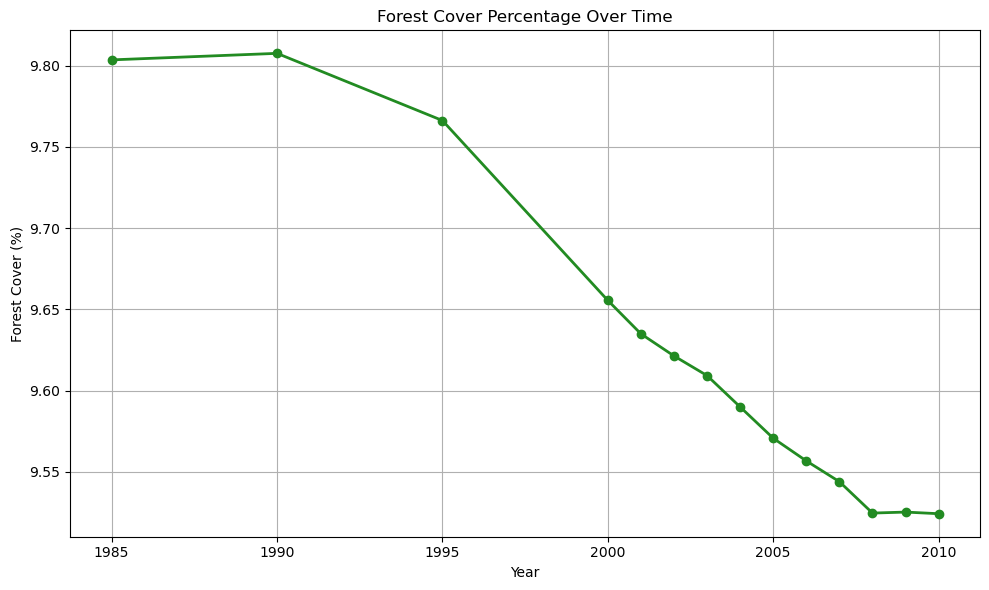

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Load forest cover data
forest_df = pd.read_csv("analysis_results/forest_cover.csv")b

# Plot
plt.figure(figsize=(10, 6))
plt.plot(forest_df["Year"], forest_df["Percentage"], marker='o', color='forestgreen', linewidth=2)
plt.title("Forest Cover Percentage Over Time")
plt.xlabel("Year")
plt.ylabel("Forest Cover (%)")
plt.grid(True)
plt.tight_layout()
plt.show()


### 📊 Land Cover Class Distribution in 1985

This bar chart displays the area covered by each land cover class in the year 1985. It helps compare how different land types contribute to total land usage in a given year.


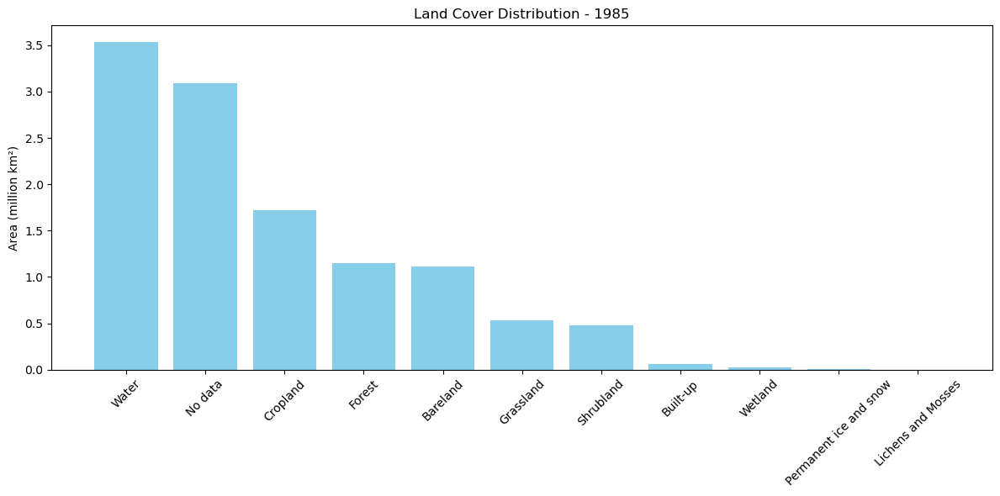

In [12]:
df = pd.read_csv("analysis_results/landcover_1985.csv")  # change year as needed
df = df.sort_values('area_km2', ascending=False)

plt.figure(figsize=(12,6))
plt.bar(df['class'], df['area_km2'] / 1e6, color='skyblue')  # Convert to million km²
plt.xticks(rotation=45)
plt.title("Land Cover Distribution - 1985")
plt.ylabel("Area (million km²)")
plt.tight_layout()
plt.show()


### 📈 Land Cover Class Trends (1985–2010)

This line plot shows how the area of each land cover class has changed over the years. You can observe transitions such as urban expansion, cropland growth, or forest loss.


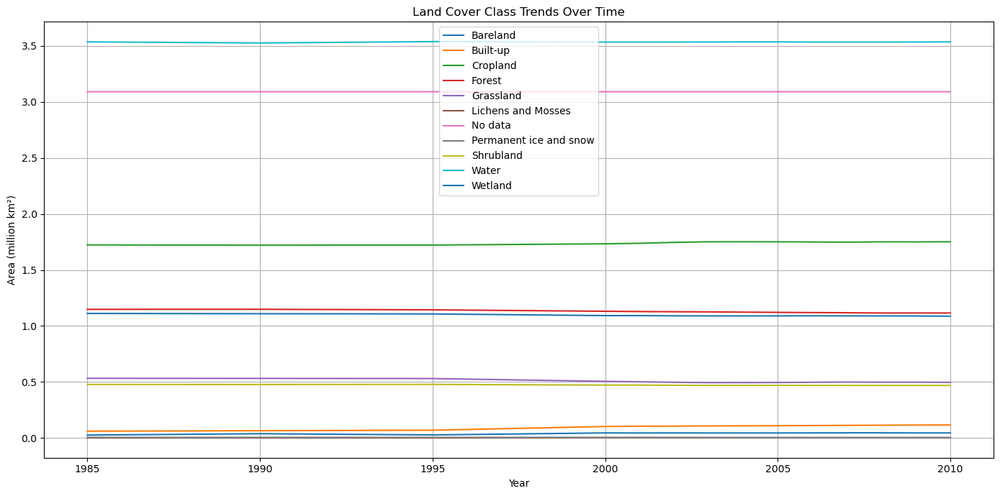

In [13]:
df = pd.read_csv("analysis_results/landcover_complete.csv")
pivot_df = df.pivot_table(index='Year', columns='class', values='area_km2', aggfunc='sum')

plt.figure(figsize=(14,7))
for column in pivot_df.columns:
    plt.plot(pivot_df.index, pivot_df[column] / 1e6, label=column)

plt.title("Land Cover Class Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Area (million km²)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


### 🌈 Land Cover Composition Over Time (Stacked Area)

This chart visualizes how different land cover types contribute to the total area across the years. It shows cumulative changes and class proportions in a layered format.


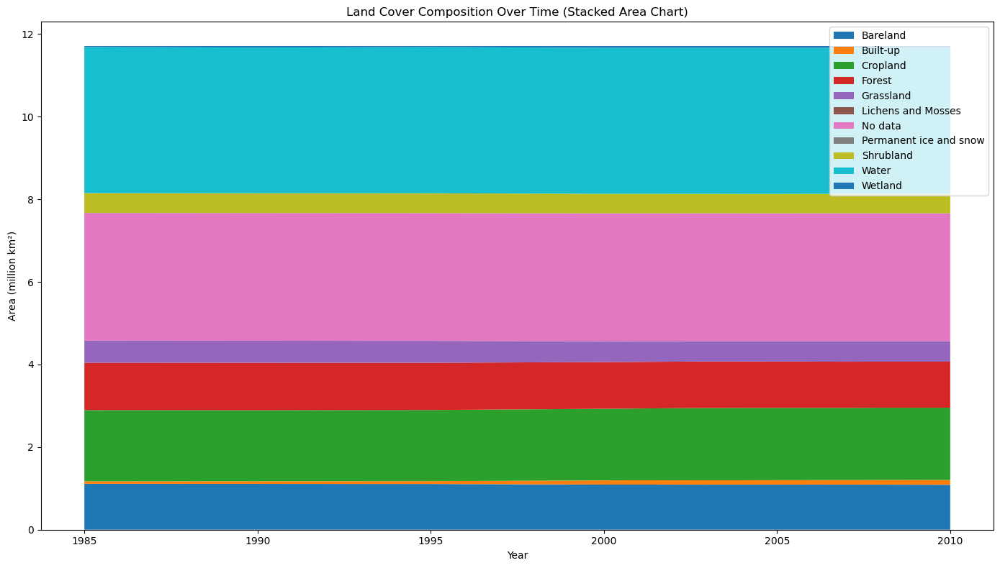

In [14]:
pivot_df.fillna(0, inplace=True)
pivot_df_div = pivot_df / 1e6  # Convert to million km²

plt.figure(figsize=(14,8))
plt.stackplot(pivot_df_div.index, pivot_df_div.T, labels=pivot_df_div.columns)
plt.title("Land Cover Composition Over Time (Stacked Area Chart)")
plt.xlabel("Year")
plt.ylabel("Area (million km²)")
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


### 🔥 Heatmap of Land Cover Area by Class and Year

This heatmap shows the area of each land cover class across years in a compact visual format. Lighter shades represent larger areas, making it easy to spot trends.


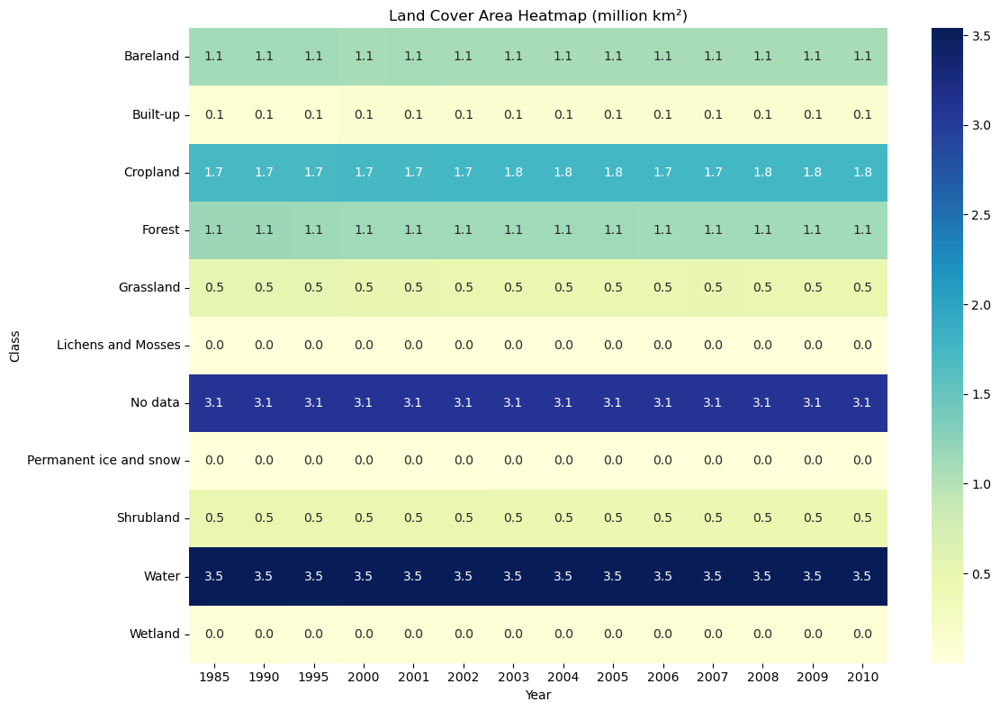

In [15]:
import seaborn as sns

heatmap_df = df.pivot_table(index='class', columns='Year', values='area_km2', aggfunc='sum')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_df / 1e6, cmap="YlGnBu", annot=True, fmt=".1f")  # million km²
plt.title("Land Cover Area Heatmap (million km²)")
plt.ylabel("Class")
plt.xlabel("Year")
plt.tight_layout()
plt.show()


### 🧁 Land Cover Composition as Pie Chart (2000)

A pie chart gives a quick look at land cover proportions in a specific year — here, the year 2000. It's great for presenting class dominance visually.


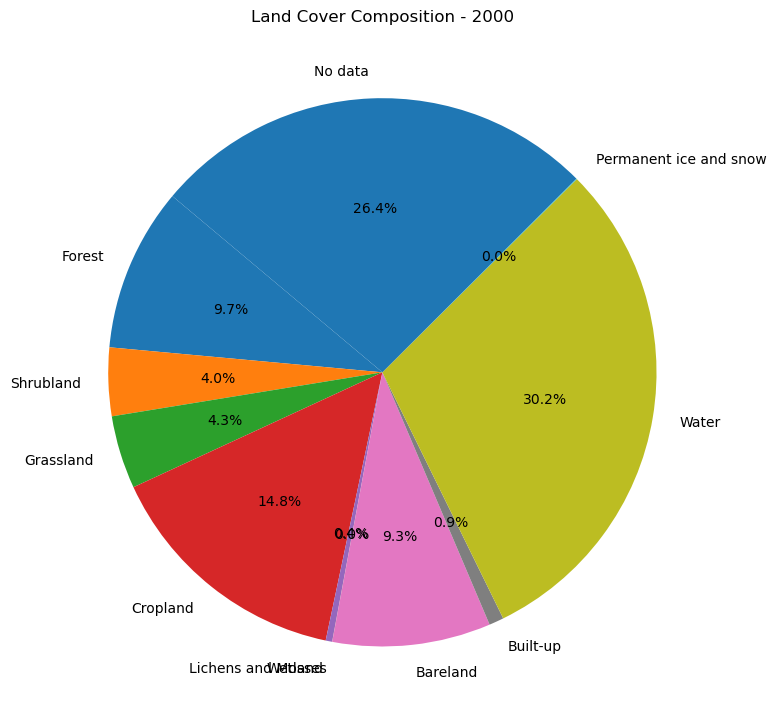

In [16]:
df = pd.read_csv("analysis_results/landcover_2000.csv")  # choose any year

plt.figure(figsize=(8, 8))
plt.pie(df['area_km2'], labels=df['class'], autopct='%1.1f%%', startangle=140)
plt.title("Land Cover Composition - 2000")
plt.tight_layout()
plt.show()


Columns in your CSV file:
['Year', 'Class', 'Area_Mha']

Using columns:
Year column: Year
Class column: Class
Area column: Area_Mha

Available years in your data: [np.int64(1985), np.int64(1990), np.int64(1995), np.int64(2000), np.int64(2001), np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022)]


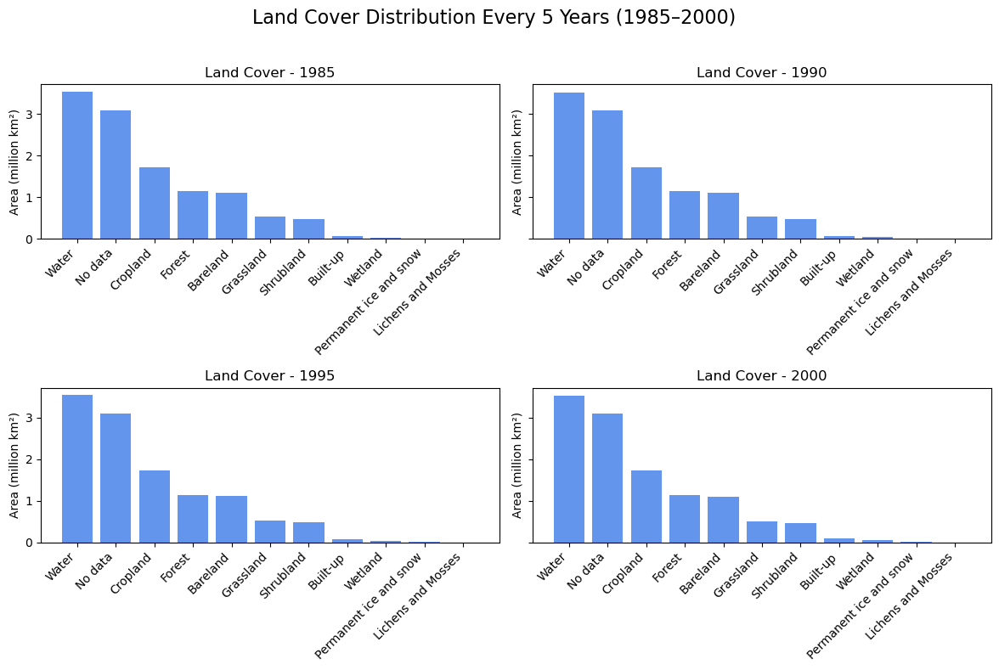

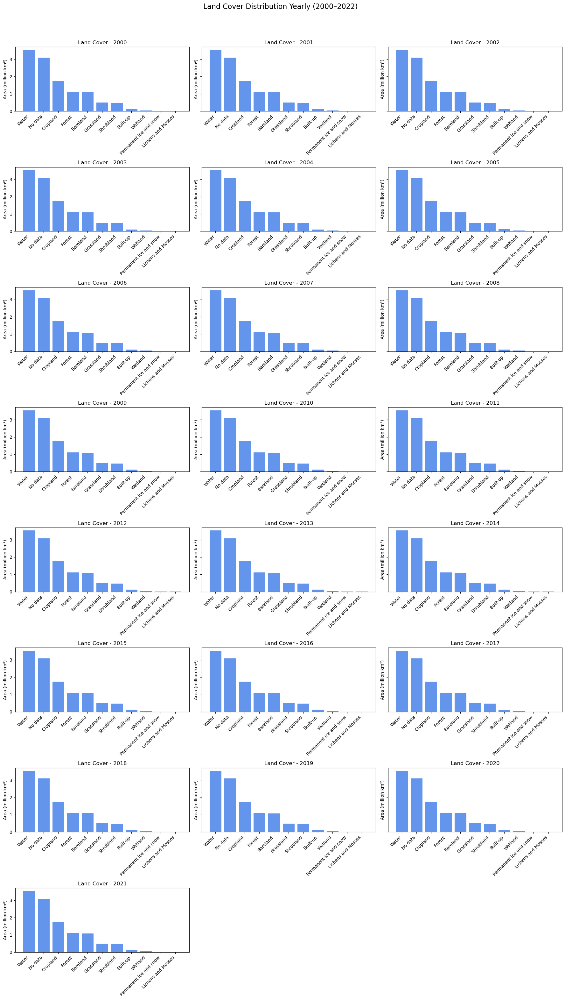

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from matplotlib.ticker import FixedLocator

# Path to your CSV
csv_path = '/Users/ghulamabbaszafari/Downloads/Thesis/analysis result1/land_cover_stats.csv'

# Read the CSV file
df = pd.read_csv(csv_path)

# First, let's examine the actual column names
print("Columns in your CSV file:")
print(df.columns.tolist())

# Assuming your CSV has columns like 'Year', 'Class', and 'Area_km2' (adjust as needed)
# Let's try to automatically detect the correct columns
year_col = next((col for col in df.columns if 'year' in col.lower()), None)
class_col = next((col for col in df.columns if 'class' in col.lower()), None)
area_col = next((col for col in df.columns if 'area' in col.lower() or 'km2' in col.lower()), None)

if not all([year_col, class_col, area_col]):
    raise ValueError("Could not automatically detect required columns. Please specify them manually.")

print(f"\nUsing columns:")
print(f"Year column: {year_col}")
print(f"Class column: {class_col}")
print(f"Area column: {area_col}\n")

# Get unique years from your data
available_years = sorted(df[year_col].unique())
print(f"Available years in your data: {available_years}")

# Grouped years - adjust these to match your actual years
years_5yr = [y for y in [1985, 1990, 1995, 2000] if y in available_years]
years_1yr = [y for y in range(2000, 2022) if y in available_years]

def plot_landcover_side_by_side(years, title, ncols=2):
    if not years:
        print(f"No data available for the specified years in: {title}")
        return
        
    nrows = (len(years) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 4 * nrows), sharey=True)
    axes = axes.flatten() if nrows > 1 else [axes]

    for i, year in enumerate(years):
        # Filter data for the current year
        year_data = df[df[year_col] == year]
        year_data = year_data.sort_values(area_col, ascending=False)

        ax = axes[i]
        bars = ax.bar(year_data[class_col], year_data[area_col] / 1e6, color="cornflowerblue")
        ax.set_title(f"Land Cover - {year}")
        ax.set_ylabel("Area (million km²)")

        # Set ticks and tick labels
        ax.set_xticks(range(len(year_data[class_col])))
        ax.set_xticklabels(year_data[class_col], rotation=45, ha="right")

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Plot for every 5 years (1985–2000)
plot_landcover_side_by_side(years_5yr, "Land Cover Distribution Every 5 Years (1985–2000)", ncols=2)

# Plot for every year from 2000 to 2021
plot_landcover_side_by_side(years_1yr, "Land Cover Distribution Yearly (2000–2022)", ncols=3)

In [4]:
import grass.script as gs

# Make sure the raster name matches exactly
gs.run_command("g.region", raster="GLC_FCS30_1985")


📊 Processing GLC_FCS30_1985...
📊 Processing GLC_FCS30_1990...
📊 Processing GLC_FCS30_1995...
📊 Processing GLC_FCS30_2000...
📊 Processing GLC_FCS30_2001...
📊 Processing GLC_FCS30_2002...
📊 Processing GLC_FCS30_2003...
📊 Processing GLC_FCS30_2004...
📊 Processing GLC_FCS30_2005...
📊 Processing GLC_FCS30_2006...
📊 Processing GLC_FCS30_2007...
📊 Processing GLC_FCS30_2008...
📊 Processing GLC_FCS30_2009...
📊 Processing GLC_FCS30_2010...
📊 Processing GLC_FCS30_2011...
📊 Processing GLC_FCS30_2012...
📊 Processing GLC_FCS30_2013...
📊 Processing GLC_FCS30_2014...
📊 Processing GLC_FCS30_2015...
📊 Processing GLC_FCS30_2016...
📊 Processing GLC_FCS30_2017...
📊 Processing GLC_FCS30_2018...
📊 Processing GLC_FCS30_2019...
📊 Processing GLC_FCS30_2020...
📊 Processing GLC_FCS30_2021...
📊 Processing GLC_FCS30_2022...

🧾 Preview of collected data:
   Year      Class      Area_Mha
0  1985    No data  3.091663e+06
1  1985  Shrubland  4.773734e+05
2  1985  Grassland  5.318670e+05
3  1985   Cropland  1.723700e+06

/var/folders/mz/wk_rk1fs2m96vphdr62m5bym0000gn/T/grass8-ghulamabbaszafari-19577/ipykernel_19624/957426273.py:99: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  plt.tight_layout()
/opt/anaconda3/envs/Geogis/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


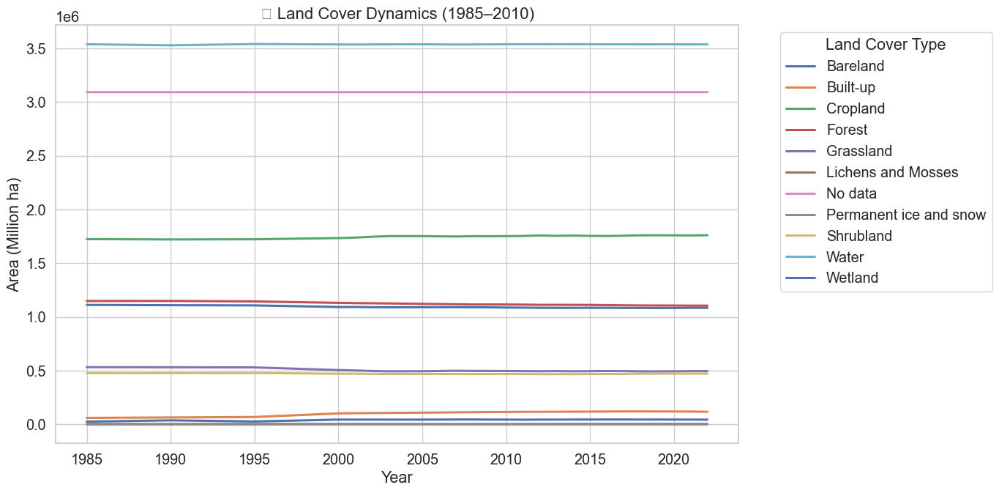

✅ land_cover_stats.csv saved.


In [14]:
import grass.script as gs
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === 1. Define raster years ===
years = [1985, 1990, 1995, 2000] + list(range(2001, 2023))
raster_prefix = "GLC_FCS30_"

# === 2. Class label mapping (from your rasters) ===
class_labels = {
    
    5: "Shrubland",
    7: "Grassland",
    8: "Cropland",
    9: "Wetland",
    11: "Lichens and Mosses",
    12: "Bareland",
    13: "Built-up",
    15: "Water",
    16: "Permanent ice and snow",
    20: "Forest",
    
}

# === 3. Collect area stats from each raster ===
all_stats = []

for year in years:
    raster = f"{raster_prefix}{year}"
    print(f"📊 Processing {raster}...")

    try:
        # Check raster presence without mapset suffix
        available_rasters = [
            r.split("@")[0] for r in gs.read_command("g.list", type="raster", flags="m").splitlines()
        ]

        if raster not in available_rasters:
            print(f"⚠️ Raster {raster} not found, skipping.")
            continue

        # Set region to match raster
        gs.run_command("g.region", raster=raster, quiet=True)

        # Extract class statistics (value;area)
        stats = gs.read_command("r.stats", flags="an", input=raster, sep=";", quiet=True)

        for line in stats.strip().split("\n"):
            parts = line.strip().split(";")
            if len(parts) != 2:
                continue

            try:
                val = int(parts[0])
                area_m2 = float(parts[1])
                area_ha = area_m2 / 1e6  # Convert to million ha

                if val in class_labels:
                    all_stats.append({
                        "Year": year,
                        "Class": class_labels[val],
                        "Area_Mha": area_ha
                    })

            except Exception as e:
                print(f"⚠️ Parse error in {raster}: {line} → {e}")
                continue

    except Exception as e:
        print(f"❌ Error with {raster}: {e}")
        continue

# === 4. Create DataFrame & sanity check ===
df = pd.DataFrame(all_stats)

if df.empty:
    raise ValueError("No stats collected. Check raster availability and class values.")

print("\n🧾 Preview of collected data:")
print(df.head())
print("\n📌 Available columns:", df.columns.tolist())

# === 5. Pivot table for time-series plotting ===
df_pivot = df.pivot(index="Year", columns="Class", values="Area_Mha").fillna(0)

# === 6. Plot line chart of land cover over time ===
sns.set(style="whitegrid", font_scale=1.3)
plt.figure(figsize=(14, 7))

for col in df_pivot.columns:
    plt.plot(df_pivot.index, df_pivot[col], label=col, linewidth=2.2)

plt.title("🌍 Land Cover Dynamics (1985–2010)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Area (Million ha)")
plt.legend(title="Land Cover Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.tight_layout()
plt.show()

# === 7. Save to CSV ===
df.to_csv("land_cover_stats.csv", index=False)
print("✅ land_cover_stats.csv saved.")


In [15]:
import pandas as pd

# Load the CSV file
csv_path = "/Users/ghulamabbaszafari/Downloads/Thesis/land_cover_stats.csv"
df = pd.read_csv(csv_path)

# Display the full DataFrame
df


,Year,Class,Area_Mha
0,1985,No data,3.091663e+06
1,1985,Shrubland,4.773734e+05
2,1985,Grassland,5.318670e+05
3,1985,Cropland,1.723700e+06
4,1985,Wetland,2.527323e+04
...,...,...,...
281,2022,Bareland,1.084614e+06
282,2022,Built-up,1.168031e+05
283,2022,Water,3.535810e+06
284,2022,Permanent ice and snow,4.607015e+03


In [16]:
import pandas as pd

# Load your CSV
csv_path = "/Users/ghulamabbaszafari/Downloads/Thesis/land_cover_stats.csv"
df = pd.read_csv(csv_path)

# Sort by year just in case (optional)
df = df.sort_values(by='Year')

# Display with year separators
unique_years = df['Year'].unique()

for year in unique_years:
    print(f"\n{'='*50} YEAR: {year} {'='*50}\n")
    display(df[df['Year'] == year])



================================================== YEAR: 1985 ==================================================



,Year,Class,Area_Mha
0,1985,No data,3.091663e+06
1,1985,Shrubland,4.773734e+05
2,1985,Grassland,5.318670e+05
3,1985,Cropland,1.723700e+06
4,1985,Wetland,2.527323e+04
5,1985,Lichens and Mosses,5.527391e-04
6,1985,Bareland,1.111535e+06
7,1985,Built-up,6.021202e+04
8,1985,Water,3.536782e+06
9,1985,Permanent ice and snow,4.167128e+03



================================================== YEAR: 1990 ==================================================



,Year,Class,Area_Mha
11,1990,No data,3.091663e+06
12,1990,Shrubland,4.769296e+05
13,1990,Grassland,5.312088e+05
20,1990,Permanent ice and snow,4.256131e+03
21,1990,Forest,1.148522e+06
14,1990,Cropland,1.720663e+06
15,1990,Wetland,3.732715e+04
16,1990,Lichens and Mosses,5.527391e-04
17,1990,Bareland,1.108916e+06
19,1990,Water,3.527045e+06



================================================== YEAR: 1995 ==================================================



,Year,Class,Area_Mha
28,1995,Bareland,1.106922e+06
29,1995,Built-up,6.860381e+04
32,1995,Forest,1.143683e+06
22,1995,No data,3.091663e+06
23,1995,Shrubland,4.778334e+05
24,1995,Grassland,5.298503e+05
27,1995,Lichens and Mosses,5.527391e-04
26,1995,Wetland,2.660263e+04
30,1995,Water,3.539009e+06
31,1995,Permanent ice and snow,4.245490e+03



================================================== YEAR: 2000 ==================================================



,Year,Class,Area_Mha
33,2000,No data,3.091694e+06
34,2000,Shrubland,4.713897e+05
35,2000,Grassland,5.050187e+05
36,2000,Cropland,1.733329e+06
37,2000,Wetland,4.432035e+04
38,2000,Lichens and Mosses,1.003627e+03
39,2000,Bareland,1.092066e+06
40,2000,Built-up,1.018206e+05
41,2000,Water,3.534916e+06
42,2000,Permanent ice and snow,4.345691e+03



================================================== YEAR: 2001 ==================================================



,Year,Class,Area_Mha
44,2001,No data,3.091694e+06
45,2001,Shrubland,4.712620e+05
46,2001,Grassland,5.012789e+05
47,2001,Cropland,1.737867e+06
48,2001,Wetland,4.377142e+04
49,2001,Lichens and Mosses,1.013539e+03
50,2001,Bareland,1.092126e+06
51,2001,Built-up,1.040659e+05
52,2001,Water,3.534801e+06
53,2001,Permanent ice and snow,4.428599e+03



================================================== YEAR: 2002 ==================================================



,Year,Class,Area_Mha
55,2002,No data,3.091694e+06
56,2002,Shrubland,4.701264e+05
57,2002,Grassland,4.964295e+05
58,2002,Cropland,1.745989e+06
59,2002,Wetland,4.422601e+04
60,2002,Lichens and Mosses,9.772372e+02
61,2002,Bareland,1.089987e+06
62,2002,Built-up,1.052096e+05
63,2002,Water,3.535183e+06
64,2002,Permanent ice and snow,4.080598e+03



================================================== YEAR: 2003 ==================================================



,Year,Class,Area_Mha
66,2003,No data,3.091694e+06
67,2003,Shrubland,4.686754e+05
68,2003,Grassland,4.932364e+05
69,2003,Cropland,1.751281e+06
70,2003,Wetland,4.378186e+04
71,2003,Lichens and Mosses,1.004822e+03
72,2003,Bareland,1.089219e+06
73,2003,Built-up,1.067000e+05
74,2003,Water,3.535904e+06
75,2003,Permanent ice and snow,3.822605e+03



================================================== YEAR: 2004 ==================================================



,Year,Class,Area_Mha
77,2004,No data,3.091694e+06
78,2004,Shrubland,4.686913e+05
79,2004,Grassland,4.937669e+05
80,2004,Cropland,1.751759e+06
81,2004,Wetland,4.369799e+04
82,2004,Lichens and Mosses,1.001860e+03
83,2004,Bareland,1.089331e+06
84,2004,Built-up,1.076285e+05
85,2004,Water,3.536524e+06
86,2004,Permanent ice and snow,3.482248e+03



================================================== YEAR: 2005 ==================================================



,Year,Class,Area_Mha
88,2005,No data,3.091694e+06
89,2005,Shrubland,4.691184e+05
90,2005,Grassland,4.944248e+05
91,2005,Cropland,1.751176e+06
92,2005,Wetland,4.378036e+04
93,2005,Lichens and Mosses,9.969546e+02
94,2005,Bareland,1.089604e+06
95,2005,Built-up,1.091346e+05
96,2005,Water,3.536565e+06
97,2005,Permanent ice and snow,3.336866e+03



================================================== YEAR: 2006 ==================================================



,Year,Class,Area_Mha
99,2006,No data,3.091694e+06
100,2006,Shrubland,4.688811e+05
101,2006,Grassland,4.964153e+05
102,2006,Cropland,1.749700e+06
103,2006,Wetland,4.447351e+04
104,2006,Lichens and Mosses,9.855051e+02
105,2006,Bareland,1.090249e+06
106,2006,Built-up,1.102852e+05
107,2006,Water,3.535207e+06
108,2006,Permanent ice and snow,3.573854e+03



================================================== YEAR: 2007 ==================================================



,Year,Class,Area_Mha
110,2007,No data,3.091694e+06
111,2007,Shrubland,4.685776e+05
112,2007,Grassland,4.986869e+05
113,2007,Cropland,1.747832e+06
114,2007,Wetland,4.508270e+04
115,2007,Lichens and Mosses,9.669088e+02
116,2007,Bareland,1.089877e+06
117,2007,Built-up,1.118048e+05
118,2007,Water,3.534818e+06
119,2007,Permanent ice and snow,3.620476e+03



================================================== YEAR: 2008 ==================================================



,Year,Class,Area_Mha
121,2008,No data,3.091694e+06
122,2008,Shrubland,4.682872e+05
123,2008,Grassland,4.972417e+05
124,2008,Cropland,1.750892e+06
125,2008,Wetland,4.512037e+04
126,2008,Lichens and Mosses,9.355419e+02
127,2008,Bareland,1.089402e+06
131,2008,Forest,1.115403e+06
130,2008,Permanent ice and snow,3.634714e+03
129,2008,Water,3.534872e+06



================================================== YEAR: 2009 ==================================================



,Year,Class,Area_Mha
135,2009,Cropland,1.750251e+06
142,2009,Forest,1.115475e+06
141,2009,Permanent ice and snow,3.754293e+03
140,2009,Water,3.535765e+06
139,2009,Built-up,1.142936e+05
134,2009,Grassland,4.970450e+05
133,2009,Shrubland,4.683712e+05
132,2009,No data,3.091694e+06
137,2009,Lichens and Mosses,9.237432e+02
138,2009,Bareland,1.088798e+06



================================================== YEAR: 2010 ==================================================



,Year,Class,Area_Mha
143,2010,No data,3.091694e+06
144,2010,Shrubland,4.684467e+05
145,2010,Grassland,4.961351e+05
146,2010,Cropland,1.751598e+06
147,2010,Wetland,4.420163e+04
148,2010,Lichens and Mosses,9.167239e+02
149,2010,Bareland,1.086892e+06
150,2010,Built-up,1.152316e+05
151,2010,Water,3.536698e+06
152,2010,Permanent ice and snow,3.453209e+03



================================================== YEAR: 2011 ==================================================



,Year,Class,Area_Mha
154,2011,No data,3.091694e+06
155,2011,Shrubland,4.690712e+05
156,2011,Grassland,4.953992e+05
157,2011,Cropland,1.752859e+06
158,2011,Wetland,4.308060e+04
159,2011,Lichens and Mosses,9.434372e+02
160,2011,Bareland,1.086253e+06
161,2011,Built-up,1.161831e+05
162,2011,Water,3.537466e+06
163,2011,Permanent ice and snow,3.556303e+03



================================================== YEAR: 2012 ==================================================



,Year,Class,Area_Mha
165,2012,No data,3.091694e+06
166,2012,Shrubland,4.672896e+05
167,2012,Grassland,4.944618e+05
168,2012,Cropland,1.757414e+06
169,2012,Wetland,4.401587e+04
170,2012,Lichens and Mosses,9.337798e+02
171,2012,Bareland,1.084516e+06
172,2012,Built-up,1.165677e+05
173,2012,Water,3.537235e+06
174,2012,Permanent ice and snow,4.235724e+03



================================================== YEAR: 2013 ==================================================



,Year,Class,Area_Mha
176,2013,No data,3.091694e+06
177,2013,Shrubland,4.675609e+05
178,2013,Grassland,4.955271e+05
179,2013,Cropland,1.754510e+06
180,2013,Wetland,4.410408e+04
181,2013,Lichens and Mosses,9.825961e+02
182,2013,Bareland,1.084532e+06
183,2013,Built-up,1.172899e+05
184,2013,Water,3.536997e+06
185,2013,Permanent ice and snow,4.735346e+03



================================================== YEAR: 2014 ==================================================



,Year,Class,Area_Mha
187,2014,No data,3.091694e+06
188,2014,Shrubland,4.672005e+05
189,2014,Grassland,4.937577e+05
190,2014,Cropland,1.756375e+06
191,2014,Wetland,4.473147e+04
195,2014,Water,3.537013e+06
194,2014,Built-up,1.178055e+05
197,2014,Forest,1.112140e+06
196,2014,Permanent ice and snow,4.747592e+03
193,2014,Bareland,1.084180e+06



================================================== YEAR: 2015 ==================================================



,Year,Class,Area_Mha
207,2015,Permanent ice and snow,4.735404e+03
206,2015,Water,3.536770e+06
199,2015,Shrubland,4.686844e+05
198,2015,No data,3.091694e+06
205,2015,Built-up,1.183673e+05
204,2015,Bareland,1.084820e+06
203,2015,Lichens and Mosses,9.995480e+02
202,2015,Wetland,4.478252e+04
201,2015,Cropland,1.753459e+06
200,2015,Grassland,4.948669e+05



================================================== YEAR: 2016 ==================================================



,Year,Class,Area_Mha
213,2016,Wetland,4.500761e+04
212,2016,Cropland,1.752658e+06
214,2016,Lichens and Mosses,9.703982e+02
215,2016,Bareland,1.084699e+06
217,2016,Water,3.536320e+06
211,2016,Grassland,4.966276e+05
210,2016,Shrubland,4.685121e+05
209,2016,No data,3.091694e+06
219,2016,Forest,1.109871e+06
216,2016,Built-up,1.195541e+05



================================================== YEAR: 2017 ==================================================



,Year,Class,Area_Mha
229,2017,Permanent ice and snow,4.729594e+03
225,2017,Lichens and Mosses,9.883307e+02
228,2017,Water,3.535999e+06
227,2017,Built-up,1.203559e+05
226,2017,Bareland,1.083406e+06
230,2017,Forest,1.108097e+06
224,2017,Wetland,4.526688e+04
223,2017,Cropland,1.755418e+06
220,2017,No data,3.091694e+06
221,2017,Shrubland,4.692395e+05



================================================== YEAR: 2018 ==================================================



,Year,Class,Area_Mha
240,2018,Permanent ice and snow,4.762294e+03
239,2018,Water,3.535830e+06
238,2018,Built-up,1.203954e+05
234,2018,Cropland,1.758948e+06
235,2018,Wetland,4.442973e+04
237,2018,Bareland,1.082967e+06
232,2018,Shrubland,4.709409e+05
233,2018,Grassland,4.931534e+05
231,2018,No data,3.091694e+06
236,2018,Lichens and Mosses,9.694624e+02



================================================== YEAR: 2019 ==================================================



,Year,Class,Area_Mha
247,2019,Lichens and Mosses,9.667728e+02
251,2019,Permanent ice and snow,4.737679e+03
250,2019,Water,3.536220e+06
249,2019,Built-up,1.200036e+05
245,2019,Cropland,1.759596e+06
243,2019,Shrubland,4.716262e+05
244,2019,Grassland,4.925866e+05
246,2019,Wetland,4.490106e+04
248,2019,Bareland,1.082240e+06
242,2019,No data,3.091694e+06



================================================== YEAR: 2020 ==================================================



,Year,Class,Area_Mha
263,2020,Forest,1.105550e+06
262,2020,Permanent ice and snow,4.711656e+03
256,2020,Cropland,1.759130e+06
253,2020,No data,3.091694e+06
255,2020,Grassland,4.935720e+05
254,2020,Shrubland,4.720968e+05
260,2020,Built-up,1.198533e+05
257,2020,Wetland,4.444848e+04
258,2020,Lichens and Mosses,9.921805e+02
259,2020,Bareland,1.082444e+06



================================================== YEAR: 2021 ==================================================



,Year,Class,Area_Mha
267,2021,Cropland,1.757800e+06
268,2021,Wetland,4.414471e+04
269,2021,Lichens and Mosses,9.800794e+02
265,2021,Shrubland,4.721369e+05
273,2021,Permanent ice and snow,4.639877e+03
274,2021,Forest,1.104788e+06
272,2021,Water,3.535601e+06
271,2021,Built-up,1.192610e+05
270,2021,Bareland,1.084541e+06
264,2021,No data,3.091694e+06



================================================== YEAR: 2022 ==================================================



,Year,Class,Area_Mha
285,2022,Forest,1.104451e+06
283,2022,Water,3.535810e+06
284,2022,Permanent ice and snow,4.607015e+03
276,2022,Shrubland,4.723886e+05
275,2022,No data,3.091694e+06
277,2022,Grassland,4.952963e+05
279,2022,Wetland,4.371047e+04
280,2022,Lichens and Mosses,9.973763e+02
278,2022,Cropland,1.760253e+06
282,2022,Built-up,1.168031e+05


In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv("/Users/ghulamabbaszafari/Downloads/Thesis/land_cover_stats.csv")

# Quick check
print(df.head())

# Convert Area to numeric in case it's not
df['Area_Mha'] = pd.to_numeric(df['Area_Mha'], errors='coerce')

# Pivot for easier analysis
pivot_df = df.pivot(index='Year', columns='Class', values='Area_Mha')


   Year      Class      Area_Mha
0  1985    No data  3.091663e+06
1  1985  Shrubland  4.773734e+05
2  1985  Grassland  5.318670e+05
3  1985   Cropland  1.723700e+06
4  1985    Wetland  2.527323e+04


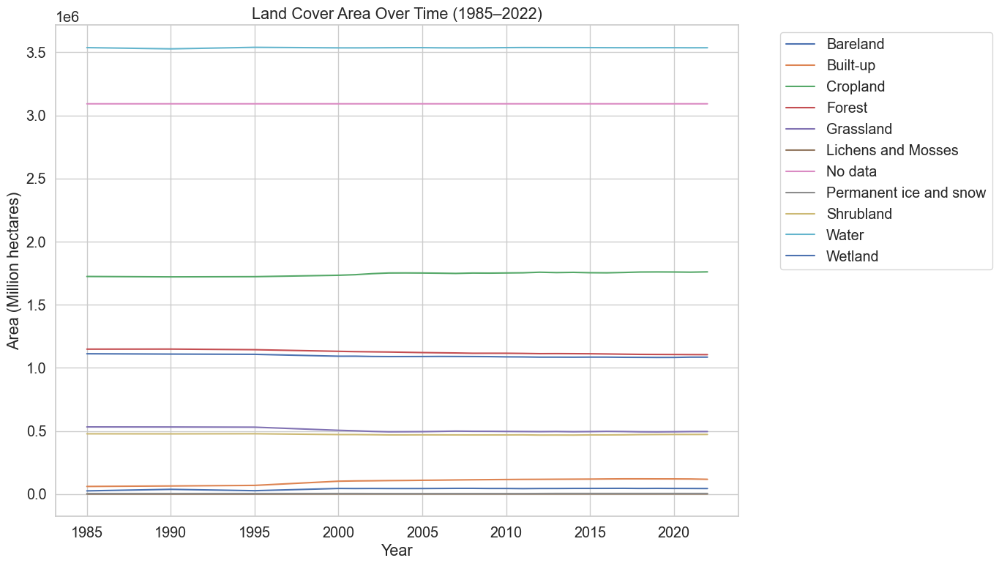

In [20]:
import matplotlib.pyplot as plt

# Ensure the index is integer type
pivot_df.index = pivot_df.index.astype(int)

# Select the years you want
selected_years = [1985, 1990, 1995, 2000] + list(range(2001, 2023))

# Filter the DataFrame to include only selected years
filtered_df = pivot_df[pivot_df.index.isin(selected_years)]

# Sort the filtered DataFrame just in case
filtered_df = filtered_df.sort_index()

# Plot
filtered_df.plot(figsize=(14, 8))
plt.title("Land Cover Area Over Time (1985–2022)")
plt.ylabel("Area (Million hectares)")
plt.xlabel("Year")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(True)
plt.show()


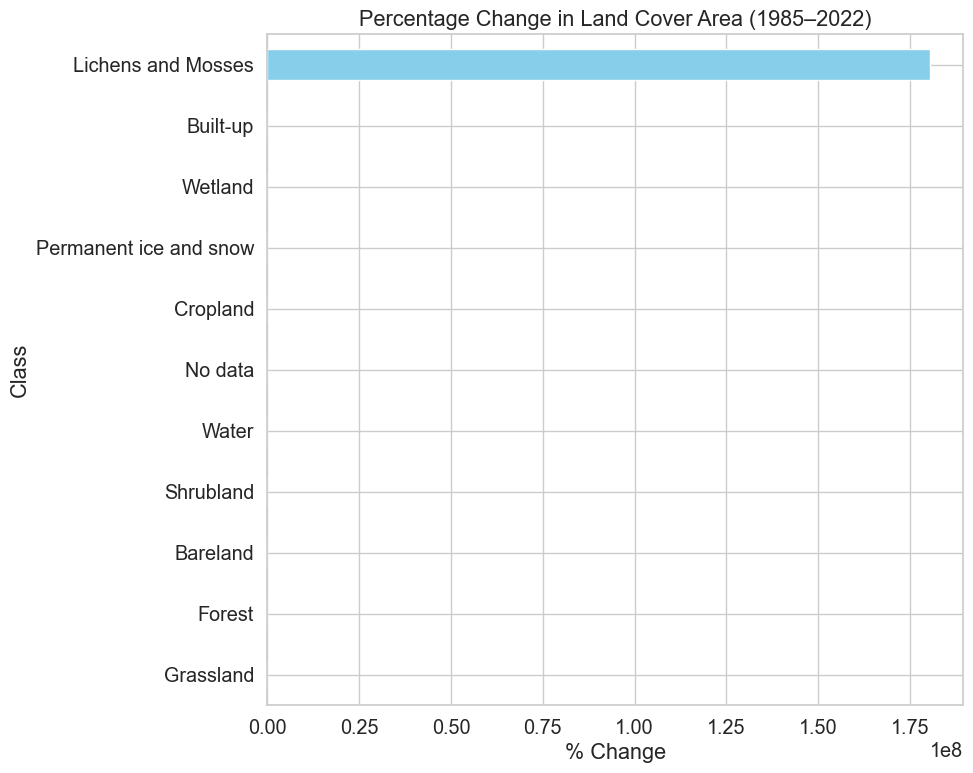

In [21]:
start_year = 1985
end_year = 2022

percent_change = ((pivot_df.loc[end_year] - pivot_df.loc[start_year]) / pivot_df.loc[start_year]) * 100
percent_change = percent_change.sort_values()

percent_change.plot(kind='barh', figsize=(10, 8), color='skyblue')
plt.title(f"Percentage Change in Land Cover Area ({start_year}–{end_year})")
plt.xlabel("% Change")
plt.grid(True)
plt.tight_layout()
plt.show()


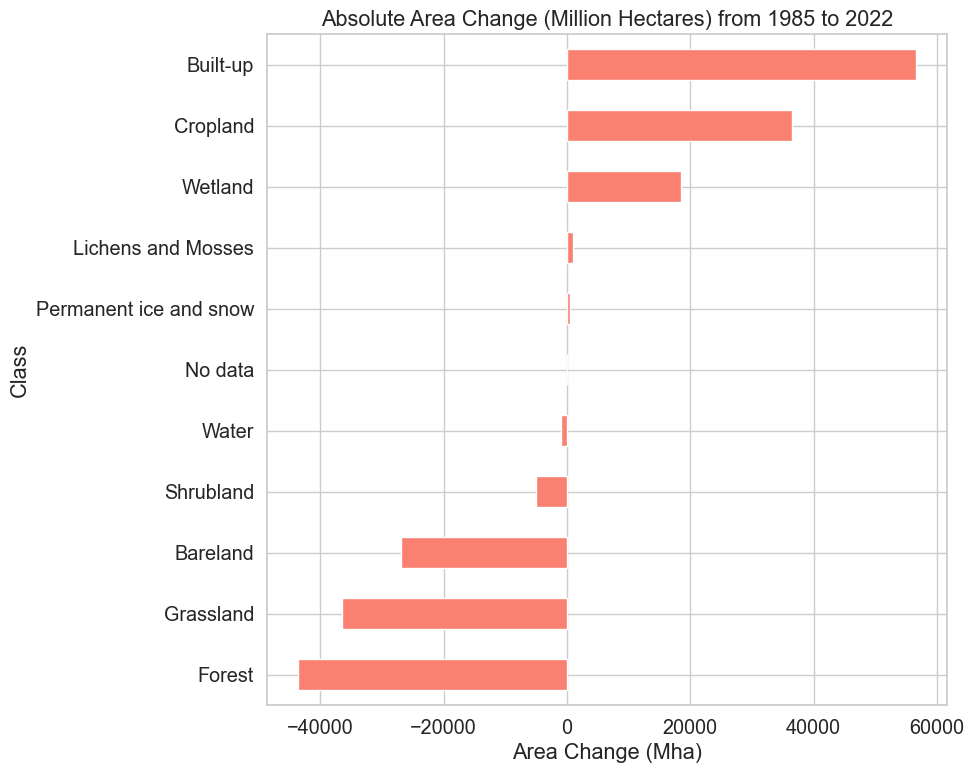

In [22]:
abs_change = (pivot_df.loc[end_year] - pivot_df.loc[start_year]).sort_values()

abs_change.plot(kind='barh', figsize=(10, 8), color='salmon')
plt.title(f"Absolute Area Change (Million Hectares) from {start_year} to {end_year}")
plt.xlabel("Area Change (Mha)")
plt.grid(True)
plt.tight_layout()
plt.show()


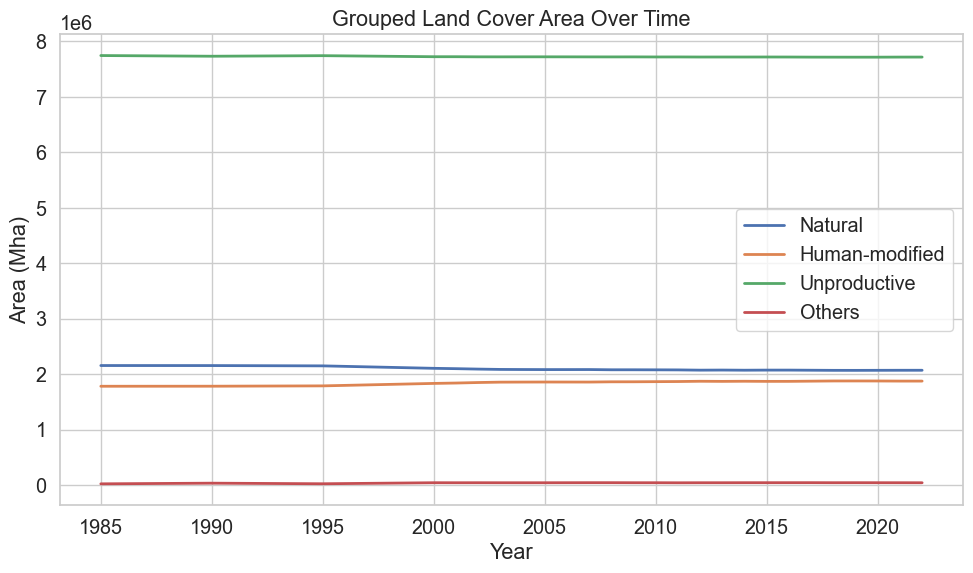

In [23]:
groupings = {
    "Natural": ["Forest", "Shrubland", "Grassland"],
    "Human-modified": ["Cropland", "Built-up"],
    "Unproductive": ["Bareland", "Water", "Permanent ice and snow", "No data"],
    "Others": ["Wetland", "Lichens and Mosses"]
}

group_df = pd.DataFrame(index=pivot_df.index)

for group, classes in groupings.items():
    group_df[group] = pivot_df[classes].sum(axis=1)

group_df.plot(figsize=(10, 6), linewidth=2)
plt.title("Grouped Land Cover Area Over Time")
plt.ylabel("Area (Mha)")
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/mz/wk_rk1fs2m96vphdr62m5bym0000gn/T/grass8-ghulamabbaszafari-19577/ipykernel_19624/3825633294.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=ranked.values, y=ranked.index, palette='coolwarm')


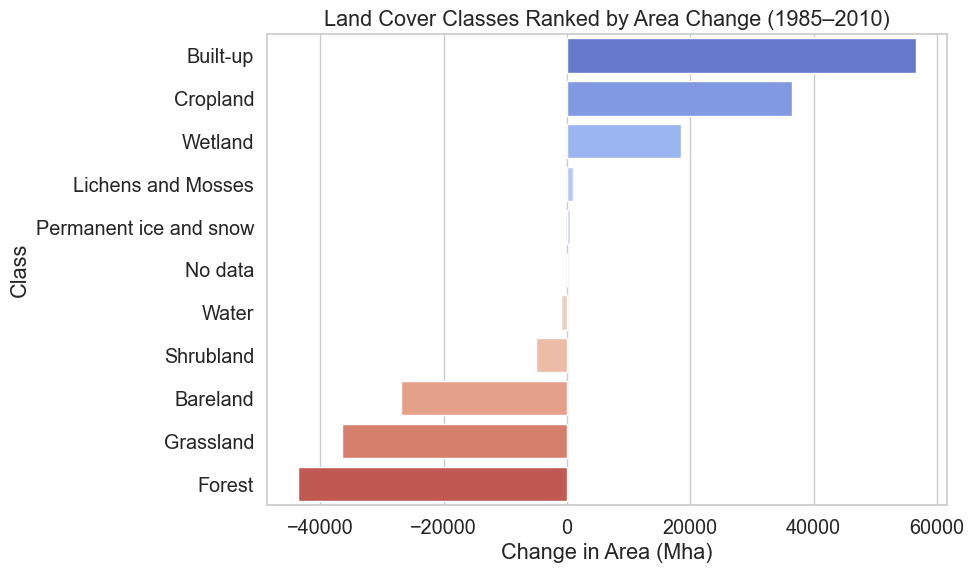

In [24]:
ranked = abs_change.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=ranked.values, y=ranked.index, palette='coolwarm')
plt.title("Land Cover Classes Ranked by Area Change (1985–2010)")
plt.xlabel("Change in Area (Mha)")
plt.tight_layout()
plt.show()


In [14]:
!pip install scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.2/25.2 MB 4.2 MB/s eta 0:00:0000:0100:01


In [2]:
pip install scipy

  Using cached scipy-1.15.2-cp310-cp310-macosx_14_0_x86_64.whl.metadata (61 kB)
Using cached scipy-1.15.2-cp310-cp310-macosx_14_0_x86_64.whl (25.1 MB)
Note: you may need to restart the kernel to use updated packages.


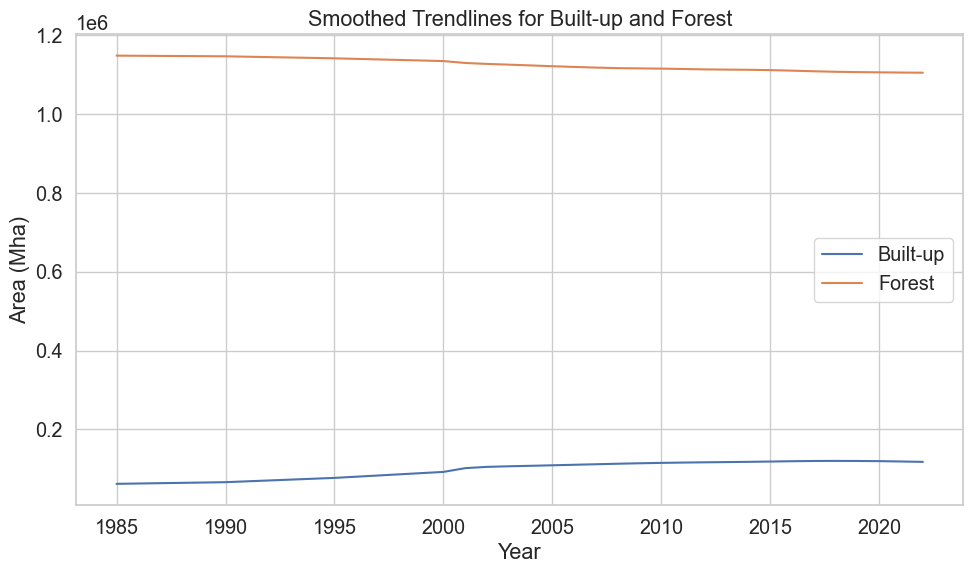

In [25]:
import pandas as pd

# Load your CSV file
df = pd.read_csv('/Users/ghulamabbaszafari/Downloads/Thesis/land_cover_stats.csv')  # Replace with your actual file path if needed

# Pivot the DataFrame
pivot_df = df.pivot(index='Year', columns='Class', values='Area_Mha')



import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d


plt.figure(figsize=(10, 6))

for col in ['Built-up', 'Forest']:
    smoothed = gaussian_filter1d(pivot_df[col], sigma=1)
    plt.plot(pivot_df.index, smoothed, label=col)

plt.title("Smoothed Trendlines for Built-up and Forest")
plt.ylabel("Area (Mha)")
plt.xlabel("Year")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.ndimage import gaussian_filter1d

# Step 1: Load and pivot the data
df = pd.read_csv('/Users/ghulamabbaszafari/Downloads/Thesis/analysis result1/land_cover_stats.csv')
pivot_df = df.pivot(index='Year', columns='Class', values='Area_Mha')
pivot_df.index = pivot_df.index.astype(int)

# Step 2: Normalize and smooth the data
normalized_df = pivot_df / pivot_df.max()
smoothed_abs = normalized_df.apply(lambda x: gaussian_filter1d(x, sigma=1), axis=0)

# Step 3: Set up the figure
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(pivot_df.index.min(), pivot_df.index.max())
ax.set_ylim(0, 1.05)
ax.set_xlabel("Year")
ax.set_ylabel("Normalized Area")
ax.set_title("Smoothed Normalized Trends of Land Cover Classes (1985–2022)")

lines = {}
for land_class in smoothed_abs.columns:
    (line,) = ax.plot([], [], label=land_class)
    lines[land_class] = line

ax.legend()

# Step 4: Animation function
def update(frame):
    for land_class in smoothed_abs.columns:
        y_data = smoothed_abs[land_class].values[:frame + 1]
        x_data = smoothed_abs.index[:frame + 1]
        lines[land_class].set_data(x_data, y_data)
    return lines.values()

# Step 5: Create and save the animation
anim = FuncAnimation(fig, update, frames=len(smoothed_abs), interval=200, blit=True)

# Save animation as .mp4
anim.save("land_cover_trends.mp4", writer='ffmpeg')

plt.close(fig)  # Prevents extra inline display in notebooks
print("✅ Animation saved as 'land_cover_trends.mp4'")


✅ Animation saved as 'land_cover_trends.mp4'


In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.ndimage import gaussian_filter1d
import seaborn as sns

# Load data
df = pd.read_csv('/Users/ghulamabbaszafari/Downloads/Thesis/analysis result1/land_cover_stats.csv')
pivot_df = df.pivot(index='Year', columns='Class', values='Area_Mha')

# Smooth the data
classes = ['Built-up', 'Forest', 'Cropland', 'Wetland', 'Grassland']
smoothed_abs = pivot_df[classes].apply(lambda x: gaussian_filter1d(x, sigma=1), axis=0)

# Plot styling
sns.set_style("whitegrid")
plt.rcParams.update({
    'font.size': 12,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'legend.fontsize': 12,
    'figure.figsize': (12, 6)
})

# Setup figure
fig, ax = plt.subplots()
ax.set_xlim(pivot_df.index.min(), pivot_df.index.max())
ax.set_ylim(0, smoothed_abs.values.max() * 1.2)
ax.set_xlabel("Year")
ax.set_ylabel("Area (Mha)")
ax.set_title("Smoothed Trends of Land Cover Classes (1985–2022)")

# Define colors
colors = {
    'Built-up': '#e41a1c',
    'Forest': '#377eb8',
    'Cropland': '#4daf4a',
    'Wetland': '#984ea3',
    'Grassland': '#ff7f00'
}

# Line and label setup
lines = {}
labels = {}

label_offset = {
    'Built-up': 1.5,
    'Forest': 0.8,
    'Cropland': 1.2,
    'Wetland': -1.0,     # Adjusted to avoid overlap
    'Grassland': 1.0
}

for land_class in classes:
    (line,) = ax.plot([], [], label=land_class, color=colors[land_class], linewidth=3)
    lines[land_class] = line
    label = ax.text(0, 0, '', fontsize=10, color=colors[land_class], weight='bold')
    labels[land_class] = label

# Dynamic year label (moved top-left)
year_text = ax.text(0.02, 0.95, '', transform=ax.transAxes, fontsize=18, color='gray', weight='bold')

# Animation update
def update(frame):
    for land_class in classes:
        xdata = smoothed_abs.index[:frame + 1]
        ydata = smoothed_abs[land_class].values[:frame + 1]
        lines[land_class].set_data(xdata, ydata)
        if len(xdata) > 1:
            # Add small Y offset to avoid label overlap
            labels[land_class].set_position((xdata[-1], ydata[-1] + label_offset[land_class]))
            labels[land_class].set_text(f"{land_class}\n{ydata[-1]:.1f}")
    year_text.set_text(f'{smoothed_abs.index[frame]}')
    return list(lines.values()) + list(labels.values()) + [year_text]

# Animation: slower speed (interval increased)
anim = FuncAnimation(
    fig, update, frames=len(smoothed_abs), interval=400,
    blit=True, repeat=False
)

# Save to MP4
anim.save("land_cover_trends_refined.mp4", writer='ffmpeg', dpi=300, bitrate=1800)
plt.close()


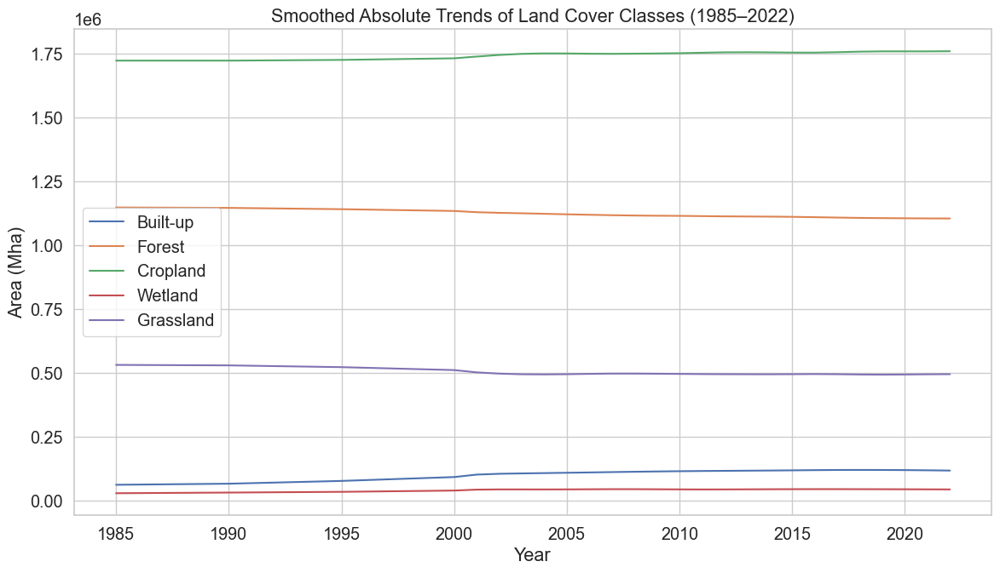

In [28]:
# Apply Gaussian smoothing on absolute values
smoothed_abs = pivot_df[classes].apply(lambda x: gaussian_filter1d(x, sigma=1), axis=0)

# Plot
plt.figure(figsize=(12, 7))
for col in smoothed_abs.columns:
    plt.plot(smoothed_abs.index, smoothed_abs[col], label=col)

plt.title("Smoothed Absolute Trends of Land Cover Classes (1985–2022)")
plt.xlabel("Year")
plt.ylabel("Area (Mha)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


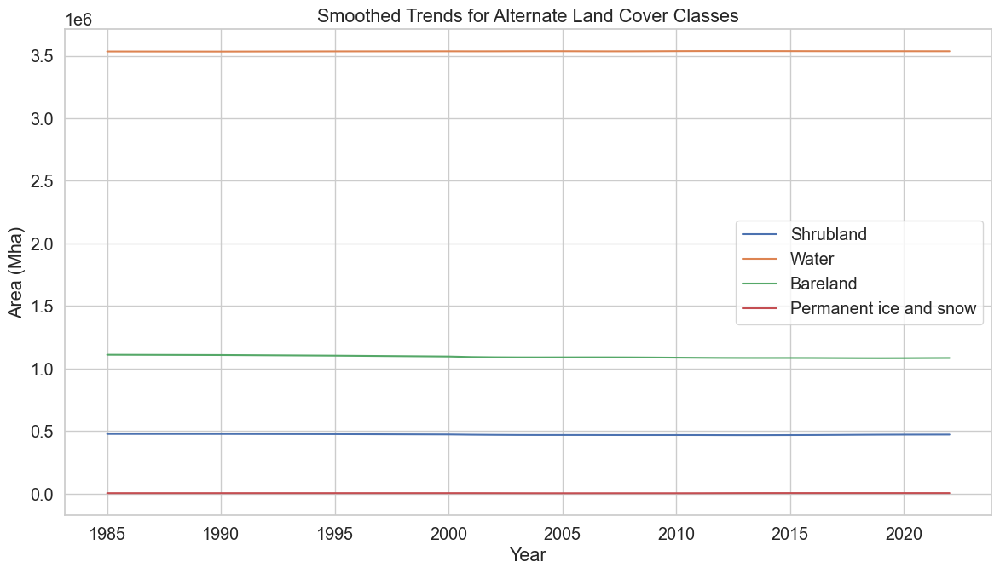

In [29]:
alt_classes = ['Shrubland', 'Water', 'Bareland', 'Permanent ice and snow']

smoothed_alt = pivot_df[alt_classes].apply(lambda x: gaussian_filter1d(x, sigma=1), axis=0)

plt.figure(figsize=(12, 7))
for col in smoothed_alt.columns:
    plt.plot(smoothed_alt.index, smoothed_alt[col], label=col)

plt.title("Smoothed Trends for Alternate Land Cover Classes")
plt.xlabel("Year")
plt.ylabel("Area (Mha)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


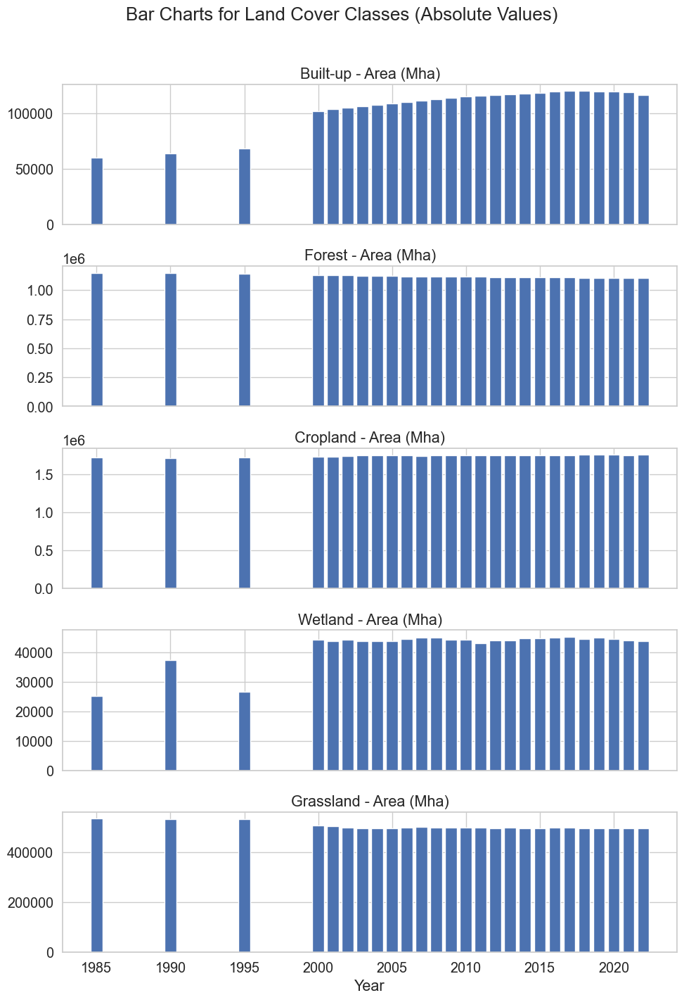

In [30]:
fig, axs = plt.subplots(len(classes), 1, figsize=(10, 3 * len(classes)), sharex=True)

for i, col in enumerate(classes):
    axs[i].bar(pivot_df.index, pivot_df[col])
    axs[i].set_title(f"{col} - Area (Mha)")
    axs[i].grid(True)

plt.suptitle("Bar Charts for Land Cover Classes (Absolute Values)")
plt.xlabel("Year")
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()


/var/folders/mz/wk_rk1fs2m96vphdr62m5bym0000gn/T/grass8-ghulamabbaszafari-19577/ipykernel_19624/3773510665.py:73: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  fig.tight_layout(pad=3)
/var/folders/mz/wk_rk1fs2m96vphdr62m5bym0000gn/T/grass8-ghulamabbaszafari-19577/ipykernel_19624/3773510665.py:75: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  anim.save("land_cover_final_pro.mp4", writer="ffmpeg")


✅ land_cover_final_pro.mp4 saved.


/opt/anaconda3/envs/Geogis/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  func(*args, **kwargs)
/opt/anaconda3/envs/Geogis/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 127757 (\N{EARTH GLOBE EUROPE-AFRICA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


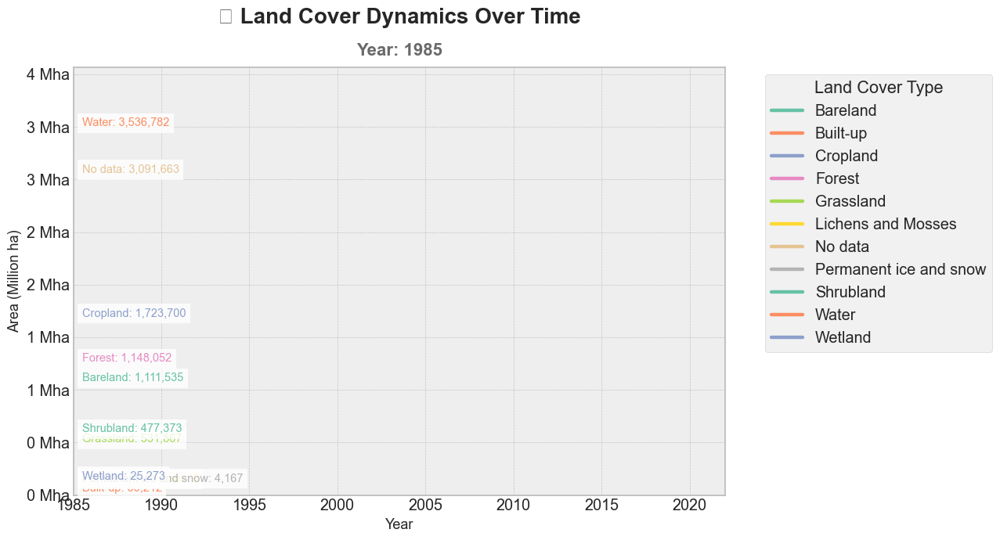

In [31]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Video
import pandas as pd
import matplotlib.ticker as ticker

# === Load and prepare data ===
df = pd.read_csv("/Users/ghulamabbaszafari/Downloads/Thesis/land_cover_stats.csv")
df_pivot = df.pivot(index="Year", columns="Class", values="Area_Mha").fillna(0)
years = df_pivot.index.tolist()

# === Plot setup ===
plt.style.use('bmh')
plt.rcParams["font.family"] = "Arial"

fig, ax = plt.subplots(figsize=(14, 8))
colors = plt.cm.Set2.colors
class_list = df_pivot.columns.tolist()

lines = {}
labels = {}

for idx, cls in enumerate(class_list):
    color = colors[idx % len(colors)]
    line, = ax.plot([], [], label=cls, linewidth=3.2, color=color)
    lines[cls] = line
    labels[cls] = ax.text(0, 0, "", fontsize=10.5, va='center', ha='left', color=color,
                          bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

# === Axes and Titles ===
ax.set_xlim(min(years), max(years))
ax.set_ylim(0, df_pivot.max().max() * 1.15)
ax.set_title("🌍 Land Cover Dynamics Over Time", fontsize=20, weight='bold', pad=40)
ax.set_xlabel("Year", fontsize=13)
ax.set_ylabel("Area (Million ha)", fontsize=13)
ax.legend(title="Land Cover Type", bbox_to_anchor=(1.05, 1), loc="upper left")
ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.7)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{int(x / 1e6)} Mha'))

# === Year display (clean and well-spaced) ===
year_text = ax.text(0.5, 1.02, "", transform=ax.transAxes, ha="center", va="bottom",
                    fontsize=16, weight='bold', color="dimgray")

# === Animation logic ===
def animate(i):
    current_year = years[i]
    year_text.set_text(f"Year: {current_year}")

    y_positions = []
    for cls in class_list:
        x = years[:i+1]
        y = df_pivot[cls].iloc[:i+1]
        lines[cls].set_data(x, y)

        if len(x) > 0:
            value = y.iloc[-1]

            # Prevent label overlap
            offset = 0
            for prev in y_positions:
                if abs(prev - value + offset) < 1e5:
                    offset += 1.5e5
            final_y = value + offset
            y_positions.append(final_y)

            label_text = f"{cls}: {value:,.0f}"
            labels[cls].set_text(label_text)
            labels[cls].set_position((x[-1] + 0.5, final_y))

    return list(lines.values()) + list(labels.values()) + [year_text]

# === Animate and Save ===
fig.tight_layout(pad=3)
anim = FuncAnimation(fig, animate, frames=len(years), interval=300)
anim.save("land_cover_final_pro.mp4", writer="ffmpeg")
print("✅ land_cover_final_pro.mp4 saved.")

# === Display in Notebook ===
Video("land_cover_final_pro.mp4", embed=True, width=800)


In [4]:
pip install imageio\[ffmpeg\]


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.9/24.9 MB 3.3 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
import grass.script as gs
import os
from datetime import datetime

def log_message(message):
    """Helper function for logging with timestamp"""
    print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {message}")

def safe_remove_raster(name):
    """Safely remove raster if it exists"""
    try:
        if name in gs.list_strings(type='raster'):
            gs.run_command('g.remove', type='raster', name=name, flags='f', quiet=True)
            return True
    except:
        pass
    return False

# 1. Verify GRASS environment
log_message("Checking GRASS GIS environment...")
location_info = gs.read_command('g.gisenv', flags='n').strip()
mapset_info = gs.read_command('g.mapset', flags='p').strip()
log_message(f"Current location: {location_info}")
log_message(f"Current mapset: {mapset_info}")

# 2. Define all input files with target names
input_files = {
    'GLC_FCS30_2011': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2011_mosaic_reclass.tif',
    'GLC_FCS30_2012': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2012_mosaic_reclass.tif',
    'GLC_FCS30_2013': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2013_mosaic_reclass.tif',
    'GLC_FCS30_2014': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2014_mosaic_reclass.tif',
    'GLC_FCS30_2015': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2015_mosaic_reclass.tif',
    'GLC_FCS30_2016': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2016_mosaic_reclass.tif',
    'GLC_FCS30_2017': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2017_mosaic_reclass.tif',
    'GLC_FCS30_2018': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2018_mosaic_reclass.tif',
    'GLC_FCS30_2019': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2019_mosaic_reclass.tif',
    'GLC_FCS30_2020': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2020_mosaic_reclass.tif',
    'GLC_FCS30_2021': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2021_mosaic_reclass.tif',
    'GLC_FCS30_2022': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2022_mosaic_reclass.tiff',
    
}

# 3. Target projection parameters
target_epsg = "EPSG:3035"  # ETRS89-extended / LAEA Europe
target_resolution = 23.51040463  # meters (correct for EPSG:3035)

# 4. Processing workflow
def process_rasters():
    """Main processing workflow"""
    # First clean any existing rasters (only if they exist)
    log_message("Cleaning existing rasters if present...")
    for raster in input_files.keys():
        if safe_remove_raster(raster):
            log_message(f"Removed existing {raster}")
    
    # Process each file
    for output_name, input_path in input_files.items():
        log_message(f"\nProcessing {output_name}...")
        
        # Verify input file exists
        if not os.path.exists(input_path):
            log_message(f"Error: Input file not found - {input_path}")
            continue
        
        # Create temporary output path
        temp_output = f"/tmp/{output_name}_3035.tif"
        
        # Step 1: Reproject with GDAL
        log_message(f"Reprojecting to {target_epsg} with gdalwarp...")
        cmd = f"gdalwarp -t_srs {target_epsg} -tr {target_resolution} {target_resolution} -r near -overwrite -co COMPRESS=LZW {input_path} {temp_output}"
        ret = os.system(cmd)
        if ret != 0:
            log_message(f"Error in gdalwarp for {output_name}")
            continue
        
        # Step 2: Import to GRASS
        log_message(f"Importing {output_name} to GRASS...")
        try:
            gs.run_command('r.import',
                          input=temp_output,
                          output=output_name,
                          resolution='value',
                          resolution_value=target_resolution,
                          flags='o',
                          quiet=True)
        except Exception as e:
            log_message(f"Error importing {output_name}: {str(e)}")
            continue
        
        # Clean up temporary file
        if os.path.exists(temp_output):
            os.remove(temp_output)
        
        # Verify the imported raster
        try:
            info = gs.parse_command('r.info', map=output_name, flags='g')
            if info:
                log_message(f"Successfully imported {output_name}")
                log_message(f"Resolution: {info.get('nsres', 'N/A')}m x {info.get('ewres', 'N/A')}m")
                log_message(f"Extent: n={info.get('north', 'N/A')} s={info.get('south', 'N/A')} e={info.get('east', 'N/A')} w={info.get('west', 'N/A')}")
            else:
                log_message(f"Warning: Could not verify {output_name}")
        except:
            log_message(f"Warning: Could not verify {output_name}")
    
    # Final region setting
    log_message("\nSetting computational region...")
    existing_rasters = [r for r in input_files.keys() if r in gs.list_strings(type='raster')]
    if existing_rasters:
        gs.run_command('g.region', raster=','.join(existing_rasters), quiet=True)
    
    # Final verification
    log_message("\nFinal verification:")
    try:
        region = gs.parse_command('g.region', flags='ug')
        if region:
            log_message(f"Region resolution: {region.get('nsres', 'N/A')} x {region.get('ewres', 'N/A')}")
            log_message(f"Region extent: N={region.get('north', 'N/A')} S={region.get('south', 'N/A')} E={region.get('east', 'N/A')} W={region.get('west', 'N/A')}")
        else:
            log_message("Could not get region information")
    except:
        log_message("Could not get region information")

# Run the processing
process_rasters()

log_message("\nProcessing complete. All rasters should now be properly:")
log_message(f"- Projected in {target_epsg}")
log_message(f"- At consistent {target_resolution}m resolution")
log_message("- Ready for analysis")




[2025-04-18 10:39:20] Checking GRASS GIS environment...
[2025-04-18 10:39:20] Current location: GISDBASE=/Users/ghulamabbaszafari/grassdata
LOCATION_NAME=my_location
MAPSET=PERMANENT
GUI=wxpython
PID=16769
GUI_PID=16772
[2025-04-18 10:39:20] Current mapset: PERMANENT
[2025-04-18 10:39:20] Cleaning existing rasters if present...
[2025-04-18 10:39:22] 
Processing GLC_FCS30_2011...
[2025-04-18 10:39:22] Reprojecting to EPSG:3035 with gdalwarp...
Creating output file that is 204598P x 103552L.
Processing /Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2011_mosaic_reclass.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-18 10:54:32] Importing GLC_FCS30_2011 to GRASS...
[2025-04-18 10:59:51] Successfully imported GLC_FCS30_2011
[2025-04-18 10:59:51] Resolution: 23.51040463m x 23.51040463m
[2025-04-18 10:59:51] Extent: n=3215741.69097582 s=781192.27073006 e=7189524.9854

In [1]:
import seaborn as sns
sns.set_theme(style="whitegrid")


In [13]:
import grass.script as gs
import os
from datetime import datetime

def log_message(message):
    """Helper function for logging with timestamp"""
    print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {message}")

def safe_remove_raster(name):
    """Safely remove raster if it exists"""
    try:
        if name in gs.list_strings(type='raster'):
            gs.run_command('g.remove', type='raster', name=name, flags='f', quiet=True)
            return True
    except:
        pass
    return False

# 1. Verify GRASS environment
log_message("Checking GRASS GIS environment...")
location_info = gs.read_command('g.gisenv', flags='n').strip()
mapset_info = gs.read_command('g.mapset', flags='p').strip()
log_message(f"Current location: {location_info}")
log_message(f"Current mapset: {mapset_info}")

# 2. Define all input files with target names
input_files = {
  
    'GLC_FCS30_2022': '/Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2022_mosaic_reclass.tif',
    
}

# 3. Target projection parameters
target_epsg = "EPSG:3035"  # ETRS89-extended / LAEA Europe
target_resolution = 23.51040463  # meters (correct for EPSG:3035)

# 4. Processing workflow
def process_rasters():
    """Main processing workflow"""
    # First clean any existing rasters (only if they exist)
    log_message("Cleaning existing rasters if present...")
    for raster in input_files.keys():
        if safe_remove_raster(raster):
            log_message(f"Removed existing {raster}")
    
    # Process each file
    for output_name, input_path in input_files.items():
        log_message(f"\nProcessing {output_name}...")
        
        # Verify input file exists
        if not os.path.exists(input_path):
            log_message(f"Error: Input file not found - {input_path}")
            continue
        
        # Create temporary output path
        temp_output = f"/tmp/{output_name}_3035.tif"
        
        # Step 1: Reproject with GDAL
        log_message(f"Reprojecting to {target_epsg} with gdalwarp...")
        cmd = f"gdalwarp -t_srs {target_epsg} -tr {target_resolution} {target_resolution} -r near -overwrite -co COMPRESS=LZW {input_path} {temp_output}"
        ret = os.system(cmd)
        if ret != 0:
            log_message(f"Error in gdalwarp for {output_name}")
            continue
        
        # Step 2: Import to GRASS
        log_message(f"Importing {output_name} to GRASS...")
        try:
            gs.run_command('r.import',
                          input=temp_output,
                          output=output_name,
                          resolution='value',
                          resolution_value=target_resolution,
                          flags='o',
                          quiet=True)
        except Exception as e:
            log_message(f"Error importing {output_name}: {str(e)}")
            continue
        
        # Clean up temporary file
        if os.path.exists(temp_output):
            os.remove(temp_output)
        
        # Verify the imported raster
        try:
            info = gs.parse_command('r.info', map=output_name, flags='g')
            if info:
                log_message(f"Successfully imported {output_name}")
                log_message(f"Resolution: {info.get('nsres', 'N/A')}m x {info.get('ewres', 'N/A')}m")
                log_message(f"Extent: n={info.get('north', 'N/A')} s={info.get('south', 'N/A')} e={info.get('east', 'N/A')} w={info.get('west', 'N/A')}")
            else:
                log_message(f"Warning: Could not verify {output_name}")
        except:
            log_message(f"Warning: Could not verify {output_name}")
    
    # Final region setting
    log_message("\nSetting computational region...")
    existing_rasters = [r for r in input_files.keys() if r in gs.list_strings(type='raster')]
    if existing_rasters:
        gs.run_command('g.region', raster=','.join(existing_rasters), quiet=True)
    
    # Final verification
    log_message("\nFinal verification:")
    try:
        region = gs.parse_command('g.region', flags='ug')
        if region:
            log_message(f"Region resolution: {region.get('nsres', 'N/A')} x {region.get('ewres', 'N/A')}")
            log_message(f"Region extent: N={region.get('north', 'N/A')} S={region.get('south', 'N/A')} E={region.get('east', 'N/A')} W={region.get('west', 'N/A')}")
        else:
            log_message("Could not get region information")
    except:
        log_message("Could not get region information")

# Run the processing
process_rasters()

log_message("\nProcessing complete. All rasters should now be properly:")
log_message(f"- Projected in {target_epsg}")
log_message(f"- At consistent {target_resolution}m resolution")
log_message("- Ready for analysis")




[2025-04-18 17:02:47] Checking GRASS GIS environment...
[2025-04-18 17:02:47] Current location: GISDBASE=/Users/ghulamabbaszafari/grassdata
LOCATION_NAME=my_location
MAPSET=PERMANENT
GUI=wxpython
PID=19588
GUI_PID=19591
[2025-04-18 17:02:47] Current mapset: PERMANENT
[2025-04-18 17:02:47] Cleaning existing rasters if present...
[2025-04-18 17:02:47] 
Processing GLC_FCS30_2022...
[2025-04-18 17:02:47] Reprojecting to EPSG:3035 with gdalwarp...
Creating output file that is 204598P x 103552L.
Processing /Users/ghulamabbaszafari/Downloads/rest/reclassification/OneDrive_1_04-04-2025/reclass_data/GLC_FCS30D_reclass/GLC_FCS30D_reclass/GLC_FCS30_2022_mosaic_reclass.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-18 17:18:57] Importing GLC_FCS30_2022 to GRASS...
[2025-04-18 17:24:43] Successfully imported GLC_FCS30_2022
[2025-04-18 17:24:43] Resolution: 23.51040463m x 23.51040463m
[2025-04-18 17:24:43] Extent: n=3215741.69097582 s=781192.27073006 e=7189524.9854

In [16]:
import rasterio
import xarray as xr
import os

# Path to your NetCDF file
netcdf_path = "/Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc"

# --- Method 1: Using rasterio to check CRS and metadata ---
print("=== Rasterio Inspection ===")
try:
    with rasterio.open(netcdf_path) as src:
        print(f"Driver: {src.driver}")
        print(f"CRS: {src.crs}")
        print(f"Bounds: {src.bounds}")
        print(f"Width x Height: {src.width} x {src.height}")
        print(f"Number of bands: {src.count}")
        print(f"Transform: {src.transform}")
except Exception as e:
    print("Rasterio could not open the file directly (possibly multi-band NetCDF).")

# --- Method 2: Using xarray for structure ---
print("\n=== xarray Inspection ===")
try:
    ds = xr.open_dataset(netcdf_path)
    print(f"Dimensions: {ds.dims}")
    print(f"Variables: {list(ds.variables)}")

    # Try to find coordinate reference info
    if 'crs' in ds:
        print("\nCRS Info:")
        print(ds.crs.attrs)

    # Optional: show one variable
    for var_name in ds.data_vars:
        print(f"\nVariable: {var_name}")
        print(ds[var_name])
        break  # just print the first one
except Exception as e:
    print(f"Error reading NetCDF with xarray: {e}")


=== Rasterio Inspection ===
Driver: HDF5
CRS: None
Bounds: BoundingBox(left=0.0, bottom=512.0, right=512.0, top=0.0)
Width x Height: 512 x 512
Number of bands: 0
Transform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|

=== xarray Inspection ===
Dimensions: FrozenMappingWarningOnValuesAccess({'time': 1, 'lat': 6480, 'lon': 18000, 'bounds': 2})
Variables: ['WATER', 'BARE', 'BUILT', 'GRASS-MAN', 'GRASS-NAT', 'SHRUBS-BD', 'SHRUBS-BE', 'SHRUBS-ND', 'SHRUBS-NE', 'WATER_INLAND', 'SNOWICE', 'TREES-BD', 'TREES-BE', 'TREES-ND', 'TREES-NE', 'LAND', 'WATER_OCEAN', 'lon', 'lat', 'lat_bounds', 'lon_bounds', 'time_bounds', 'time']

Variable: WATER
<xarray.DataArray 'WATER' (time: 1, lat: 6480, lon: 18000)> Size: 117MB
[116640000 values with dtype=int8]
Coordinates:
  * lon      (lon) float64 144kB -9.999 -9.996 -9.993 -9.99 ... 39.99 40.0 40.0
  * lat      (lat) float64 52kB 48.0 48.0 47.99 47.99 ... 30.01 30.01 30.0 30.0
  * time     (time) datetime64[ns] 8B 1992-01-01
Attributes:
   

/opt/anaconda3/envs/Geogis/lib/python3.10/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [17]:
import os
import grass.script as gs
from datetime import datetime

def log(msg):
    print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {msg}")

def run_command(command):
    log(f"Running: {command}")
    result = os.system(command)
    if result != 0:
        log(f"❌ Command failed: {command}")
        return False
    return True

# === Paths ===
nc_file = "/Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc"
variable = "TREES-NE"
tif_4326 = "/tmp/TREES_NE_1992_4326.tif"
tif_europe = "/tmp/TREES_NE_1992_Europe_4326.tif"
tif_3035 = "/tmp/TREES_NE_1992_3035.tif"
grass_raster = "TREES_NE_1992"

# === Step 1: Properly extract with georeferencing ===
log("Extracting with correct georeferencing...")
gdal_extract_cmd = (
    f"gdal_translate -of GTiff -a_srs EPSG:4326 "
    f"-a_ullr -180 90 180 -90 "  # Explicit global bounds
    f"-a_nodata 255 'HDF5:\"{nc_file}\"://{variable}' {tif_4326}"
)
if not run_command(gdal_extract_cmd):
    exit(1)

# === Step 2: Correctly clip to Europe ===
log("Clipping to European extent...")
# Calculate pixel coordinates for the geographic bounds
# Formula: x = (lon + 180)/360 * width, y = (90 - lat)/180 * height
west, south, east, north = -25, 35, 45, 72
width, height = 18000, 6480

xmin = int((west + 180)/360 * width)
ymax = int((90 - north)/180 * height)
xmax = int((east + 180)/360 * width)
ymin = int((90 - south)/180 * height)

gdal_clip_cmd = (
    f"gdal_translate -srcwin {xmin} {ymax} {xmax-xmin} {ymin-ymax} "
    f"-co COMPRESS=LZW {tif_4326} {tif_europe}"
)
if not run_command(gdal_clip_cmd):
    exit(1)

# === Step 3: Reproject to EPSG:3035 ===
log("Reprojecting to EPSG:3035...")
gdal_warp_cmd = (
    f"gdalwarp -t_srs EPSG:3035 -tr 300 300 -r near -overwrite "
    f"-te 2000000 900000 7000000 4500000 "  # EPSG:3035 bounds
    f"-co COMPRESS=LZW -dstnodata 255 {tif_europe} {tif_3035}"
)
if not run_command(gdal_warp_cmd):
    exit(1)

# === Step 4: Import into GRASS ===
log(f"Importing {grass_raster} into GRASS...")
try:
    gs.run_command('r.import',
                   input=tif_3035,
                   output=grass_raster,
                   resolution='value',
                   resolution_value=300,
                   flags='o',
                   overwrite=True,
                   quiet=True)
    log(f"✅ Successfully imported: {grass_raster}")
except Exception as e:
    log(f"❌ Import failed: {e}")
    exit(1)

# === Step 5: Set computational region ===
log("Setting computational region...")
try:
    gs.run_command('g.region', raster=grass_raster, flags='p', quiet=True)
    log("✅ Region set successfully.")
except Exception as e:
    log(f"⚠️ Could not set region: {e}")

log("✅ All steps completed.")

[2025-04-18 23:25:31] Extracting with correct georeferencing...
[2025-04-18 23:25:31] Running: gdal_translate -of GTiff -a_srs EPSG:4326 -a_ullr -180 90 180 -90 -a_nodata 255 'HDF5:"/Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc"://TREES-NE' /tmp/TREES_NE_1992_4326.tif
Input file size is 18000, 6480
0

Warning 1: for band 1, nodata value has been clamped to 127, the original value being out of range.


...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-18 23:25:31] Clipping to European extent...
[2025-04-18 23:25:31] Running: gdal_translate -srcwin 7750 648 3500 1332 -co COMPRESS=LZW /tmp/TREES_NE_1992_4326.tif /tmp/TREES_NE_1992_Europe_4326.tif
Input file size is 18000, 6480
0...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-18 23:25:31] Reprojecting to EPSG:3035...
[2025-04-18 23:25:31] Running: gdalwarp -t_srs EPSG:3035 -tr 300 300 -r near -overwrite -te 2000000 900000 7000000 4500000 -co COMPRESS=LZW -dstnodata 255 /tmp/TREES_NE_1992_Europe_4326.tif /tmp/TREES_NE_1992_3035.tif


Warning 1: for band 1, destination nodata value has been clamped to 127, the original value being out of range.


Creating output file that is 16667P x 12000L.
Using internal nodata values (e.g. 127) for image /tmp/TREES_NE_1992_Europe_4326.tif.
Processing /tmp/TREES_NE_1992_Europe_4326.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
[2025-04-18 23:25:39] Importing TREES_NE_1992 into GRASS...
[2025-04-18 23:25:44] ✅ Successfully imported: TREES_NE_1992
[2025-04-18 23:25:44] Setting computational region...
projection: 99 (ETRS89-extended / LAEA Europe)
zone:       0
datum:      etrs89
ellipsoid:  grs80
north:      4500000
south:      900000
west:       2000000
east:       7000100
nsres:      300
ewres:      300
rows:       12000
cols:       16667
cells:      200004000
[2025-04-18 23:25:44] ✅ Region set successfully.
[2025-04-18 23:25:44] ✅ All steps completed.


In [39]:
import xarray as xr

path = "/Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc"
ds = xr.open_dataset(path)

print("=== Variables in NetCDF ===")
print(ds.data_vars.keys())


=== Variables in NetCDF ===
KeysView(Data variables:
    WATER         (time, lat, lon) int8 117MB ...
    BARE          (time, lat, lon) int8 117MB ...
    BUILT         (time, lat, lon) int8 117MB ...
    GRASS-MAN     (time, lat, lon) int8 117MB ...
    GRASS-NAT     (time, lat, lon) int8 117MB ...
    SHRUBS-BD     (time, lat, lon) int8 117MB ...
    SHRUBS-BE     (time, lat, lon) int8 117MB ...
    SHRUBS-ND     (time, lat, lon) int8 117MB ...
    SHRUBS-NE     (time, lat, lon) int8 117MB ...
    WATER_INLAND  (time, lat, lon) int8 117MB ...
    SNOWICE       (time, lat, lon) int8 117MB ...
    TREES-BD      (time, lat, lon) int8 117MB ...
    TREES-BE      (time, lat, lon) int8 117MB ...
    TREES-ND      (time, lat, lon) int8 117MB ...
    TREES-NE      (time, lat, lon) int8 117MB ...
    LAND          (time, lat, lon) int8 117MB ...
    WATER_OCEAN   (time, lat, lon) int8 117MB ...
    lat_bounds    (lat, bounds) float64 104kB ...
    lon_bounds    (lon, bounds) float64 288kB .

In [43]:
import subprocess

# Define the path to your NetCDF file
netcdf_path = "/Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc"

# Run gdalinfo
result = subprocess.run(
    ["gdalinfo", netcdf_path],
    capture_output=True,
    text=True
)

# Print the output
print(result.stdout)

# Optional: check for errors
if result.returncode != 0:
    print("Error running gdal")


Driver: HDF5/Hierarchical Data Format Release 5
Files: /Users/ghulamabbaszafari/Downloads/rest/data/Global_Plant_Functional_Types_PFT/ESACCI-LC-L4-PFT-Map-300m-P1Y-1992-v2.0.8.nc
Size is 512, 512
Metadata:
  BARE_description=Percentage cover of bare soil in the 300 m pixel.
  BARE_long_name=Bare
  BARE__Netcdf4Coordinates=0 1 2
  BARE__Netcdf4Dimid=0
  bounds_CLASS=DIMENSION_SCALE
  bounds_NAME=This is a netCDF dimension but not a netCDF variable.         2
  bounds_REFERENCE_LIST=
  bounds__Netcdf4Dimid=3
  BUILT_description=Percentage cover of built (artificial impervious area, e.g., buildings) in the 300 m pixel.
  BUILT_long_name=Built
  BUILT__Netcdf4Coordinates=0 1 2
  BUILT__Netcdf4Dimid=0
  cdm_data_type=grid
  citation=Harper et al., submitted. A 29-year time series of annual 300-metre resolution plant functional type maps for climate models . Kandice L. Harper, Céline Lamarche, Andrew Hartley, Philippe Peylin, Catherine Ottlé, Vladislav Bastrikov, Rodrigo San Martín, Sylvia I

Raster Info:
Rows: 12000, Cols: 16667
North: 4500000.0, South: 900000.0
East: 7000100.0, West: 2000000.0
Min: 0.0, Max: 94.0



Color table for raster map <TREES_NE_1992> set to 'viridis'


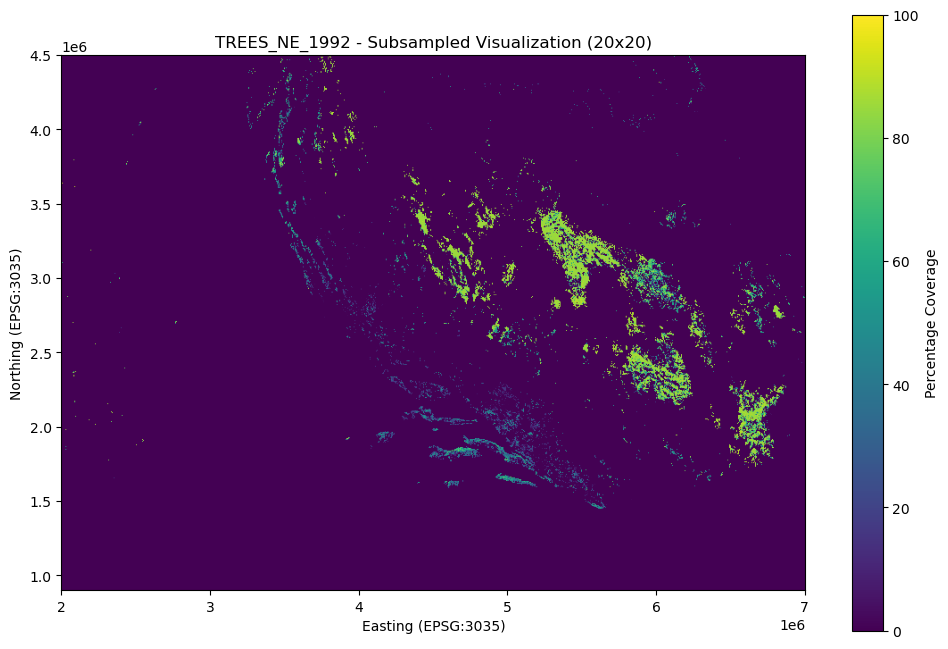

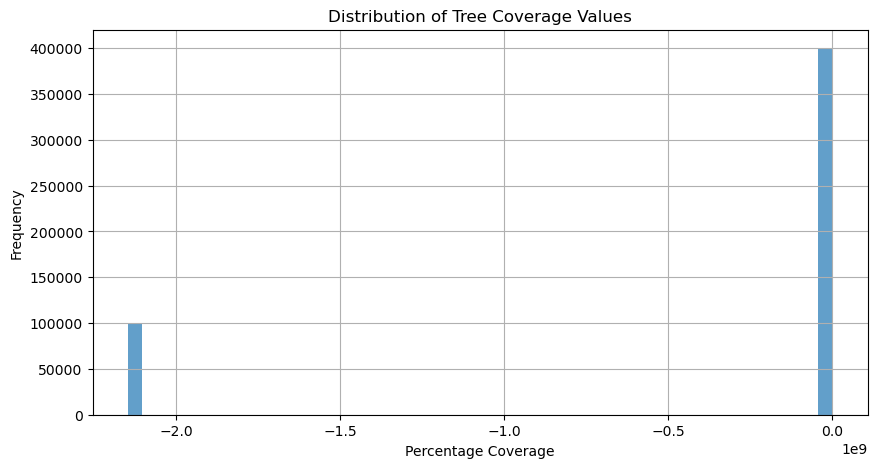

In [13]:
import grass.script as gs
import matplotlib.pyplot as plt
import numpy as np
from grass.pygrass.raster import RasterRow

# 1. Get raster information and convert to numeric values
raster_info = gs.raster_info('TREES_NE_1992')
rows = int(raster_info['rows'])
cols = int(raster_info['cols'])
north = float(raster_info['north'])
south = float(raster_info['south'])
east = float(raster_info['east'])
west = float(raster_info['west'])

print("Raster Info:")
print(f"Rows: {rows}, Cols: {cols}")
print(f"North: {north}, South: {south}")
print(f"East: {east}, West: {west}")
print(f"Min: {raster_info['min']}, Max: {raster_info['max']}")

# 2. Set color table
gs.run_command('r.colors', map='TREES_NE_1992', color='viridis', flags='e')

# 3. Visualization with optimized subsampling
plt.figure(figsize=(12, 8))

# Subsampling parameters - adjust these based on your system memory
row_step = 20  # Only read every 20th row
col_step = 20  # Only read every 20th column

with RasterRow('TREES_NE_1992') as rast:
    # Calculate dimensions for subsampled array
    subsampled_rows = (rows + row_step - 1) // row_step
    subsampled_cols = (cols + col_step - 1) // col_step
    
    # Initialize array
    data = np.empty((subsampled_rows, subsampled_cols), dtype=np.float32)
    
    # Read subsampled data
    for i, row in enumerate(range(0, rows, row_step)):
        full_row = rast[row]
        data[i] = full_row[::col_step]

# Mask nodata values (assuming 255 is nodata)
data = np.ma.masked_equal(data, 255)

# Calculate extent for subsampled data
x_res = (east - west) / cols * col_step
y_res = (north - south) / rows * row_step

extent = [west, west + subsampled_cols * x_res, 
          south, south + subsampled_rows * y_res]

# Create visualization
img = plt.imshow(data, extent=extent, cmap='viridis', vmin=0, vmax=100)
plt.colorbar(img, label='Percentage Coverage')
plt.title('TREES_NE_1992 - Subsampled Visualization (20x20)')
plt.xlabel('Easting (EPSG:3035)')
plt.ylabel('Northing (EPSG:3035)')
plt.show()

# 4. Histogram of values
plt.figure(figsize=(10, 5))
plt.hist(data.compressed(), bins=50, alpha=0.7)
plt.title('Distribution of Tree Coverage Values')
plt.xlabel('Percentage Coverage')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [1]:
import grass.script as gscript

# List all raster maps in the current location/mapset
raster_maps = gscript.read_command('g.list', type='raster')

# Print the available raster maps
print(raster_maps)


GLC_FCS30_1985
GLC_FCS30_1985_avg
GLC_FCS30_1990
GLC_FCS30_1995
GLC_FCS30_2000
GLC_FCS30_2001
GLC_FCS30_2002
GLC_FCS30_2003
GLC_FCS30_2004
GLC_FCS30_2005
GLC_FCS30_2006
GLC_FCS30_2007
GLC_FCS30_2008
GLC_FCS30_2009
GLC_FCS30_2010
GLC_FCS30_2011
GLC_FCS30_2012
GLC_FCS30_2013
GLC_FCS30_2014
GLC_FCS30_2015
GLC_FCS30_2016
GLC_FCS30_2017
GLC_FCS30_2018
GLC_FCS30_2019
GLC_FCS30_2020
GLC_FCS30_2021
GLC_FCS30_2022
TREES_NE_1992
change_2016_2022
landcover_1992
landcover_1993
landcover_1994
landcover_1995
landcover_1996
landcover_1997
landcover_1998
landcover_1999
landcover_2000
landcover_2001
landcover_2002
landcover_2003
landcover_2004
landcover_2005
landcover_2006
landcover_2007
landcover_2008
landcover_2009
landcover_2010
landcover_2011
landcover_2012
landcover_2013
landcover_2014
landcover_2015
landcover_2016
landcover_2017
landcover_2018
landcover_2019
landcover_2020
landcover_2021
landcover_2022
lc_change_2000_2022
lc_map
transitions_2016_2022



In [2]:
import grass.script as gs
import matplotlib.pyplot as plt
import numpy as np
# For GLC_FCS30D
for year in range(1985, 2022):
    next_year = year + 1
    if (gs.find_file(f"GLC_FCS30_{year}", element='raster')['file'] and 
        gs.find_file(f"GLC_FCS30_{next_year}", element='raster')['file']):
        gs.mapcalc(f"forest_change_{year}_{next_year} = GLC_FCS30_{next_year} - GLC_FCS30_{year}")
        gs.run_command('r.stats', flags='ac', input=f"forest_change_{year}_{next_year}")



        

-20 18240.391154 33
-15 3019386668.780509 5462589
-13 827519011.056867 1497124
-12 7665971549.952373 13869059
-11 419840188.657426 759563
-10 43119731.947902 78011
-9 13278452.020689 24023
-8 836585038.199023 1513526
-7 1005962546.749947 1819959
-6 1736822408.784354 3142210
-5 5257730843.466222 9512138
-4 1296687850.298457 2345931
-3 6834588339.139871 12364944
-2 1933936366.712833 3498823
-1 7407960111.448312 13402272
0 11630946709873.533203 21042385330
1 10018837745.297009 18125798
2 1179400476.942136 2133738
3 8671572605.953568 15688364
4 1025313943.545879 1854969
5 7144927037.982675 12926400
6 1969138663.428295 3562510
7 852705674.804374 1542691
8 900125717.149984 1628482
9 12866661.371918 23278
10 41091179.355986 74341
11 454092326.807963 821531
12 5444284720.473569 9849646
13 1148033084.282633 2076989
15 2513751418.607368 4547808
20 8843.826014 16


-20 13818.478147 25
-15 3032907773.274082 5487051
-13 990142600.229056 1791338
-12 6916990135.335452 12514023
-11 510803361.119949 924131
-10 36033063.615216 65190
-9 12045843.770007 21793
-8 837581626.842926 1515329
-7 1051304289.982369 1901990
-6 1828410729.217965 3307909
-5 5921833085.123908 10713613
-4 2001144469.778290 3620414
-3 7219911075.104579 13062059
-2 1682173091.399995 3043340
-1 7434565103.809958 13450405
0 11627558961471.080078 21036256302
1 12493376746.275871 22602664
2 1416371347.765845 2562459
3 8485205554.770879 15351194
4 1010210346.932087 1827644
5 6387341133.388114 11555797
6 2152726542.202974 3894652
7 917910651.263264 1660658
8 917235756.790604 1659437
9 8030746.759713 14529
10 38346829.596077 69376
11 461910821.743080 835676
12 5836433784.646914 10559111
13 929807808.208012 1682182
15 2532532388.621375 4581786
20 10502.043391 19


-20 12712.999895 23
-15 3361188383.870314 6080967
-13 898914112.986126 1626290
-12 7335608218.045398 13271375
-11 556458507.436727 1006729
-10 42630557.821513 77126
-9 10634700.781670 19240
-8 856247627.122807 1549099
-7 915204993.242239 1655763
-6 1573986015.013595 2847611
-5 6090338371.443269 11018468
-4 1798333982.417595 3253495
-3 6740414857.773492 12194568
-2 1375229316.402742 2488026
-1 7328130763.146091 13257847
0 11627656811623.533203 21036433330
1 10978912995.907419 19862739
2 1289331445.270962 2332622
3 8674063801.195375 15692871
4 1426362107.467699 2580534
5 6727994809.607656 12172098
6 2406427720.782022 4353641
7 966622444.945980 1748786
8 900769658.231597 1629647
9 8393343.626281 15185
10 36808003.869676 66592
11 458075917.687948 828738
12 6281749719.891709 11364764
13 1062806238.452136 1922799
15 2863796132.279163 5181099
20 13265.739021 24


-20 13265.739021 24
-16 1105.478252 2
-15 3869090969.937193 6999850
-13 759613351.229085 1374271
-12 7355075690.070354 13306595
-11 545908928.480796 987643
-10 49357392.983263 89296
-9 11126638.603691 20130
-8 803127738.911454 1452996
-7 871470062.648656 1576639
-6 1843717181.094244 3335601
-5 5835227707.873534 10556929
-4 1465929937.800049 2652119
-3 6558911358.162284 11866197
-2 1068921191.401391 1933862
-1 7728491319.778344 13982168
0 11633935099893.138672 21047791849
1 7340087615.924167 13279479
2 1243931664.420534 2250486
3 6920889157.131705 12521077
4 1427662149.891974 2582886
5 6435040309.023139 11642093
6 2495568512.327400 4514912
7 925672214.068419 1674700
8 874240391.147405 1581651
9 7650462.241117 13841
10 29560488.451337 53480
11 425745100.738858 770246
12 5813989259.688216 10518505
13 786747867.656080 1423362
15 3194385534.203563 5779192
20 8291.086888 15


-20 7185.608636 13
-16 552.739126 1
-15 3049667929.044425 5517373
-13 797657279.782939 1443099
-12 6589755859.621926 11922000
-11 493392631.394869 892632
-10 35264203.491141 63799
-9 10068143.177657 18215
-8 769521200.059907 1392196
-7 979768239.576019 1772569
-6 2056475867.244093 3720518
-5 5352022611.005609 9682728
-4 1320739187.886660 2389444
-3 6455826616.603221 11679699
-2 1207047382.544755 2183756
-1 8051356745.438342 14566287
0 11637686367681.021484 21054578547
1 7264364013.851399 13142482
2 1287044210.767710 2328484
3 6554124637.329345 11857537
4 1477304203.534198 2672697
5 6537512615.630366 11827483
6 2174144630.585832 3933401
7 828433241.571019 1498778
8 855163152.957894 1547137
9 9141752.402704 16539
10 30424972.444192 55044
11 426968865.163485 772460
12 4956150848.817269 8966528
13 859895705.353403 1555699
15 2506632691.407109 4534929
16 1105.478252 2
20 11054.782517 20


-20 9396.565140 17
-15 3279626751.216926 5933408
-13 887200465.431159 1605098
-12 6912443303.283286 12505797
-11 441893374.300502 799461
-10 36804134.695795 66585
-9 7623378.023949 13792
-8 776381245.350804 1404607
-7 877114081.862688 1586850
-6 2885880271.308524 5221053
-5 5632271297.296041 10189746
-4 1413126769.096419 2556589
-3 7096645275.308629 12839050
-2 1360768002.650066 2461863
-1 9997246649.549171 18086736
0 11630268362923.345703 21041158082
1 8021368436.885192 14512033
2 1377446905.776121 2492038
3 7492194790.586390 13554667
4 1421630660.549422 2571974
5 6846120135.529895 12385807
6 1741048099.402372 3149855
7 1065021064.129408 1926806
8 821997147.189647 1487134
9 10207986.176501 18468
10 33019529.901009 59738
11 446917772.954458 808551
12 5502980641.024451 9955837
13 799204949.335312 1445899
15 3169699652.109398 5734531
20 13265.739021 24


-20 11607.521643 21
-16 1105.478252 2
-15 2930542145.406521 5301854
-13 799315497.160482 1446099
-12 5915970181.212247 10703006
-11 419384731.617727 758739
-10 33577796.418134 60748
-9 7299472.896192 13206
-8 749643042.877042 1356233
-7 849452805.048760 1536806
-6 2403945369.368374 4349150
-5 5328512957.750712 9640195
-4 1443598724.371855 2611718
-3 6541850512.292827 11835331
-2 1198427968.614425 2168162
-1 9509940781.103928 17205116
0 11636561487793.896484 21052543443
1 7345950519.835828 13290086
2 1473873904.518447 2666491
3 6503089681.067670 11765206
4 1339034852.956169 2422544
5 6683561216.730252 12091710
6 2196896478.479073 3974563
7 911454105.534235 1648977
8 844489760.437772 1527827
9 10279842.262863 18598
10 30129257.011853 54509
11 461471394.138031 834881
12 5074798513.213773 9181182
13 699163589.469864 1264907
15 2355097049.132109 4260775
20 6080.130385 11


-20 18793.130279 34
-16 552.739126 1
-15 3468009089.091247 6274224
-13 987880791.726087 1787246
-12 6415206923.696635 11606211
-11 490809128.720656 887958
-10 32390512.775773 58600
-9 10897804.605582 19716
-8 869994249.182642 1573969
-7 929171052.735035 1681030
-6 2163572389.328021 3914274
-5 5846207317.876479 10576793
-4 1659318986.758636 3001993
-3 7159356292.872268 12952505
-2 1402354989.009573 2537101
-1 10235189788.598091 18517216
0 11625210435657.044922 21032007409
1 12278128523.009821 22213243
2 1734099615.849841 3137284
3 8171454244.562882 14783564
4 1605922176.233717 2905389
5 6749016584.055501 12210130
6 2323850153.615545 4204244
7 881041846.090963 1593956
8 844400769.438511 1527666
9 10290897.045381 18618
10 37759820.644411 68314
11 470273764.717158 850806
12 5225362992.974757 9453579
13 945732775.162814 1710993
15 2464119314.290819 4458015
20 8291.086888 15


-20 13265.739021 24
-15 2990183249.811764 5409755
-13 789019625.463315 1427472
-12 5169984612.659360 9353390
-11 505531888.076738 914594
-10 29300701.062179 53010
-9 10350592.870974 18726
-8 750070310.221323 1357006
-7 851783153.203334 1541022
-6 1723090710.677956 3117367
-5 5932565620.737439 10733030
-4 1219960474.005596 2207118
-3 6642649677.565030 12017694
-2 1433494100.410052 2593437
-1 8019967795.939387 14509499
0 11635402027494.419922 21050445777
1 9356636373.494343 16927762
2 1440315453.963611 2605778
3 6977969421.216689 12624345
4 1342935532.968118 2429601
5 6051043041.483071 10947376
6 2712769009.999833 4907865
7 776948355.693924 1405633
8 899189377.070798 1626788
9 10020607.612832 18129
10 34363791.455111 62170
11 458278220.208009 829104
12 5550251443.836667 10041358
13 850447735.475286 1538606
15 2691092239.706134 4868648
16 1658.217378 3
20 4974.652133 9


-20 6080.130385 11
-16 552.739126 1
-15 2706309700.576569 4896179
-13 1066580893.942551 1929628
-12 5521445444.274470 9989243
-11 528651860.232701 956422
-10 30632802.355518 55420
-9 12616823.287027 22826
-8 778150563.292643 1407808
-7 886824602.825583 1604418
-6 1832568985.662615 3315432
-5 5806318346.094737 10504627
-4 1346804706.849887 2436601
-3 7029458729.040105 12717498
-2 1774400931.002349 3210196
-1 9038329940.147287 16351891
0 11632521743133.337891 21045234840
1 10836797686.429611 19605628
2 1744604422.938844 3156289
3 6634777014.190486 12003451
4 1005059371.018311 1818325
5 5644787522.069837 10212390
6 2707850184.519974 4898966
7 714547424.820461 1292739
8 803000056.173384 1452765
9 9389932.270218 16988
10 42905269.167067 77623
11 448123849.727058 810733
12 5306987637.958894 9601252
13 1021077198.146255 1847304
15 2821506061.769668 5104589
20 7185.608636 13


-20 6632.869510 12
-16 552.739126 1
-15 2529766482.036229 4576782
-13 772809997.858702 1398146
-12 4917449160.678617 8896510
-11 478296773.128839 865321
-10 24637241.057244 44573
-9 10466115.348280 18935
-8 727631312.668405 1316410
-7 858889167.405234 1553878
-6 1874120596.718060 3390606
-5 5357866721.786979 9693301
-4 1111845253.705572 2011519
-3 5419163832.665784 9804198
-2 1403072997.134205 2538400
-1 6478518768.690459 11720753
0 11645471547635.119141 21068663296
1 7832829120.936515 14170933
2 1270295662.511784 2298183
3 5993322152.750815 10842949
4 883460632.505673 1598332
5 5534162866.090205 10012251
6 2591840744.072928 4689085
7 706049613.499677 1277365
8 804987153.330806 1456360
9 15829895.825688 28639
10 46687663.005346 84466
11 481521453.189035 871155
12 4142111486.438707 7493791
13 764588556.100841 1383272
15 2118459480.090909 3832657
20 9396.565140 17


-20 12160.260769 22
-15 3721350434.499445 6732562
-13 922142422.010755 1668314
-12 8877497778.377911 16060918
-11 422439720.766288 764266
-10 39887313.539857 72163
-9 9673487.441788 17501
-8 814069762.646738 1472792
-7 835455239.425790 1511482
-6 2233441931.254871 4040680
-5 6199463446.173505 11215894
-4 1714607270.572614 3102019
-3 8154581882.735461 14753039
-2 1442353955.860177 2609466
-1 9990247866.733158 18074074
0 11619894963305.025391 21022390792
1 11120514810.736982 20118921
2 1515265221.227362 2741375
3 8695337624.684771 15731359
4 1339323382.779924 2423066
5 6153098030.050014 11132011
6 2290138594.337357 4143254
7 929053872.040356 1680818
8 883842575.241634 1599023
9 24944011.272100 45128
10 57926507.651512 104799
11 691714324.270813 1251430
12 6884688060.800006 12455583
13 1023846421.166753 1852314
15 3740392297.380796 6767012
16 1105.478252 2
20 9396.565140 17


-20 12160.260769 22
-15 3610402978.965822 6531839
-13 991604042.477798 1793982
-12 7834841644.095029 14174574
-11 411423629.988141 744336
-10 45331241.190479 82012
-9 15961447.737645 28877
-8 858318740.627359 1552846
-7 885184073.100066 1601450
-6 2498155884.174935 4519593
-5 5942642055.008164 10751260
-4 1321437297.402757 2390707
-3 8954929897.089779 16201006
-2 1958896407.424126 3543980
-1 11928404397.729248 21580532
0 11616264506970.537109 21015822663
1 10774807993.425671 19493478
2 1826041136.584944 3303622
3 8711672171.342394 15760911
4 1596218288.138240 2887833
5 6528920285.913503 11811938
6 2293266545.049855 4148913
7 905386688.149804 1638000
8 865495505.437367 1565830
9 23914258.280611 43265
10 31978722.127002 57855
11 580124033.109901 1049544
12 8044618855.489898 14554097
13 1177237056.003101 2129824
15 3740547617.075126 6767293
16 552.739126 1
20 7185.608636 13


-20 17687.652028 32
-15 3093623955.278867 5596897
-13 1106989993.223078 2002735
-12 7494650610.524121 13559110
-11 426892587.164118 772322
-10 41638943.829716 75332
-9 12465372.766539 22552
-8 731959260.023793 1324240
-7 819022305.214334 1481752
-6 1918925630.268947 3471666
-5 5190760418.196044 9390977
-4 1270188983.860472 2297990
-3 7445144530.685531 13469545
-2 1686473954.539144 3051121
-1 9104666926.378834 16471906
0 11628606104799.068359 21038150767
1 10672275438.253687 19307979
2 1696829522.064136 3069856
3 7074679422.433225 12799310
4 1242869852.559552 2248565
5 5662161218.284726 10243822
6 2011811782.170328 3639713
7 837084714.368789 1514430
8 825080878.772752 1492713
9 16103501.692992 29134
10 36797501.826284 66573
11 421251331.645715 762116
12 6846754127.307652 12386954
13 1107345404.481075 2003378
15 3221690294.275431 5828591
20 9949.304266 18


-20 6080.130385 11
-15 3362378983.947133 6083121
-13 991208834.002817 1793267
-12 7467642118.600345 13510247
-11 424195772.969106 767443
-10 53453189.905905 96706
-9 11131060.516698 20138
-8 862282985.637939 1560018
-7 879467645.060548 1591108
-6 2121366335.154370 3837916
-5 5968458288.636716 10797966
-4 1380230500.014491 2497074
-3 8246663246.509152 14919630
-2 1754052945.558125 3173383
-1 11008964316.720957 19917107
0 11624299631858.986328 21030359606
1 9238396077.833853 16713845
2 1548377058.568416 2801280
3 7456932798.030114 13490872
4 1503638353.712645 2720340
5 6811566754.533414 12323294
6 1919645849.350082 3472969
7 854297563.486816 1545571
8 885924743.528702 1602790
9 12265833.942102 22191
10 27082006.210952 48996
11 406362750.551878 735180
12 6830379783.432942 12357330
13 1098877441.071260 1988058
15 3197386907.656270 5784622
20 9396.565140 17


-20 11054.782517 20
-15 3551724193.378473 6425679
-13 907700454.130603 1642186
-12 7693631168.566819 13919100
-11 417635865.023544 755575
-10 43689053.247541 79041
-9 10290897.045381 18618
-8 797877822.694152 1443498
-7 859524817.399959 1555028
-6 2425812834.660450 4388712
-5 5389710575.586801 9750912
-4 1163480484.636034 2104936
-3 6937185564.789620 12550560
-2 1474665979.685958 2667924
-1 9811153204.233953 17750061
0 11629906041874.509766 21040502580
1 7933358549.515130 14352808
2 1484326754.129609 2685402
3 7712729410.855470 13953652
4 1207176170.761105 2183989
5 6230504722.762076 11272053
6 2021202267.181381 3656702
7 721890011.368223 1306023
8 882041751.169621 1595765
9 11299645.950087 20443
10 24024253.366658 43464
11 399399343.044447 722582
12 6478733231.471427 11721141
13 936539618.021713 1694361
15 3188895729.206827 5769260
20 11607.521643 21


-20 11054.782517 20
-15 3677027389.485520 6652374
-13 996662710.957557 1803134
-12 7622729662.631068 13790827
-11 413663881.665202 748389
-10 39986806.582512 72343
-9 13917971.189316 25180
-8 869975456.052364 1573935
-7 1017316913.873113 1840501
-6 2062273547.936361 3731007
-5 6073072459.357989 10987231
-4 1635473268.125293 2958852
-3 7402746123.270816 13392839
-2 1688700940.477665 3055150
-1 9720055163.365782 17585249
0 11624948608507.861328 21031533718
1 11257039163.953222 20365917
2 1589487583.801340 2875656
3 7730816140.543164 13986374
4 1236756557.826356 2237505
5 6106682867.405164 11048038
6 1809237314.416420 3273221
7 833954552.699113 1508767
8 868226589.458181 1570771
9 11709225.642354 21184
10 26623232.736482 48166
11 395092399.775841 714790
12 6576141894.943486 11897370
13 1124657746.645488 2034699
15 2873619964.760738 5198872
20 9396.565140 17


-20 14371.217273 26
-15 3941624714.450056 7131076
-13 918633634.039873 1661966
-12 7029085630.129916 12716823
-11 402399611.019549 728010
-10 35595294.227533 64398
-9 12710236.199298 22995
-8 893163415.120805 1615886
-7 829209287.303710 1500182
-6 1912308790.191996 3459695
-5 6391358994.096501 11563066
-4 2348241978.494823 4248373
-3 7392392766.697862 13374108
-2 1571154332.471266 2842488
-1 8859800177.035065 16028900
0 11625817929850.650391 21033106472
1 11233054707.788916 20322525
2 1406383351.759621 2544389
3 7907943604.492204 14306828
4 1457067318.654294 2636085
5 6033923052.527110 10916403
6 1792675591.985070 3243258
7 786206736.051875 1422383
8 871905068.340698 1577426
9 14944960.485176 27038
10 30480799.095904 55145
11 401559447.548261 726490
12 6475221127.063518 11714787
13 1035883421.110341 1874091
15 2819398467.483264 5100776
20 4421.913007 8


-20 9949.304266 18
-15 3319388592.965339 6005344
-13 847965936.800229 1534116
-12 6705256227.433816 12130960
-11 410396087.953190 742477
-10 34633528.148532 62658
-9 15701107.609362 28406
-8 856726299.205791 1549965
-7 717677033.751011 1298401
-6 1996019472.602324 3611142
-5 5753640096.410853 10409323
-4 1581596680.039035 2861380
-3 7875882524.215783 14248824
-2 1463226490.734944 2647228
-1 8641007237.752659 15633066
0 11631725602680.771484 21043794483
1 8820424699.901567 15957663
2 1465502670.455676 2651346
3 6628339814.326697 11991805
4 1340543830.770059 2425274
5 5636136049.266469 10196738
6 2293841946.479739 4149954
7 796249453.229404 1440552
8 867185781.684210 1568888
9 12260306.550843 22181
10 39437383.891405 71349
11 429265496.231382 776615
12 6229728677.028884 11270649
13 966161460.515023 1747952
15 3152454191.386665 5703331
20 4421.913007 8


-20 10502.043391 19
-15 3371283058.523495 6099230
-13 814724758.510867 1473977
-12 6712023412.555949 12143203
-11 406382096.421283 735215
-10 38893488.591556 70365
-9 15570661.175657 28170
-8 928571330.783491 1679945
-7 730441438.384215 1321494
-6 2038424512.868262 3687860
-5 5392632907.347049 9756199
-4 2031445628.663802 3675234
-3 7215992154.699782 13054969
-2 1564607137.524186 2830643
-1 9550518465.836922 17278528
0 11631756069614.833984 21043849603
1 7978531154.604270 14434533
2 1449710913.626798 2622776
3 7292607877.722245 13193580
4 1315104012.497427 2379249
5 5692366200.575349 10298468
6 1832779579.269608 3315813
7 774874478.493743 1401881
8 822998710.485683 1488946
9 13348649.889674 24150
10 35677099.618160 64546
11 445943293.875589 806788
12 5937242899.223390 10741492
13 864584591.357970 1564182
15 3598896055.846404 6511021
20 9396.565140 17


-20 552.739126 1
-15 3250181785.250237 5880137
-13 1054032610.307554 1906926
-12 7045326211.136085 12746205
-11 418879528.056702 757825
-10 45361641.842401 82067
-9 13379603.280722 24206
-8 954319024.743734 1726527
-7 698813152.864077 1264273
-6 2319986507.126702 4197254
-5 5788522357.187427 10472431
-4 1304271431.106725 2359651
-3 7178428003.682860 12987009
-2 1708683565.359625 3091302
-1 10162465349.024115 18385645
0 11629022406268.451172 21038903929
1 7734801942.382232 13993585
2 1420295242.821085 2569558
3 7974235818.854527 14426762
4 2237401754.351591 4047844
5 5853067363.171815 10589204
6 1705514711.950456 3085569
7 879526235.407888 1591214
8 835549205.077184 1511652
9 13384577.932855 24215
10 29913688.752765 54119
11 445418744.445159 805839
12 6387294150.562387 11555712
13 954596499.784909 1727029
15 3186203336.925403 5764389
20 9396.565140 17


-20 12160.260769 22
-15 1205808141.424337 2181514
-13 470153820.326849 850589
-12 2920176628.581733 5283101
-11 414632833.352813 750142
-10 34061995.892390 61624
-9 12377487.245527 22393
-8 972259278.551376 1758984
-7 601157415.065788 1087597
-6 1626369654.720616 2942382
-5 6579627467.873338 11903676
-4 907756280.782313 1642287
-3 3661499289.226426 6624281
-2 784152204.721099 1418666
-1 4103072627.466747 7423163
0 11664869447686.626953 21103757482
1 3710034206.378404 6712089
2 665391781.619689 1203808
3 3750145931.993403 6784658
4 748338578.540041 1353873
5 4721193053.788985 8541449
6 1730850615.267407 3131406
7 810598008.197288 1466511
8 768935296.586509 1391136
9 8492283.929811 15364
10 32027363.170079 57943
11 431175209.911187 780070
12 2601996772.769066 4707459
13 360345560.107670 651927
15 1120113125.551787 2026477
20 12712.999895 23


In [3]:
# Compare first and last year for each dataset
gs.mapcalc("glc_total_change = GLC_FCS30_2022 - GLC_FCS30_1985")

# Calculate area statistics
gs.run_command('r.report', map='glc_total_change', units='h')




+-----------------------------------------------------------------------------+
|                         RASTER MAP CATEGORY REPORT                          |
|PROJECT: my_location                                 Tue Apr 22 12:52:56 2025|
|-----------------------------------------------------------------------------|
|          north: 3215741.69097582    east:  7189524.9854252                  |
|REGION    south:  781192.27073006    west: 2379343.21893646                  |
|          res:        23.51040463    res:       23.51040463                  |
|-----------------------------------------------------------------------------|
|MASK: none                                                                   |
|-----------------------------------------------------------------------------|
|MAP: (untitled) (glc_total_change in PERMANENT)                              |
|-----------------------------------------------------------------------------|
|                     Category Informati